# comparing_model4 — Enformer retrained on 1 / 16 / 42 cell typesSelf-contained. Six models, all scored against the same GM12878 CAGE target (track 5110):| model | note ||---|---|| Enformer | original, ~5300 tracks || Mamba (GM12878) | 1 cell type || AlphaGenome | || Enformer (retrained, 1 CT) | `enformer_retrained_gm12878/` || Enformer (retrained, 16 CT) | `enformer_retrained_n16/` || Enformer (retrained, 42 CT) | `enformer_retrained_n42/` |The retrained runs write **multi-column** CAGE files, so the GM12878 column differs per run and isread from each run's `*_cage_tracks.csv` — never hard-coded. §2 hard-asserts that the sliced targetequals the notebook's reference target, and checks that neighbouring columns *fail* the same test,so a wrong slice cannot pass silently. CAGE only; DNase and the combined files are ignored.§5–§7 repeat `comparing_model3` §8–§10 with these six models.

## 1. ReloadBase data: the three original models, the GM12878 target, region coordinates, the train-overlapblacklist, the cross-cell-type average CAGE, and the gene annotation. Cold-kernel cost is dominatedby the 35 GB Enformer track slice.

In [1]:
import os
import sys
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zarr
from tqdm import tqdm
from scipy.ndimage import gaussian_filter1d
from scipy.stats import pearsonr, spearmanr

sys.path.insert(0, '/data1/lesliec/sarthak/caduceus')
from evals.plotting_utils import Track, GeneAnnotation, plot_tracks

MODEL_OUT = '/data1/lesliec/sarthak/data/joint_playground/model_out'
ENFORMER_NPY = '/data1/lesliec/sarthak/data/enformer/data/model_out/enformer.npy'
BED_PATH = '/data1/lesliec/sarthak/data/DK_zarr/sequences_enformer.bed'
LABELS_ZARR = '/data1/lesliec/sarthak/data/enformer/data/labels.zarr'
AVG_CACHE = '/data1/lesliec/sarthak/data/enformer/data/avg_cage_test_all.npy'

ENFORMER_TRACK = 5110          # GM12878 CAGE
ALPHAGENOME_TRACK = 156
CAGE_START = 4675              # labels.zarr CAGE block = 4675:5313 (638 experiments)
SEQ_LEN, PRED_LEN, BIN = 131072, 896 * 128, 128
CROP = (SEQ_LEN - PRED_LEN) // 2
CONTEXT = 524288
HALF_CTX = CONTEXT // 2
OVERLAP_FRAC = 0.20
SMOOTH_SIGMA = 1.5

mamba_key = 'GM12878_no_mlm_predictions.npy'
enformer_key = 'enformer'
ag_key = 'alphagenome_cage_test_128bp.npy'

# --- base predictions + the reference GM12878 target -------------------------------
if 'preds' not in globals():
    enformer_full = np.load(ENFORMER_NPY, mmap_mode='r')
    preds = {enformer_key: enformer_full[:, :, ENFORMER_TRACK]}
    _a = np.load(f'{MODEL_OUT}/{mamba_key}')
    preds[mamba_key] = _a[:, :, 0] if _a.ndim == 3 else _a
    preds[ag_key] = np.load(f'{MODEL_OUT}/{ag_key}', mmap_mode='r')[:, :, ALPHAGENOME_TRACK]
    print('loaded base predictions')
t1 = np.load(f'{MODEL_OUT}/GM12878_base_targets_conv.npy')
TRUE_ALL = np.asarray(t1, dtype=np.float32)
print('reference target:', t1.shape, f'mean {t1.mean():.6f}')

COLORS = {enformer_key: '#1f77b4', mamba_key: '#2ca02c', ag_key: '#ff7f0e'}
PRETTY = {enformer_key: 'Enformer', mamba_key: 'Mamba (GM12878)', ag_key: 'AlphaGenome'}


def smoothed_log_pearson(pred, true, sigma=SMOOTH_SIGMA):
    p = gaussian_filter1d(np.log1p(np.clip(pred, 0, None)), sigma=sigma)
    t = gaussian_filter1d(np.log1p(np.clip(true, 0, None)), sigma=sigma)
    if np.std(p) < 1e-8 or np.std(t) < 1e-8:
        return np.nan
    return pearsonr(p, t)[0]


def raw_pearson(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    if a.std() < 1e-12 or b.std() < 1e-12:
        return np.nan
    return pearsonr(a, b)[0]


# --- region coordinates ------------------------------------------------------------
if '_test_bed' not in globals():
    _bed = pd.read_csv(BED_PATH, sep='\t', header=None)
    _test_bed = _bed[_bed.iloc[:, -1] == 'test'].reset_index(drop=True)
    print(f'test regions: {len(_test_bed)}')


def region_coords(idx):
    chrom = str(_test_bed.iloc[idx, 0])
    start = int(_test_bed.iloc[idx, 1]) + CROP
    return chrom, start, start + PRED_LEN


# --- cross-cell-type average CAGE (cached whole-test-set scan) ---------------------
if '_labels_test' not in globals():
    _labels_test = zarr.open(LABELS_ZARR, mode='r')['test']
if 'AVG_ALL' not in globals():
    if os.path.exists(AVG_CACHE):
        AVG_ALL = np.load(AVG_CACHE)
        print(f'loaded cached AVG_ALL {AVG_ALL.shape}')
    else:
        AVG_ALL = np.empty((_labels_test.shape[0], 896), dtype=np.float32)
        for s in tqdm(range(0, _labels_test.shape[0], 32), desc='AVG scan'):
            e = min(s + 32, _labels_test.shape[0])
            AVG_ALL[s:e] = np.asarray(_labels_test[s:e, :, CAGE_START:]).mean(axis=2)
        np.save(AVG_CACHE, AVG_ALL)
        print(f'scanned and cached {AVG_CACHE}')

# --- blacklist --------------------------------------------------------------------
if 'allowed' not in globals():
    _split_col = _bed.shape[1] - 1
    _train_by_chrom = {}
    for chrom, g in _bed[_bed[_split_col] == 'train'].groupby(0):
        ce = (g[1].astype(int).to_numpy() + g[2].astype(int).to_numpy()) // 2
        _train_by_chrom[str(chrom)] = (ce - HALF_CTX, ce + HALF_CTX)
    blacklisted = np.zeros(len(_test_bed), dtype=bool)
    for i in range(len(_test_bed)):
        chrom = str(_test_bed.iloc[i, 0])
        c, d = int(_test_bed.iloc[i, 1]), int(_test_bed.iloc[i, 2])
        if chrom not in _train_by_chrom:
            continue
        a, b = _train_by_chrom[chrom]
        if np.any(np.maximum(0, np.minimum(b, d) - np.maximum(a, c)) > OVERLAP_FRAC * (d - c)):
            blacklisted[i] = True
    allowed = ~blacklisted
    print(f'blacklisted {blacklisted.sum()} / {len(blacklisted)}; {allowed.sum()} allowed')

# Two gene tracks are drawn under every panel. The protein-coding-only view is the
# conventional one, but it is misleading at loci whose transcription is noncoding: the
# rule regions include imprinted domains (14q32 DLK1-DIO3, 15q11 SNRPN) where nearly
# every gene is a lncRNA, miRNA or snoRNA and a protein-coding track looks empty.
# `ann` stays the protein-coding annotation so any code that used it is unchanged.
GENE_TYPES_ALL = None            # None = every biotype GENCODE lists
if 'ann_pc' not in globals():
    ann_pc = GeneAnnotation()                              # protein_coding only
    ann_all = GeneAnnotation(gene_types=GENE_TYPES_ALL)    # every biotype
    ann = ann_pc
    print(f'annotation rows: protein-coding {len(ann_pc.df):,}, all biotypes {len(ann_all.df):,}')
GENE_TRACKS = [('Protein-coding', ann_pc), ('All genes', ann_all)]
print('\n§1 reload complete.')

loaded base predictions
reference target: (1937, 896) mean 0.570867
test regions: 1937
loaded cached AVG_ALL (1937, 896)
blacklisted 54 / 1937; 1883 allowed


annotation rows: protein-coding 3,222,714, all biotypes 4,181,314

§1 reload complete.


## 2. Retrained Enformers: index mapping and the target gateFor each run the GM12878 CAGE column is read from `*_cage_tracks.csv` (the row with`cell_type == GM12878` and `assay == cage`), then three things are asserted:1. the row's `target_index` is 5110,2. the sliced target equals this notebook's reference target exactly,3. the **neighbouring** columns do *not* — otherwise the column could be right by luck.Any failure raises and stops the notebook.

In [2]:
# §2 - load the retrained Enformers, resolving the GM12878 CAGE column from each run's
# tracks.csv, and hard-gate on the sliced target matching the reference target.
RETRAIN_SPEC = [
    # key, directory, file stem, pretty label, colour
    ('enformer_n1', 'enformer_retrained_gm12878', 'enformer_retrained_gm12878',
     'Enformer (retrained, 1 CT)', '#9e9ac8'),
    ('enformer_n16', 'enformer_retrained_n16', 'enformer_retrained_n16',
     'Enformer (retrained, 16 CT)', '#6a51a3'),
    ('enformer_n42', 'enformer_retrained_n42', 'enformer_retrained_n42',
     'Enformer (retrained, 42 CT)', '#3f007d'),
]

RETRAIN_KEYS = []
gate_rows = []
for key, dirname, stem, label, color in RETRAIN_SPEC:
    d = f'{MODEL_OUT}/{dirname}'
    cfg = json.load(open(f'{d}/training_config.json'))
    meta = json.load(open(f'{d}/{stem}_cage_meta.json'))
    tg = np.load(f'{d}/{stem}_cage_targets.npy', mmap_mode='r')

    # --- resolve the GM12878 CAGE column from tracks.csv (never hard-coded) ---
    tracks_csv = f'{d}/{stem}_cage_tracks.csv'
    if os.path.exists(tracks_csv):
        tr = pd.read_csv(tracks_csv)
        row = tr[(tr['cell_type'] == 'GM12878') & (tr['assay'] == 'cage')]
        assert len(row) == 1, f'{stem}: expected 1 GM12878 cage row in tracks.csv, got {len(row)}'
        col = int(row['column'].iloc[0])
        tidx = int(row['target_index'].iloc[0])
        reported_r = float(row['pearson_r'].iloc[0])
        src = 'tracks.csv'
    else:
        # single-cell-type run: the cage file is 2-D, one column
        col, tidx, src = 0, int(meta['target_indices'][0]), 'meta (2-D file)'
        reported_r = float(meta['pearson_r'][0])
    assert tidx == ENFORMER_TRACK, (
        f'GATE FAILED [{key}]: tracks.csv target_index is {tidx}, expected {ENFORMER_TRACK}')

    targ = np.asarray(tg) if tg.ndim == 2 else np.asarray(tg[:, :, col])
    assert targ.shape == t1.shape, (
        f'GATE FAILED [{key}]: sliced target is {targ.shape}, reference is {t1.shape}')
    exact = np.array_equal(targ, np.asarray(t1))
    close = np.allclose(targ, np.asarray(t1), rtol=1e-5, atol=1e-6)
    maxdiff = float(np.abs(targ - np.asarray(t1)).max())
    assert exact or close, (
        f'GATE FAILED [{key}]: target at CAGE column {col} does not match '
        f'GM12878_base_targets_conv.npy (max|diff| = {maxdiff:.6g}). Refusing to continue - '
        f'the sliced index is wrong or the target differs.')

    # --- control: neighbouring columns must NOT match, else the slice proves nothing ---
    controls = []
    if tg.ndim == 3 and tg.shape[2] > 1:
        for other in [c for c in (col - 1, col + 1) if 0 <= c < tg.shape[2]]:
            od = float(np.abs(np.asarray(tg[:, :, other]) - np.asarray(t1)).max())
            controls.append((other, od))
        assert controls and all(od > 0 for _, od in controls), (
            f'GATE FAILED [{key}]: neighbouring CAGE columns also match the reference target, '
            f'so the column mapping is not discriminating.')

    pr = np.load(f'{d}/{stem}_cage_predictions.npy', mmap_mode='r')
    preds[key] = np.ascontiguousarray(pr if pr.ndim == 2 else pr[:, :, col])
    assert preds[key].shape == t1.shape
    COLORS[key], PRETTY[key] = color, label
    RETRAIN_KEYS.append(key)
    gate_rows.append(dict(key=key, n_ct=cfg['num_cell_types'], cage_cols=(
        tg.shape[2] if tg.ndim == 3 else 1), col=col, src=src, exact=exact, maxdiff=maxdiff,
        controls=controls, reported_r=reported_r, ckpt=meta['checkpoint']))

print(f"{'model':<28}{'CTs':>5}{'cage cols':>10}{'GM col':>8}{'exact':>7}"
      f"{'max|diff|':>11}{'control max|diff|':>22}{'reported r':>12}")
for g in gate_rows:
    ctl = ', '.join(f'{c}:{d:.3g}' for c, d in g['controls']) or 'n/a (2-D)'
    print(f"{PRETTY[g['key']]:<28}{g['n_ct']:>5}{g['cage_cols']:>10}{g['col']:>8}"
          f"{str(g['exact']):>7}{g['maxdiff']:>11.4g}{ctl:>22}{g['reported_r']:>12.4f}")
print('\nTARGET GATE PASSED for all retrained runs '
      '(exact match at the mapped column; neighbours differ).')

ALL_KEYS = [enformer_key, mamba_key, ag_key] + RETRAIN_KEYS
print('\nmodels in play:', [PRETTY[k] for k in ALL_KEYS])

model                         CTs cage cols  GM col  exact  max|diff|     control max|diff|  reported r
Enformer (retrained, 1 CT)      1         1       0   True          0             n/a (2-D)      0.6425
Enformer (retrained, 16 CT)    16        16      12   True          0        11:454, 13:454      0.7106
Enformer (retrained, 42 CT)    42        42      35   True          0        34:454, 36:454      0.7124

TARGET GATE PASSED for all retrained runs (exact match at the mapped column; neighbours differ).

models in play: ['Enformer', 'Mamba (GM12878)', 'AlphaGenome', 'Enformer (retrained, 1 CT)', 'Enformer (retrained, 16 CT)', 'Enformer (retrained, 42 CT)']


## 2.5. Count distributions — what is noise and what is signal

Before any correlation, look at the values themselves. Three views of the same numbers, over the
allowed test regions only, for the observed GM12878 target, the cross-cell-type average, and each
of the six models:

- **A** — histogram on a `log10` value axis with a log y, over the **positive** bins only (the
  target's exact zeros would be one spike at the origin and nothing else would be legible; the
  zero fraction is in the legend, and bar heights are still fractions of *all* bins so the series
  stay comparable). The left hump is the noise floor — bins that carry a count or two of nothing
  in particular — and the separated right shoulder is real transcription. A model whose left hump
  sits well above the target's is spreading mass into bins that are actually empty; one whose
  right shoulder stops short is not reaching real peak heights.
- **B** — survival function, `fraction of bins >= x`, log-log. This is the tail view: where each
  distribution runs out. The target's tail extends far past every prediction's, which is the
  usual signature of regression-to-the-mean in count prediction.
- **C** — the same values on a raw scale, zoomed to the low end (0 to the 99.5th percentile of the
  target). This is the range where noise and weak real signal are indistinguishable by value alone.

The dotted red line is the 95th percentile of the target, i.e. the "peak bin" cut that §5 and §6
use — a useful reference for where these sections have implicitly drawn the noise/signal boundary.

Nothing here feeds later sections: every name defined below is prefixed `h_` / `H_`.


1883 allowed regions x 896 bins -> 1,687,168 values per series

series                              =0    <0.1      <1     mean   median      p90      p95       p99      p99.9        max
TRUE GM12878                    60.4%   74.9%   94.8%    0.578    0.000    0.480    1.031     5.355     96.990      454.5
AVG (638 CTs)                    1.0%   85.9%   98.7%    0.182    0.037    0.131    0.245     1.318     22.585      389.4
Enformer                         0.0%   70.4%   96.7%    0.473    0.057    0.287    0.604     3.973     71.675      663.0
Mamba (GM12878)                  0.0%   54.2%   95.8%    0.585    0.090    0.456    0.842     4.593     85.410      711.6
AlphaGenome                      0.0%   55.1%   90.7%    3.586    0.082    0.911    2.206    17.588    478.695    54187.0
Enformer (retrained, 1 CT)       0.0%   41.5%   92.2%    0.765    0.127    0.761    1.618     7.886     99.812      480.4
Enformer (retrained, 16 CT)      0.0%   51.8%   95.2%    0.567    0.096    0.481 

Enformer (retrained, 42 CT)      0.0%   48.9%   94.4%    0.660    0.103    0.543    1.146     6.337    102.721      516.1

p95 of TRUE = 1.0312  (the 'peak bin' cut §5-§6 use; dashed line below)


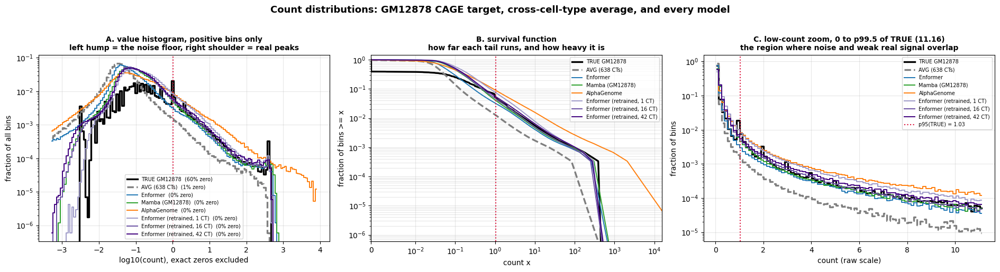

In [3]:
# §2.5 - count distributions: every model, the observed GM12878 target and the
# cross-cell-type average on one value axis, over the allowed test regions only.
# Read as a noise-vs-signal orientation: where each distribution's bulk sits, how much
# mass is at (or next to) zero, and how far the right tail runs.
# Every name here is prefixed `h_` / `H_` so no later section is touched.
h_rng = np.random.default_rng(0)
H_SUB = 3_000_000                # values sampled per series (nb4 is smaller than this)
H_ZOOM_Q = 99.5                  # the raw-scale zoom panel runs to this pct of TRUE

H_SERIES = ([('TRUE GM12878', TRUE_ALL, 'black', 2.4, '-'),
             ('AVG (638 CTs)', AVG_ALL, '#7f7f7f', 2.4, '--')]
            + [(PRETTY[k], preds[k], COLORS[k], 1.4, '-') for k in ALL_KEYS])


def h_sample(arr):
    """Allowed regions of an (N, 896) array, flattened and subsampled to H_SUB values."""
    v = np.asarray(arr[allowed], dtype=np.float32).ravel()
    return v[h_rng.integers(0, v.size, H_SUB)] if v.size > H_SUB else v


h_vals = {lab: h_sample(arr) for lab, arr, *_ in H_SERIES}
h_n = len(next(iter(h_vals.values())))
print(f'{allowed.sum()} allowed regions x 896 bins -> {h_n:,} values per series\n')

print(f"{'series':<30}{'=0':>8}{'<0.1':>8}{'<1':>8}{'mean':>9}{'median':>9}"
      f"{'p90':>9}{'p95':>9}{'p99':>10}{'p99.9':>11}{'max':>11}")
for lab, *_ in H_SERIES:
    v = h_vals[lab]
    p50, p90, p95, p99, p999 = np.percentile(v, [50, 90, 95, 99, 99.9])
    print(f'{lab:<30}{(v == 0).mean():>7.1%}{(v < 0.1).mean():>8.1%}{(v < 1).mean():>8.1%}'
          f'{v.mean():>9.3f}{p50:>9.3f}{p90:>9.3f}{p95:>9.3f}{p99:>10.3f}'
          f'{p999:>11.3f}{v.max():>11.1f}')

h_thr95 = float(np.percentile(h_vals['TRUE GM12878'], 95))
print(f"\np95 of TRUE = {h_thr95:.4f}  (the 'peak bin' cut §5-§6 use; dashed line below)")

# --- the figure -------------------------------------------------------------------
# panel A drops the exact zeros: the target is zero-inflated CAGE while no prediction is
# ever exactly zero, so the bars would otherwise be one spike at the origin and nothing
# else legible. The zero fraction is in the legend instead, and heights stay fractions of
# *all* bins, so the curves remain comparable across series.
h_pos = {lab: v[v > 0] for lab, v in h_vals.items()}
h_top = max(np.percentile(v, 99.99) for v in h_vals.values())
h_lo = np.log10(max(1e-7, min(np.percentile(p, 1) for p in h_pos.values() if p.size)))
h_edges = np.linspace(h_lo, np.log10(h_top) + 0.2, 140)
h_ctr = 0.5 * (h_edges[:-1] + h_edges[1:])
h_zoom = float(np.percentile(h_vals['TRUE GM12878'], H_ZOOM_Q))
h_zedges = np.linspace(0, h_zoom, 90)
h_zctr = 0.5 * (h_zedges[:-1] + h_zedges[1:])

fig, axes = plt.subplots(1, 3, figsize=(19, 5))

for lab, _, color, lw, ls in H_SERIES:
    v = h_vals[lab]
    c, _ = np.histogram(np.log10(h_pos[lab]), bins=h_edges)
    axes[0].step(h_ctr, c / len(v), where='mid', color=color, lw=lw, ls=ls,
                 label=f'{lab}  ({(v == 0).mean():.0%} zero)')

    # exact empirical survival on the sample, thinned to keep the file small
    s = np.sort(v)
    i = np.unique(np.linspace(0, s.size - 1, 3000).astype(int))
    axes[1].plot(s[i], 1.0 - i / s.size, color=color, lw=lw, ls=ls, label=lab)

    cz, _ = np.histogram(v, bins=h_zedges)
    axes[2].step(h_zctr, cz / len(v), where='mid', color=color, lw=lw, ls=ls, label=lab)

ax = axes[0]
ax.axvline(np.log10(h_thr95), color='crimson', ls=':', lw=1.5)
ax.set_yscale('log')
ax.set_xlabel('log10(count), exact zeros excluded')
ax.set_ylabel('fraction of all bins')
ax.set_title('A. value histogram, positive bins only\n'
             'left hump = the noise floor, right shoulder = real peaks',
             fontsize=10, weight='bold')
ax.legend(fontsize=7)
ax.grid(alpha=0.3)

ax = axes[1]
ax.axvline(h_thr95, color='crimson', ls=':', lw=1.5)
ax.set_xscale('symlog', linthresh=1e-2)
ax.set_yscale('log')
ax.set_xlim(0, h_top * 3)
ax.set_ylim(1.0 / h_n, 1.5)
ax.set_xlabel('count x')
ax.set_ylabel('fraction of bins >= x')
ax.set_title('B. survival function\nhow far each tail runs, and how heavy it is',
             fontsize=10, weight='bold')
ax.legend(fontsize=7)
ax.grid(alpha=0.3, which='both')

ax = axes[2]
ax.axvline(h_thr95, color='crimson', ls=':', lw=1.5,
           label=f'p95(TRUE) = {h_thr95:.2f}')
ax.set_yscale('log')
ax.set_xlabel('count (raw scale)')
ax.set_ylabel('fraction of bins')
ax.set_title(f'C. low-count zoom, 0 to p{H_ZOOM_Q} of TRUE ({h_zoom:.2f})\n'
             'the region where noise and weak real signal overlap',
             fontsize=10, weight='bold')
ax.legend(fontsize=7)
ax.grid(alpha=0.3)

plt.suptitle('Count distributions: GM12878 CAGE target, cross-cell-type average, and every model',
             fontsize=13, weight='bold', y=1.02)
plt.tight_layout()
plt.show()

## 3. Boxplot across the six modelsPer-region correlation against the GM12878 target under both metrics: smoothed-log Pearson(log1p + Gaussian sigma=1.5) and plain per-bin Pearson. Bold number is the mean, black bar the median.

Enformer:   0%|          | 0/1937 [00:00<?, ?it/s]

Enformer:   6%|▌         | 117/1937 [00:00<00:02, 754.91it/s]

Enformer:  13%|█▎        | 243/1937 [00:00<00:01, 995.34it/s]

Enformer:  19%|█▉        | 372/1937 [00:00<00:01, 1113.26it/s]

Enformer:  26%|██▌       | 504/1937 [00:00<00:01, 1185.47it/s]

Enformer:  33%|███▎      | 634/1937 [00:00<00:01, 1224.01it/s]

Enformer:  39%|███▉      | 764/1937 [00:00<00:00, 1247.63it/s]

Enformer:  46%|████▌     | 892/1937 [00:00<00:00, 1257.28it/s]

Enformer:  53%|█████▎    | 1020/1937 [00:00<00:00, 1262.12it/s]

Enformer:  59%|█████▉    | 1150/1937 [00:00<00:00, 1271.53it/s]

Enformer:  66%|██████▌   | 1280/1937 [00:01<00:00, 1278.06it/s]

Enformer:  73%|███████▎  | 1410/1937 [00:01<00:00, 1283.67it/s]

Enformer:  80%|███████▉  | 1541/1937 [00:01<00:00, 1289.70it/s]

Enformer:  86%|████████▋ | 1671/1937 [00:01<00:00, 1286.26it/s]

Enformer:  93%|█████████▎| 1800/1937 [00:01<00:00, 1281.16it/s]

Enformer: 100%|█████████▉| 1929/1937 [00:01<00:00, 1278.35it/s]

Enformer: 100%|██████████| 1937/1937 [00:01<00:00, 1232.66it/s]

Enformer (retrained, 1 CT):   0%|          | 0/1937 [00:00<?, ?it/s]

Enformer (retrained, 1 CT):   7%|▋         | 144/1937 [00:00<00:01, 1432.06it/s]

Enformer (retrained, 1 CT):  15%|█▍        | 288/1937 [00:00<00:01, 1424.37it/s]

Enformer (retrained, 1 CT):  22%|██▏       | 432/1937 [00:00<00:01, 1427.97it/s]

Enformer (retrained, 1 CT):  30%|██▉       | 576/1937 [00:00<00:00, 1430.09it/s]

Enformer (retrained, 1 CT):  37%|███▋      | 720/1937 [00:00<00:00, 1415.09it/s]

Enformer (retrained, 1 CT):  45%|████▍     | 866/1937 [00:00<00:00, 1428.13it/s]

Enformer (retrained, 1 CT):  52%|█████▏    | 1009/1937 [00:00<00:00, 1423.97it/s]

Enformer (retrained, 1 CT):  60%|█████▉    | 1155/1937 [00:00<00:00, 1434.20it/s]

Enformer (retrained, 1 CT):  67%|██████▋   | 1301/1937 [00:00<00:00, 1439.24it/s]

Enformer (retrained, 1 CT):  75%|███████▍  | 1446/1937 [00:01<00:00, 1439.51it/s]

Enformer (retrained, 1 CT):  82%|████████▏ | 1592/1937 [00:01<00:00, 1443.41it/s]

Enformer (retrained, 1 CT):  90%|████████▉ | 1737/1937 [00:01<00:00, 1443.60it/s]

Enformer (retrained, 1 CT):  97%|█████████▋| 1883/1937 [00:01<00:00, 1446.32it/s]

Enformer (retrained, 1 CT): 100%|██████████| 1937/1937 [00:01<00:00, 1435.97it/s]

Enformer (retrained, 16 CT):   0%|          | 0/1937 [00:00<?, ?it/s]

Enformer (retrained, 16 CT):   8%|▊         | 147/1937 [00:00<00:01, 1461.58it/s]

Enformer (retrained, 16 CT):  15%|█▌        | 294/1937 [00:00<00:01, 1458.26it/s]

Enformer (retrained, 16 CT):  23%|██▎       | 440/1937 [00:00<00:01, 1453.15it/s]

Enformer (retrained, 16 CT):  30%|███       | 586/1937 [00:00<00:00, 1430.64it/s]

Enformer (retrained, 16 CT):  38%|███▊      | 730/1937 [00:00<00:00, 1432.04it/s]

Enformer (retrained, 16 CT):  45%|████▌     | 874/1937 [00:00<00:00, 1432.01it/s]

Enformer (retrained, 16 CT):  53%|█████▎    | 1019/1937 [00:00<00:00, 1434.93it/s]

Enformer (retrained, 16 CT):  60%|██████    | 1163/1937 [00:00<00:00, 1423.96it/s]

Enformer (retrained, 16 CT):  68%|██████▊   | 1310/1937 [00:00<00:00, 1437.88it/s]

Enformer (retrained, 16 CT):  75%|███████▌  | 1456/1937 [00:01<00:00, 1443.83it/s]

Enformer (retrained, 16 CT):  83%|████████▎ | 1602/1937 [00:01<00:00, 1447.45it/s]

Enformer (retrained, 16 CT):  90%|█████████ | 1747/1937 [00:01<00:00, 1440.19it/s]

Enformer (retrained, 16 CT):  98%|█████████▊| 1892/1937 [00:01<00:00, 1443.10it/s]

Enformer (retrained, 16 CT): 100%|██████████| 1937/1937 [00:01<00:00, 1438.77it/s]

Enformer (retrained, 42 CT):   0%|          | 0/1937 [00:00<?, ?it/s]

Enformer (retrained, 42 CT):   8%|▊         | 146/1937 [00:00<00:01, 1456.69it/s]

Enformer (retrained, 42 CT):  15%|█▌        | 293/1937 [00:00<00:01, 1459.29it/s]

Enformer (retrained, 42 CT):  23%|██▎       | 439/1937 [00:00<00:01, 1450.98it/s]

Enformer (retrained, 42 CT):  30%|███       | 585/1937 [00:00<00:00, 1446.33it/s]

Enformer (retrained, 42 CT):  38%|███▊      | 731/1937 [00:00<00:00, 1448.08it/s]

Enformer (retrained, 42 CT):  45%|████▌     | 876/1937 [00:00<00:00, 1444.65it/s]

Enformer (retrained, 42 CT):  53%|█████▎    | 1022/1937 [00:00<00:00, 1448.56it/s]

Enformer (retrained, 42 CT):  60%|██████    | 1168/1937 [00:00<00:00, 1451.34it/s]

Enformer (retrained, 42 CT):  68%|██████▊   | 1314/1937 [00:00<00:00, 1453.89it/s]

Enformer (retrained, 42 CT):  75%|███████▌  | 1460/1937 [00:01<00:00, 1451.91it/s]

Enformer (retrained, 42 CT):  83%|████████▎ | 1606/1937 [00:01<00:00, 1447.48it/s]

Enformer (retrained, 42 CT):  90%|█████████ | 1752/1937 [00:01<00:00, 1451.10it/s]

Enformer (retrained, 42 CT):  98%|█████████▊| 1899/1937 [00:01<00:00, 1454.55it/s]

Enformer (retrained, 42 CT): 100%|██████████| 1937/1937 [00:01<00:00, 1450.75it/s]

Mamba (GM12878):   0%|          | 0/1937 [00:00<?, ?it/s]

Mamba (GM12878):   8%|▊         | 146/1937 [00:00<00:01, 1457.64it/s]

Mamba (GM12878):  15%|█▌        | 292/1937 [00:00<00:01, 1438.43it/s]

Mamba (GM12878):  23%|██▎       | 438/1937 [00:00<00:01, 1445.27it/s]

Mamba (GM12878):  30%|███       | 583/1937 [00:00<00:00, 1446.37it/s]

Mamba (GM12878):  38%|███▊      | 728/1937 [00:00<00:00, 1428.72it/s]

Mamba (GM12878):  45%|████▌     | 872/1937 [00:00<00:00, 1432.32it/s]

Mamba (GM12878):  52%|█████▏    | 1016/1937 [00:00<00:00, 1431.43it/s]

Mamba (GM12878):  60%|█████▉    | 1160/1937 [00:00<00:00, 1426.46it/s]

Mamba (GM12878):  67%|██████▋   | 1303/1937 [00:00<00:00, 1421.04it/s]

Mamba (GM12878):  75%|███████▍  | 1448/1937 [00:01<00:00, 1426.84it/s]

Mamba (GM12878):  82%|████████▏ | 1594/1937 [00:01<00:00, 1435.81it/s]

Mamba (GM12878):  90%|████████▉ | 1739/1937 [00:01<00:00, 1437.50it/s]

Mamba (GM12878):  97%|█████████▋| 1883/1937 [00:01<00:00, 1437.98it/s]

Mamba (GM12878): 100%|██████████| 1937/1937 [00:01<00:00, 1434.62it/s]

AlphaGenome:   0%|          | 0/1937 [00:00<?, ?it/s]

AlphaGenome:   7%|▋         | 138/1937 [00:00<00:01, 1371.73it/s]

AlphaGenome:  14%|█▍        | 276/1937 [00:00<00:01, 1360.04it/s]

AlphaGenome:  21%|██▏       | 413/1937 [00:00<00:01, 1353.77it/s]

AlphaGenome:  28%|██▊       | 549/1937 [00:00<00:01, 1352.88it/s]

AlphaGenome:  35%|███▌      | 685/1937 [00:00<00:00, 1347.59it/s]

AlphaGenome:  42%|████▏     | 820/1937 [00:00<00:00, 1347.45it/s]

AlphaGenome:  49%|████▉     | 955/1937 [00:00<00:00, 1345.68it/s]

AlphaGenome:  56%|█████▋    | 1090/1937 [00:00<00:00, 1340.67it/s]

AlphaGenome:  63%|██████▎   | 1225/1937 [00:00<00:00, 1343.22it/s]

AlphaGenome:  70%|███████   | 1360/1937 [00:01<00:00, 1343.01it/s]

AlphaGenome:  77%|███████▋  | 1495/1937 [00:01<00:00, 1344.20it/s]

AlphaGenome:  84%|████████▍ | 1630/1937 [00:01<00:00, 1340.36it/s]

AlphaGenome:  91%|█████████ | 1765/1937 [00:01<00:00, 1341.09it/s]

AlphaGenome:  98%|█████████▊| 1901/1937 [00:01<00:00, 1344.14it/s]

AlphaGenome: 100%|██████████| 1937/1937 [00:01<00:00, 1344.66it/s]


model                           mean smooth   median  mean plain   median   nan
Enformer                              0.651    0.658       0.626    0.662     0
Enformer (retrained, 1 CT)            0.527    0.525       0.512    0.504     0
Enformer (retrained, 16 CT)           0.595    0.598       0.573    0.579     0
Enformer (retrained, 42 CT)           0.571    0.573       0.549    0.554     0
Mamba (GM12878)                       0.641    0.650       0.622    0.641     0
AlphaGenome                           0.483    0.453       0.428    0.284     0


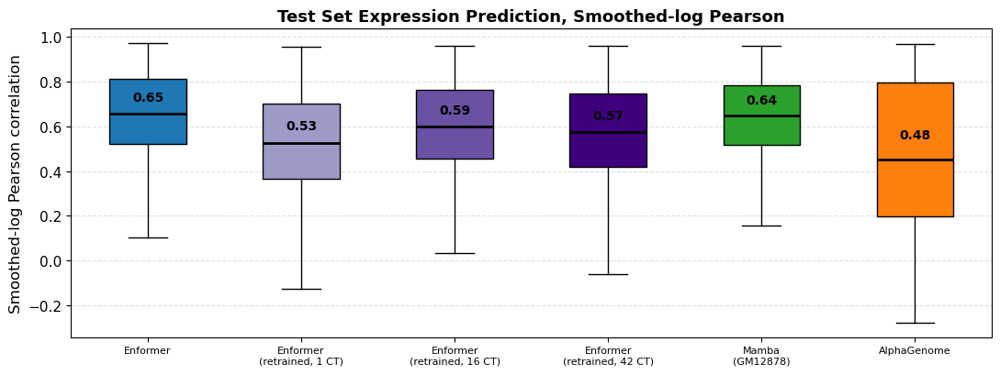

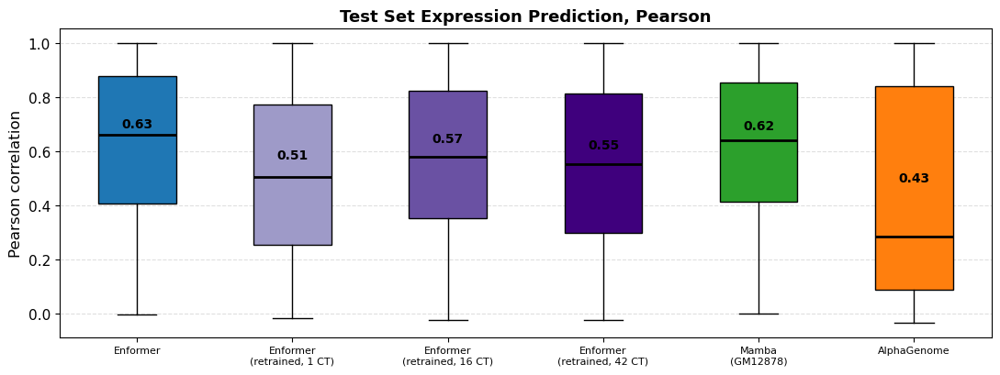

In [4]:
# §3 - per-region scores for every model, both metrics, then the boxplots.
BOX_KEYS = [enformer_key] + RETRAIN_KEYS + [mamba_key, ag_key]

if 'box_smooth' not in globals():
    box_smooth, box_plain = {}, {}
    for k in BOX_KEYS:
        arr = preds[k]
        assert arr.shape == t1.shape, f'{k} shape {arr.shape} vs target {t1.shape}'
        box_smooth[k] = np.array([smoothed_log_pearson(arr[i], t1[i])
                                  for i in tqdm(range(arr.shape[0]), desc=PRETTY[k])])
        box_plain[k] = np.array([raw_pearson(arr[i], t1[i]) for i in range(arr.shape[0])])

print(f"\n{'model':<30}{'mean smooth':>13}{'median':>9}{'mean plain':>12}{'median':>9}{'nan':>6}")
for k in BOX_KEYS:
    s, pl = box_smooth[k], box_plain[k]
    print(f'{PRETTY[k]:<30}{np.nanmean(s):>13.3f}{np.nanmedian(s):>9.3f}'
          f'{np.nanmean(pl):>12.3f}{np.nanmedian(pl):>9.3f}{int(np.isnan(s).sum()):>6}')

for res, meth in [(box_smooth, 'Smoothed-log Pearson'), (box_plain, 'Pearson')]:
    data = [res[k][~np.isnan(res[k])] for k in BOX_KEYS]
    plt.figure(figsize=(11, 4.2))
    box = plt.boxplot(data, labels=[PRETTY[k].replace(' (', '\n(') for k in BOX_KEYS],
                      showfliers=False, patch_artist=True, boxprops=dict(edgecolor='black'),
                      medianprops=dict(color='black', linewidth=2),
                      whiskerprops=dict(color='black'), capprops=dict(color='black'))
    for patch, k in zip(box['boxes'], BOX_KEYS):
        patch.set_facecolor(COLORS[k])
    for i, vals in enumerate(data):
        plt.text(i + 1, np.mean(vals) + 0.05, f'{np.mean(vals):.2f}', ha='center', va='bottom',
                 fontsize=10, fontweight='bold')
    plt.ylabel(f'{meth} correlation', fontsize=12)
    plt.title(f'Test Set Expression Prediction, {meth}', fontsize=13, weight='bold')
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=11)
    plt.grid(axis='y', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

## 4. Element-wise comparison vs EnformerOne panel per model: its per-region correlation against the original Enformer's. Points above thedashed `y = x` are regions where that model wins; the title gives the win rate and the mean delta.

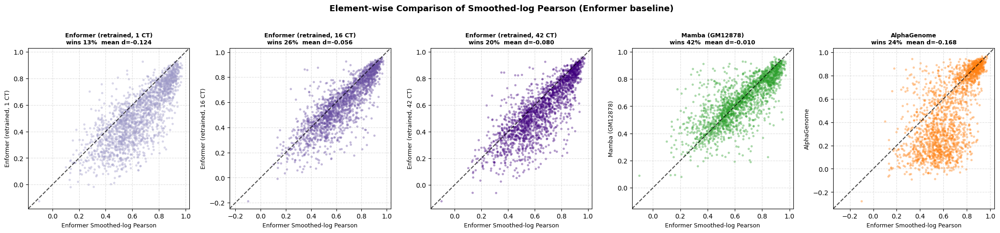

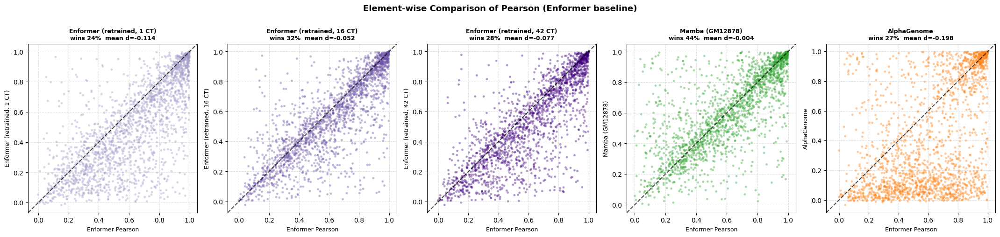

In [5]:
# §4 - per-region scatter against the original Enformer, both metrics.
CMP_KEYS = RETRAIN_KEYS + [mamba_key, ag_key]

for res, meth in [(box_smooth, 'Smoothed-log Pearson'), (box_plain, 'Pearson')]:
    base = res[enformer_key]
    fig, axes = plt.subplots(1, len(CMP_KEYS), figsize=(4.3 * len(CMP_KEYS), 4.8))
    for ax, k in zip(np.atleast_1d(axes), CMP_KEYS):
        comp = res[k]
        m = ~np.isnan(base) & ~np.isnan(comp)
        xb, yb = base[m], comp[m]
        ax.scatter(xb, yb, color=COLORS[k], alpha=0.4, s=12, edgecolor='none')
        lo, hi = min(xb.min(), yb.min()), max(xb.max(), yb.max())
        buf = (hi - lo) * 0.05
        ax.plot([lo - buf, hi + buf], [lo - buf, hi + buf], color='black', ls='--', alpha=0.7)
        ax.set_xlabel(f'Enformer {meth}', fontsize=9)
        ax.set_ylabel(f'{PRETTY[k]}', fontsize=9)
        ax.set_title(f'{PRETTY[k]}\nwins {float((yb > xb).mean()):.0%}  '
                     f'mean d={np.mean(yb - xb):+.3f}', fontsize=9, weight='bold')
        ax.set_box_aspect(1)
        ax.set_xlim(lo - buf, hi + buf)
        ax.set_ylim(lo - buf, hi + buf)
        ax.grid(ls='--', alpha=0.4)
    plt.suptitle(f'Element-wise Comparison of {meth} (Enformer baseline)', fontsize=13,
                 weight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

## 5. = `comparing_model3` §8 — the rule scan and the worst regionsRule, per bin: `AVG > 2*TRUE` **and** `AVG >= p95(AVG)` **and** `TRUE < p95(TRUE)`, with percentilesglobal over all allowed test bins. A rule bin is broadly transcribed but quiet in GM12878. The scanis model-independent, so the same 5 worst regions are used; only the track stack changes.

In [6]:
# §5a - the rule, global thresholds, and the 5 worst regions (identical to comparing_model3 §8a).
THR_A = float(np.percentile(AVG_ALL[allowed], 95))
THR_T = float(np.percentile(TRUE_ALL[allowed], 95))
C1 = AVG_ALL > 2 * TRUE_ALL
C2 = AVG_ALL >= THR_A
C3 = TRUE_ALL < THR_T
RULE = C1 & C2 & C3
RULE_PREV = float(RULE[allowed].mean())
rule_count = np.where(allowed, RULE.sum(axis=1), -1)
print(f'global p95: avg {THR_A:.4f}  true {THR_T:.4f};  rule prevalence {RULE_PREV:.2%}')
print(f'rule bins per allowed region: mean {RULE[allowed].sum(axis=1).mean():.1f}, '
      f'median {np.median(RULE[allowed].sum(axis=1)):.0f}, max {rule_count.max()}')

WORST = np.argsort(rule_count)[-5:][::-1]
for r, i in enumerate(WORST):
    chrom, start, end = region_coords(i)
    print(f'  {r+1}. idx {i:>4}  {chrom}:{start:,}-{end:,}  {RULE[i].sum():>3} rule bins')

global p95: avg 0.2450  true 1.0312;  rule prevalence 1.33%
rule bins per allowed region: mean 11.9, median 4, max 205
  1. idx 1758  chr14:100,819,717-100,934,405  205 rule bins
  2. idx 1447  chr11:35,197,431-35,312,119  197 rule bins
  3. idx 1384  chr15:25,005,401-25,120,089  159 rule bins
  4. idx 1900  chr11:35,082,742-35,197,430  151 rule bins
  5. idx 1576  chr3:188,870,350-188,985,038  136 rule bins


DNase = labels.zarr track 12 (DNASE:GM12878) (1937, 896), mean 0.1050


rank 1 (idx 1758)  Enformer 4%  AlphaGenome 20%  Enformer (retrained, 1 CT) 6%  Enformer (retrained, 16 CT) 7%  Enformer (retrained, 42 CT) 6%  Mamba (GM12878) 3%


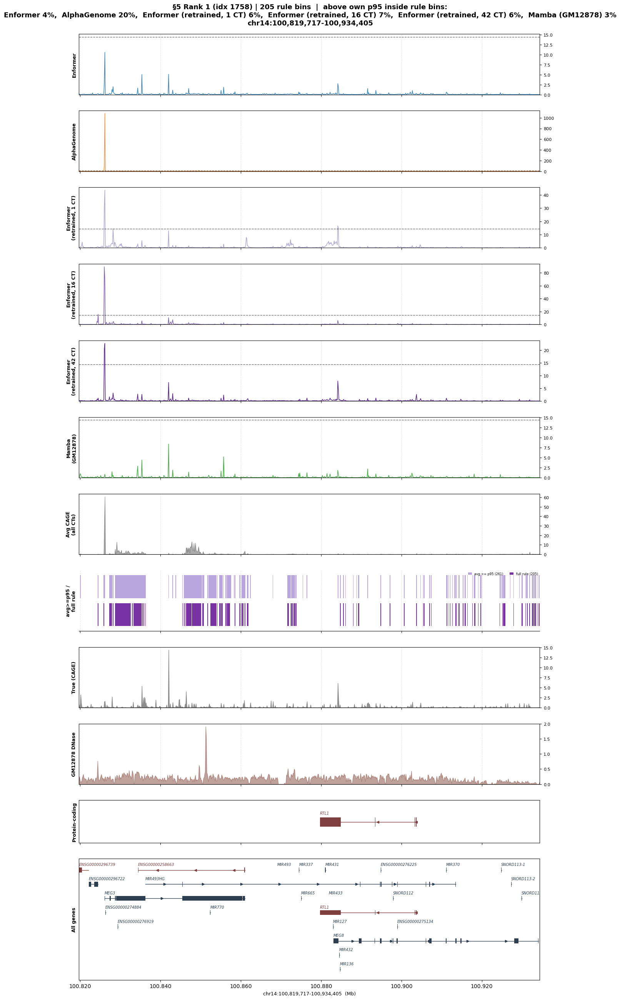

rank 2 (idx 1447)  Enformer 9%  AlphaGenome 12%  Enformer (retrained, 1 CT) 7%  Enformer (retrained, 16 CT) 8%  Enformer (retrained, 42 CT) 10%  Mamba (GM12878) 6%


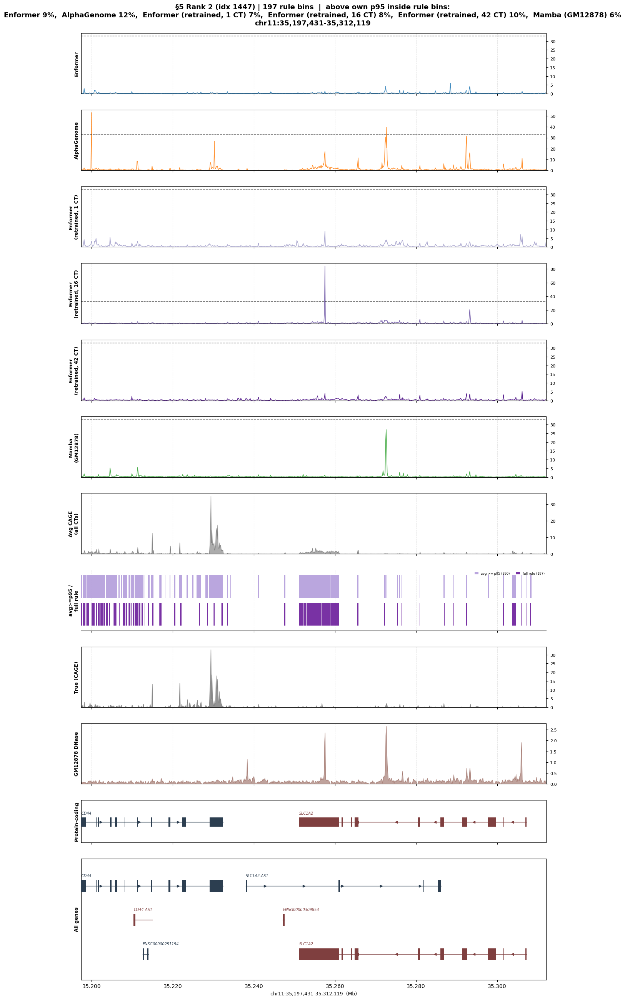

rank 3 (idx 1384)  Enformer 10%  AlphaGenome 11%  Enformer (retrained, 1 CT) 5%  Enformer (retrained, 16 CT) 8%  Enformer (retrained, 42 CT) 8%  Mamba (GM12878) 6%


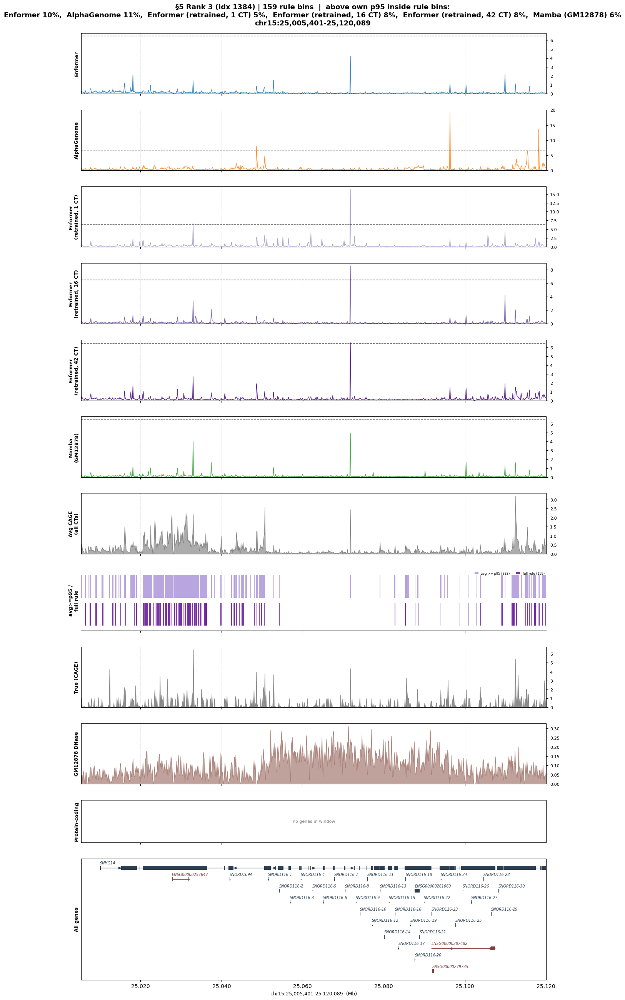

rank 4 (idx 1900)  Enformer 3%  AlphaGenome 3%  Enformer (retrained, 1 CT) 4%  Enformer (retrained, 16 CT) 4%  Enformer (retrained, 42 CT) 2%  Mamba (GM12878) 3%


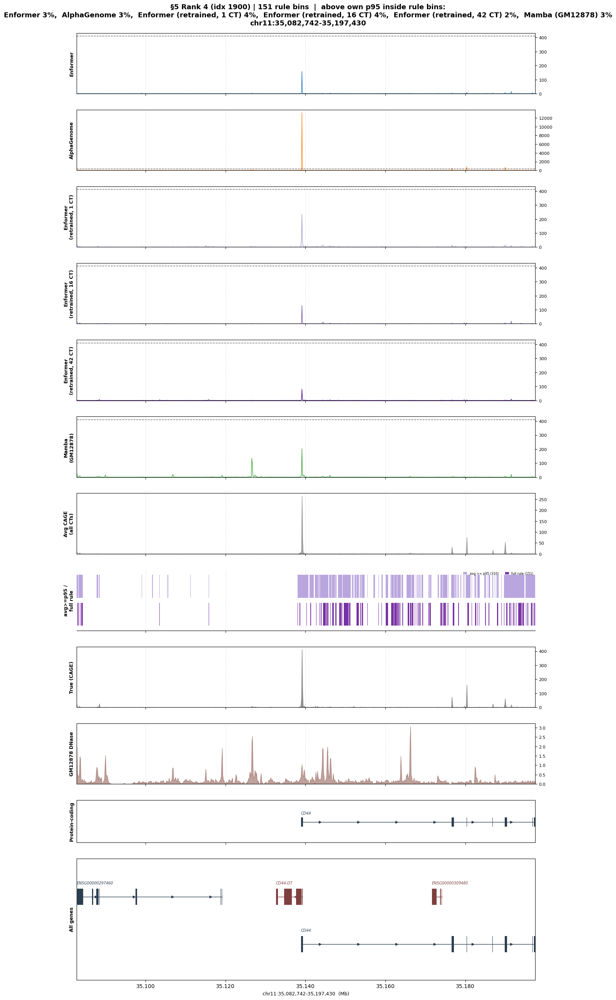

rank 5 (idx 1576)  Enformer 6%  AlphaGenome 29%  Enformer (retrained, 1 CT) 18%  Enformer (retrained, 16 CT) 15%  Enformer (retrained, 42 CT) 12%  Mamba (GM12878) 5%


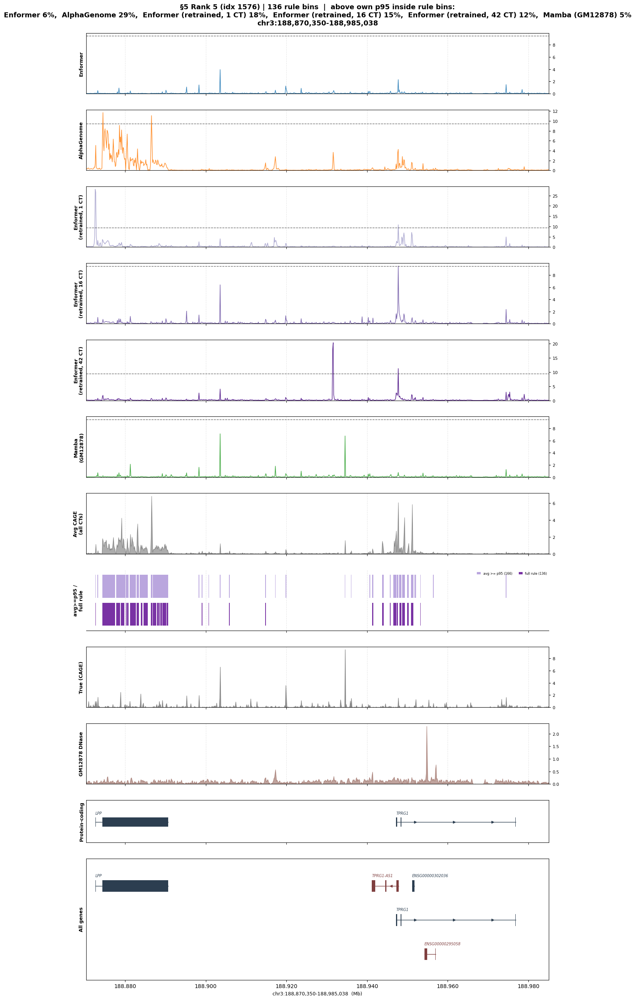

In [7]:
# §5b - track plots for the 5 worst regions with all six models.
from matplotlib.patches import Rectangle

RULE_COLOR, C2_COLOR = '#6a1b9a', '#b39ddb'

# --- observed GM12878 DNase, for the bottom track ---------------------------------
# labels.zarr track 12 is DNASE:GM12878 on this exact 128 bp grid -- the same grid, the
# same rows and the same crop as the CAGE target, so there is no resampling and no
# alignment question to answer. Sliced out once and cached beside the CAGE slice,
# following the pattern §8a uses for track 5110.
DNASE_TRACK = 12
DNASE_CACHE = f'{MODEL_OUT}/enformer_test_track{DNASE_TRACK}.npy'
if os.path.exists(DNASE_CACHE):
    DNASE = np.load(DNASE_CACHE)
else:
    DNASE = np.asarray(zarr.open(LABELS_ZARR, mode='r')['test'][:, :, DNASE_TRACK],
                       dtype=np.float32)
    np.save(DNASE_CACHE, DNASE)
_tg = pd.read_csv('/data1/lesliec/sarthak/data/enformer/data/targets.txt', sep='\t')
_desc = _tg.set_index('index').loc[DNASE_TRACK, 'description']
assert _desc == 'DNASE:GM12878', f'track {DNASE_TRACK} is {_desc!r}, not DNASE:GM12878'
assert DNASE.shape == TRUE_ALL.shape, f'DNase {DNASE.shape} vs target {TRUE_ALL.shape}'
assert not np.array_equal(DNASE, TRUE_ALL), 'the DNase slice IS the CAGE target'
DNASE_COLOR = '#8c564b'          # no model wears brown
print(f'DNase = labels.zarr track {DNASE_TRACK} ({_desc}) {DNASE.shape}, '
      f'mean {DNASE.mean():.4f}')

# Track stack order for these panels, which is NOT the ALL_KEYS order used elsewhere in
# the notebook: the base model, then AlphaGenome, then the retrained Enformers, then the
# Mamba arm -- so each panel reads outward from stock Enformer. Only the panels below use
# it; every other section keeps ALL_KEYS.
TRACK_ORDER = [enformer_key, ag_key] + RETRAIN_KEYS + [mamba_key]
assert sorted(TRACK_ORDER) == sorted(ALL_KEYS), 'TRACK_ORDER must be a permutation of ALL_KEYS'




def bins_to_intervals(mask):
    d = np.diff(np.concatenate(([0], mask.astype(np.int8), [0])))
    return list(zip(np.flatnonzero(d == 1).tolist(), np.flatnonzero(d == -1).tolist()))


def draw_rule_track(ax, idx, xlim):
    """Upper band = avg >= p95, lower band = full rule. Own axis, so no other track is tinted."""
    ax.set_xlim(xlim)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_ylabel('avg>=p95 /\nfull rule', fontsize=9, weight='bold')
    ax.grid(axis='x', linestyle='--', alpha=0.3)
    for side in ('left', 'right', 'top'):
        ax.spines[side].set_visible(False)
    out = None
    for mask, color, y0 in [(C2[idx], C2_COLOR, 0.54), (RULE[idx], RULE_COLOR, 0.08)]:
        iv = bins_to_intervals(mask)
        if color == RULE_COLOR:
            out = iv
        for b0, b1 in iv:
            ax.add_patch(Rectangle((xlim[0] + b0 * BIN, y0), (b1 - b0) * BIN, 0.38,
                                   facecolor=color, edgecolor='none', alpha=0.9, zorder=3))
    ax.legend(handles=[Rectangle((0, 0), 1, 1, facecolor=C2_COLOR, alpha=0.9),
                       Rectangle((0, 0), 1, 1, facecolor=RULE_COLOR, alpha=0.9)],
              labels=[f'avg >= p95 ({C2[idx].sum()})', f'full rule ({RULE[idx].sum()})'],
              fontsize=6, loc='upper right', frameon=False, ncol=2, handlelength=1.2,
              borderaxespad=0.1)
    return out


for rank, idx in enumerate(WORST):
    chrom, start, end = region_coords(idx)
    common = dict(chrom=chrom, start=start, bin_size=BIN)
    # the ylabel is rotated, so 'Enformer (retrained, 16 CT)' needs ~2.3in of axis
    # height and gets ~1.9in; wrapping at the parenthesis halves what it needs.
    tracks = [Track(np.asarray(preds[k][idx]), name=PRETTY[k].replace(' (', '\n('),
                    color=COLORS[k], **common) for k in TRACK_ORDER]
    tracks.append(Track(AVG_ALL[idx], name='Avg CAGE\n(all CTs)', color='#111111', style='fill',
                        alpha=0.35, reference_exempt=True, **common))
    rule_slot = len(tracks)
    tracks.append(Track(np.zeros(896), name='rule', color=RULE_COLOR, style='fill', alpha=0.0,
                        reference_exempt=True, **common))
    truth = Track(np.asarray(t1[idx]), name='True (CAGE)', is_truth=True, **common)
    # DNase goes BELOW the truth axis, next to the gene models: a different assay in
    # different units, so it is reference_exempt and is not read as another prediction.
    dnase = Track(DNASE[idx], name='GM12878 DNase', color=DNASE_COLOR, style='fill',
                  alpha=0.55, reference_exempt=True, **common)

    m = RULE[idx]
    frac = {k: (np.asarray(preds[k][idx])[m]
                >= np.percentile(np.asarray(preds[k][idx]), 95)).mean() for k in TRACK_ORDER}
    title = (f'§5 Rank {rank+1} (idx {idx}) | {RULE[idx].sum()} rule bins  |  '
             f'above own p95 inside rule bins:\n'
             + ',  '.join(f'{PRETTY[k]} {frac[k]:.0%}' for k in TRACK_ORDER)
             + f'\n{chrom}:{start:,}-{end:,}')
    fig, axes = plot_tracks(tracks, genes=GENE_TRACKS, region=(chrom, start, end), ground_truth=truth,
                            bottom_tracks=[dnase], collapse_genes=True, title=title,
                            gene_track_ratio=(0.7, 2.0),
                            figsize=(13, 1.85 * (len(tracks) + 3) + 5.7))
    draw_rule_track(axes[rule_slot], idx, (start, end))
    print(f'rank {rank+1} (idx {idx})  ' + '  '.join(f'{PRETTY[k]} {frac[k]:.0%}' for k in TRACK_ORDER))
    plt.show()

## 6. = `comparing_model3` §9 — the four specificity metrics`gap = R(pred, AVG) - R(pred, TRUE)` (positive = looks generic), magnitude over-prediction`log2((pred+1)/(true+1))`, `precision@k` with `k` = the number of true peak bins, and the fraction ofeach model's *false* top-k bins that are rule bins (against 1.33% prevalence).

In [8]:
# §6a - per-region metrics for all six models.
cols = ['R_true', 'R_avg', 'gap', 'prec_at_k', 'log2_topk', 'log2_summit', 'fp_in_rule']
K_MIN = 3
eligible = np.flatnonzero(allowed & ((TRUE_ALL >= THR_T).sum(axis=1) >= K_MIN))
RC_ELIG = RULE.sum(axis=1)[eligible]
print(f'{len(eligible)} of {allowed.sum()} allowed regions have >= {K_MIN} true peak bins')

if 'met' not in globals():
    met = {}
for key in ALL_KEYS:
    if key in met:
        continue
    met[key] = {c: np.full(len(eligible), np.nan) for c in cols}
    for row, i in enumerate(tqdm(eligible, desc=f'metrics {PRETTY[key]}')):
        tr, av, ru = TRUE_ALL[i], AVG_ALL[i], RULE[i]
        pos = tr >= THR_T
        k = int(pos.sum())
        pr = np.asarray(preds[key][i], dtype=np.float64)
        topk = np.argsort(pr)[-k:]
        fp = topk[~pos[topk]]
        m = met[key]
        m['R_true'][row] = smoothed_log_pearson(pr, tr)
        m['R_avg'][row] = smoothed_log_pearson(pr, av)
        m['gap'][row] = m['R_avg'][row] - m['R_true'][row]
        m['prec_at_k'][row] = pos[topk].mean()
        m['log2_topk'][row] = np.median(np.log2((pr[topk] + 1) / (tr[topk] + 1)))
        j = int(np.argmax(pr))
        m['log2_summit'][row] = np.log2((pr[j] + 1) / (tr[j] + 1))
        if len(fp):
            m['fp_in_rule'][row] = ru[fp].mean()

MARK_IDX = int(WORST[0])
mark_row = int(np.flatnonzero(eligible == MARK_IDX)[0])

print(f"\n{'model':<30}{'R_true':>8}{'R_avg':>8}{'gap':>8}{'prec@k':>8}"
      f"{'log2_topk':>10}{'log2_sum':>9}{'FPinRule':>9}{'enrich':>8}")
for key in ALL_KEYS:
    m = met[key]
    fr = np.nanmedian(m['fp_in_rule'])
    print(f'{PRETTY[key]:<30}' + ''.join(f'{np.nanmedian(m[c]):>8.3f}' for c in cols[:4])
          + f"{np.nanmedian(m['log2_topk']):>10.2f}{np.nanmedian(m['log2_summit']):>9.2f}"
          + f'{fr:>9.3f}{fr / RULE_PREV:>7.1f}x')

print('\ngap vs rule-bin count:')
for key in ALL_KEYS:
    g_ = met[key]['gap']
    ok = ~np.isnan(g_)
    rho, pv = spearmanr(RC_ELIG[ok], g_[ok])
    print(f'  {PRETTY[key]:<30} Spearman rho {rho:>+.3f} (p {pv:.1e})   '
          f'median gap {np.median(g_[ok]):>+.3f}')

STRATA = [(0, 0), (1, 4), (5, 19), (20, 49), (50, 10 ** 9)]
STRATA_LAB = ['0', '1-4', '5-19', '20-49', '50+']
strat = {key: {c: [] for c in ['gap', 'prec_at_k', 'log2_summit']} for key in ALL_KEYS}
for lo, hi in STRATA:
    sel = (RC_ELIG >= lo) & (RC_ELIG <= hi)
    for key in ALL_KEYS:
        for c in ['gap', 'prec_at_k', 'log2_summit']:
            strat[key][c].append(np.nanmedian(met[key][c][sel]))
for c, lab in [('gap', 'median gap = R_avg - R_true'), ('prec_at_k', 'median precision@k'),
               ('log2_summit', 'median log2 excess at summit')]:
    print(f'\n{lab}  (columns = rule bins per region)')
    print(f"{'':<30}" + ''.join(f'{s:>10}' for s in STRATA_LAB))
    for key in ALL_KEYS:
        print(f'{PRETTY[key]:<30}' + ''.join(f'{v:>+10.3f}' for v in strat[key][c]))

print(f'\nidx {MARK_IDX}:')
for key in ALL_KEYS:
    m = met[key]
    print(f'  {PRETTY[key]:<30} R_true {m["R_true"][mark_row]:>6.3f}  '
          f'R_avg {m["R_avg"][mark_row]:>6.3f}  gap {m["gap"][mark_row]:>+6.3f}  '
          f'prec@k {m["prec_at_k"][mark_row]:>5.2f}  log2summit {m["log2_summit"][mark_row]:>+6.2f}')

1880 of 1883 allowed regions have >= 3 true peak bins


metrics Enformer:   0%|          | 0/1880 [00:00<?, ?it/s]

metrics Enformer:   3%|▎         | 54/1880 [00:00<00:03, 535.61it/s]

metrics Enformer:   6%|▌         | 117/1880 [00:00<00:02, 590.15it/s]

metrics Enformer:  10%|▉         | 180/1880 [00:00<00:02, 605.30it/s]

metrics Enformer:  13%|█▎        | 243/1880 [00:00<00:02, 613.92it/s]

metrics Enformer:  16%|█▋        | 307/1880 [00:00<00:02, 620.84it/s]

metrics Enformer:  20%|█▉        | 370/1880 [00:00<00:02, 623.78it/s]

metrics Enformer:  23%|██▎       | 434/1880 [00:00<00:02, 626.37it/s]

metrics Enformer:  26%|██▋       | 498/1880 [00:00<00:02, 630.38it/s]

metrics Enformer:  30%|██▉       | 562/1880 [00:00<00:02, 630.35it/s]

metrics Enformer:  33%|███▎      | 626/1880 [00:01<00:01, 631.08it/s]

metrics Enformer:  37%|███▋      | 690/1880 [00:01<00:01, 633.25it/s]

metrics Enformer:  40%|████      | 754/1880 [00:01<00:01, 626.83it/s]

metrics Enformer:  44%|████▎     | 818/1880 [00:01<00:01, 629.35it/s]

metrics Enformer:  47%|████▋     | 882/1880 [00:01<00:01, 631.30it/s]

metrics Enformer:  50%|█████     | 946/1880 [00:01<00:01, 632.51it/s]

metrics Enformer:  54%|█████▎    | 1010/1880 [00:01<00:01, 632.51it/s]

metrics Enformer:  57%|█████▋    | 1074/1880 [00:01<00:01, 632.46it/s]

metrics Enformer:  61%|██████    | 1139/1880 [00:01<00:01, 634.82it/s]

metrics Enformer:  64%|██████▍   | 1203/1880 [00:01<00:01, 635.36it/s]

metrics Enformer:  67%|██████▋   | 1267/1880 [00:02<00:00, 634.96it/s]

metrics Enformer:  71%|███████   | 1331/1880 [00:02<00:00, 635.62it/s]

metrics Enformer:  74%|███████▍  | 1395/1880 [00:02<00:00, 635.16it/s]

metrics Enformer:  78%|███████▊  | 1459/1880 [00:02<00:00, 631.58it/s]

metrics Enformer:  81%|████████  | 1523/1880 [00:02<00:00, 632.72it/s]

metrics Enformer:  84%|████████▍ | 1587/1880 [00:02<00:00, 632.53it/s]

metrics Enformer:  88%|████████▊ | 1651/1880 [00:02<00:00, 631.70it/s]

metrics Enformer:  91%|█████████ | 1715/1880 [00:02<00:00, 631.16it/s]

metrics Enformer:  95%|█████████▍| 1779/1880 [00:02<00:00, 627.78it/s]

metrics Enformer:  98%|█████████▊| 1842/1880 [00:02<00:00, 628.34it/s]

metrics Enformer: 100%|██████████| 1880/1880 [00:02<00:00, 628.02it/s]

metrics Mamba (GM12878):   0%|          | 0/1880 [00:00<?, ?it/s]

metrics Mamba (GM12878):   3%|▎         | 65/1880 [00:00<00:02, 647.13it/s]

metrics Mamba (GM12878):   7%|▋         | 130/1880 [00:00<00:02, 645.39it/s]

metrics Mamba (GM12878):  10%|█         | 195/1880 [00:00<00:02, 645.12it/s]

metrics Mamba (GM12878):  14%|█▍        | 260/1880 [00:00<00:02, 644.74it/s]

metrics Mamba (GM12878):  17%|█▋        | 325/1880 [00:00<00:02, 621.26it/s]

metrics Mamba (GM12878):  21%|██        | 389/1880 [00:00<00:02, 624.54it/s]

metrics Mamba (GM12878):  24%|██▍       | 453/1880 [00:00<00:02, 628.68it/s]

metrics Mamba (GM12878):  28%|██▊       | 518/1880 [00:00<00:02, 633.24it/s]

metrics Mamba (GM12878):  31%|███       | 583/1880 [00:00<00:02, 636.86it/s]

metrics Mamba (GM12878):  34%|███▍      | 648/1880 [00:01<00:01, 640.34it/s]

metrics Mamba (GM12878):  38%|███▊      | 713/1880 [00:01<00:01, 640.43it/s]

metrics Mamba (GM12878):  41%|████▏     | 778/1880 [00:01<00:01, 638.72it/s]

metrics Mamba (GM12878):  45%|████▍     | 843/1880 [00:01<00:01, 639.89it/s]

metrics Mamba (GM12878):  48%|████▊     | 908/1880 [00:01<00:01, 641.82it/s]

metrics Mamba (GM12878):  52%|█████▏    | 973/1880 [00:01<00:01, 641.39it/s]

metrics Mamba (GM12878):  55%|█████▌    | 1038/1880 [00:01<00:01, 641.87it/s]

metrics Mamba (GM12878):  59%|█████▊    | 1103/1880 [00:01<00:01, 641.11it/s]

metrics Mamba (GM12878):  62%|██████▏   | 1168/1880 [00:01<00:01, 640.67it/s]

metrics Mamba (GM12878):  66%|██████▌   | 1233/1880 [00:01<00:01, 638.08it/s]

metrics Mamba (GM12878):  69%|██████▉   | 1297/1880 [00:02<00:00, 637.29it/s]

metrics Mamba (GM12878):  72%|███████▏  | 1361/1880 [00:02<00:00, 631.43it/s]

metrics Mamba (GM12878):  76%|███████▌  | 1425/1880 [00:02<00:00, 631.81it/s]

metrics Mamba (GM12878):  79%|███████▉  | 1489/1880 [00:02<00:00, 633.41it/s]

metrics Mamba (GM12878):  83%|████████▎ | 1553/1880 [00:02<00:00, 634.95it/s]

metrics Mamba (GM12878):  86%|████████▌ | 1617/1880 [00:02<00:00, 635.52it/s]

metrics Mamba (GM12878):  89%|████████▉ | 1681/1880 [00:02<00:00, 636.15it/s]

metrics Mamba (GM12878):  93%|█████████▎| 1745/1880 [00:02<00:00, 636.54it/s]

metrics Mamba (GM12878):  96%|█████████▌| 1809/1880 [00:02<00:00, 636.61it/s]

metrics Mamba (GM12878): 100%|█████████▉| 1873/1880 [00:02<00:00, 636.93it/s]

metrics Mamba (GM12878): 100%|██████████| 1880/1880 [00:02<00:00, 636.60it/s]

metrics AlphaGenome:   0%|          | 0/1880 [00:00<?, ?it/s]

metrics AlphaGenome:   3%|▎         | 63/1880 [00:00<00:02, 626.23it/s]

metrics AlphaGenome:   7%|▋         | 126/1880 [00:00<00:02, 626.24it/s]

metrics AlphaGenome:  10%|█         | 189/1880 [00:00<00:02, 627.41it/s]

metrics AlphaGenome:  13%|█▎        | 252/1880 [00:00<00:02, 628.20it/s]

metrics AlphaGenome:  17%|█▋        | 315/1880 [00:00<00:02, 628.26it/s]

metrics AlphaGenome:  20%|██        | 379/1880 [00:00<00:02, 630.77it/s]

metrics AlphaGenome:  24%|██▎       | 443/1880 [00:00<00:02, 629.31it/s]

metrics AlphaGenome:  27%|██▋       | 506/1880 [00:00<00:02, 627.55it/s]

metrics AlphaGenome:  30%|███       | 569/1880 [00:00<00:02, 627.95it/s]

metrics AlphaGenome:  34%|███▎      | 632/1880 [00:01<00:01, 625.61it/s]

metrics AlphaGenome:  37%|███▋      | 696/1880 [00:01<00:01, 627.71it/s]

metrics AlphaGenome:  40%|████      | 759/1880 [00:01<00:01, 628.01it/s]

metrics AlphaGenome:  44%|████▍     | 823/1880 [00:01<00:01, 629.05it/s]

metrics AlphaGenome:  47%|████▋     | 886/1880 [00:01<00:01, 628.11it/s]

metrics AlphaGenome:  50%|█████     | 949/1880 [00:01<00:01, 627.45it/s]

metrics AlphaGenome:  54%|█████▍    | 1014/1880 [00:01<00:01, 631.41it/s]

metrics AlphaGenome:  57%|█████▋    | 1078/1880 [00:01<00:01, 633.86it/s]

metrics AlphaGenome:  61%|██████    | 1143/1880 [00:01<00:01, 637.06it/s]

metrics AlphaGenome:  64%|██████▍   | 1207/1880 [00:01<00:01, 614.76it/s]

metrics AlphaGenome:  68%|██████▊   | 1270/1880 [00:02<00:00, 617.52it/s]

metrics AlphaGenome:  71%|███████   | 1332/1880 [00:02<00:00, 614.83it/s]

metrics AlphaGenome:  74%|███████▍  | 1395/1880 [00:02<00:00, 617.98it/s]

metrics AlphaGenome:  78%|███████▊  | 1458/1880 [00:02<00:00, 621.36it/s]

metrics AlphaGenome:  81%|████████  | 1522/1880 [00:02<00:00, 625.51it/s]

metrics AlphaGenome:  84%|████████▍ | 1586/1880 [00:02<00:00, 626.20it/s]

metrics AlphaGenome:  88%|████████▊ | 1650/1880 [00:02<00:00, 628.56it/s]

metrics AlphaGenome:  91%|█████████ | 1714/1880 [00:02<00:00, 631.71it/s]

metrics AlphaGenome:  95%|█████████▍| 1779/1880 [00:02<00:00, 635.25it/s]

metrics AlphaGenome:  98%|█████████▊| 1844/1880 [00:02<00:00, 637.78it/s]

metrics AlphaGenome: 100%|██████████| 1880/1880 [00:02<00:00, 628.24it/s]

metrics Enformer (retrained, 1 CT):   0%|          | 0/1880 [00:00<?, ?it/s]

metrics Enformer (retrained, 1 CT):   3%|▎         | 65/1880 [00:00<00:02, 649.06it/s]

metrics Enformer (retrained, 1 CT):   7%|▋         | 130/1880 [00:00<00:02, 639.72it/s]

metrics Enformer (retrained, 1 CT):  10%|█         | 194/1880 [00:00<00:02, 638.10it/s]

metrics Enformer (retrained, 1 CT):  14%|█▍        | 259/1880 [00:00<00:02, 640.27it/s]

metrics Enformer (retrained, 1 CT):  17%|█▋        | 324/1880 [00:00<00:02, 642.20it/s]

metrics Enformer (retrained, 1 CT):  21%|██        | 389/1880 [00:00<00:02, 642.65it/s]

metrics Enformer (retrained, 1 CT):  24%|██▍       | 454/1880 [00:00<00:02, 642.79it/s]

metrics Enformer (retrained, 1 CT):  28%|██▊       | 519/1880 [00:00<00:02, 643.43it/s]

metrics Enformer (retrained, 1 CT):  31%|███       | 584/1880 [00:00<00:02, 644.01it/s]

metrics Enformer (retrained, 1 CT):  35%|███▍      | 649/1880 [00:01<00:01, 644.92it/s]

metrics Enformer (retrained, 1 CT):  38%|███▊      | 715/1880 [00:01<00:01, 646.38it/s]

metrics Enformer (retrained, 1 CT):  41%|████▏     | 780/1880 [00:01<00:01, 646.80it/s]

metrics Enformer (retrained, 1 CT):  45%|████▍     | 845/1880 [00:01<00:01, 647.13it/s]

metrics Enformer (retrained, 1 CT):  48%|████▊     | 910/1880 [00:01<00:01, 646.80it/s]

metrics Enformer (retrained, 1 CT):  52%|█████▏    | 975/1880 [00:01<00:01, 645.91it/s]

metrics Enformer (retrained, 1 CT):  55%|█████▌    | 1040/1880 [00:01<00:01, 646.03it/s]

metrics Enformer (retrained, 1 CT):  59%|█████▉    | 1105/1880 [00:01<00:01, 646.05it/s]

metrics Enformer (retrained, 1 CT):  62%|██████▏   | 1170/1880 [00:01<00:01, 646.29it/s]

metrics Enformer (retrained, 1 CT):  66%|██████▌   | 1235/1880 [00:01<00:01, 644.41it/s]

metrics Enformer (retrained, 1 CT):  69%|██████▉   | 1300/1880 [00:02<00:00, 643.12it/s]

metrics Enformer (retrained, 1 CT):  73%|███████▎  | 1365/1880 [00:02<00:00, 643.10it/s]

metrics Enformer (retrained, 1 CT):  76%|███████▌  | 1430/1880 [00:02<00:00, 644.90it/s]

metrics Enformer (retrained, 1 CT):  80%|███████▉  | 1495/1880 [00:02<00:00, 643.42it/s]

metrics Enformer (retrained, 1 CT):  83%|████████▎ | 1560/1880 [00:02<00:00, 495.07it/s]

metrics Enformer (retrained, 1 CT):  86%|████████▌ | 1615/1880 [00:02<00:00, 416.18it/s]

metrics Enformer (retrained, 1 CT):  88%|████████▊ | 1662/1880 [00:02<00:00, 396.99it/s]

metrics Enformer (retrained, 1 CT):  91%|█████████ | 1706/1880 [00:02<00:00, 376.75it/s]

metrics Enformer (retrained, 1 CT):  94%|█████████▍| 1769/1880 [00:03<00:00, 434.89it/s]

metrics Enformer (retrained, 1 CT):  98%|█████████▊| 1833/1880 [00:03<00:00, 483.96it/s]

metrics Enformer (retrained, 1 CT): 100%|██████████| 1880/1880 [00:03<00:00, 576.43it/s]

metrics Enformer (retrained, 16 CT):   0%|          | 0/1880 [00:00<?, ?it/s]

metrics Enformer (retrained, 16 CT):   3%|▎         | 65/1880 [00:00<00:02, 640.23it/s]

metrics Enformer (retrained, 16 CT):   7%|▋         | 130/1880 [00:00<00:02, 621.96it/s]

metrics Enformer (retrained, 16 CT):  10%|█         | 193/1880 [00:00<00:02, 622.01it/s]

metrics Enformer (retrained, 16 CT):  14%|█▎        | 256/1880 [00:00<00:02, 623.59it/s]

metrics Enformer (retrained, 16 CT):  17%|█▋        | 319/1880 [00:00<00:02, 621.45it/s]

metrics Enformer (retrained, 16 CT):  20%|██        | 383/1880 [00:00<00:02, 624.82it/s]

metrics Enformer (retrained, 16 CT):  24%|██▍       | 448/1880 [00:00<00:02, 629.66it/s]

metrics Enformer (retrained, 16 CT):  27%|██▋       | 513/1880 [00:00<00:02, 633.81it/s]

metrics Enformer (retrained, 16 CT):  31%|███       | 578/1880 [00:00<00:02, 636.94it/s]

metrics Enformer (retrained, 16 CT):  34%|███▍      | 642/1880 [00:01<00:01, 636.82it/s]

metrics Enformer (retrained, 16 CT):  38%|███▊      | 708/1880 [00:01<00:01, 641.53it/s]

metrics Enformer (retrained, 16 CT):  41%|████      | 773/1880 [00:01<00:01, 644.05it/s]

metrics Enformer (retrained, 16 CT):  45%|████▍     | 838/1880 [00:01<00:01, 609.88it/s]

metrics Enformer (retrained, 16 CT):  48%|████▊     | 902/1880 [00:01<00:01, 616.20it/s]

metrics Enformer (retrained, 16 CT):  51%|█████▏    | 967/1880 [00:01<00:01, 623.98it/s]

metrics Enformer (retrained, 16 CT):  55%|█████▍    | 1032/1880 [00:01<00:01, 630.10it/s]

metrics Enformer (retrained, 16 CT):  58%|█████▊    | 1097/1880 [00:01<00:01, 635.04it/s]

metrics Enformer (retrained, 16 CT):  62%|██████▏   | 1162/1880 [00:01<00:01, 638.33it/s]

metrics Enformer (retrained, 16 CT):  65%|██████▌   | 1226/1880 [00:01<00:01, 615.47it/s]

metrics Enformer (retrained, 16 CT):  69%|██████▊   | 1291/1880 [00:02<00:00, 623.81it/s]

metrics Enformer (retrained, 16 CT):  72%|███████▏  | 1356/1880 [00:02<00:00, 629.56it/s]

metrics Enformer (retrained, 16 CT):  76%|███████▌  | 1421/1880 [00:02<00:00, 634.04it/s]

metrics Enformer (retrained, 16 CT):  79%|███████▉  | 1485/1880 [00:02<00:00, 635.79it/s]

metrics Enformer (retrained, 16 CT):  82%|████████▏ | 1549/1880 [00:02<00:00, 631.19it/s]

metrics Enformer (retrained, 16 CT):  86%|████████▌ | 1614/1880 [00:02<00:00, 635.88it/s]

metrics Enformer (retrained, 16 CT):  89%|████████▉ | 1679/1880 [00:02<00:00, 638.73it/s]

metrics Enformer (retrained, 16 CT):  93%|█████████▎| 1744/1880 [00:02<00:00, 640.84it/s]

metrics Enformer (retrained, 16 CT):  96%|█████████▌| 1809/1880 [00:02<00:00, 641.02it/s]

metrics Enformer (retrained, 16 CT): 100%|█████████▉| 1874/1880 [00:02<00:00, 640.38it/s]

metrics Enformer (retrained, 16 CT): 100%|██████████| 1880/1880 [00:02<00:00, 631.63it/s]

metrics Enformer (retrained, 42 CT):   0%|          | 0/1880 [00:00<?, ?it/s]

metrics Enformer (retrained, 42 CT):   3%|▎         | 65/1880 [00:00<00:02, 649.08it/s]

metrics Enformer (retrained, 42 CT):   7%|▋         | 130/1880 [00:00<00:02, 615.12it/s]

metrics Enformer (retrained, 42 CT):  10%|█         | 194/1880 [00:00<00:02, 623.00it/s]

metrics Enformer (retrained, 42 CT):  14%|█▎        | 257/1880 [00:00<00:02, 624.45it/s]

metrics Enformer (retrained, 42 CT):  17%|█▋        | 322/1880 [00:00<00:02, 632.47it/s]

metrics Enformer (retrained, 42 CT):  21%|██        | 387/1880 [00:00<00:02, 636.68it/s]

metrics Enformer (retrained, 42 CT):  24%|██▍       | 452/1880 [00:00<00:02, 637.91it/s]

metrics Enformer (retrained, 42 CT):  28%|██▊       | 517/1880 [00:00<00:02, 639.27it/s]

metrics Enformer (retrained, 42 CT):  31%|███       | 582/1880 [00:00<00:02, 640.85it/s]

metrics Enformer (retrained, 42 CT):  34%|███▍      | 647/1880 [00:01<00:01, 641.80it/s]

metrics Enformer (retrained, 42 CT):  38%|███▊      | 712/1880 [00:01<00:01, 642.56it/s]

metrics Enformer (retrained, 42 CT):  41%|████▏     | 777/1880 [00:01<00:01, 642.39it/s]

metrics Enformer (retrained, 42 CT):  45%|████▍     | 842/1880 [00:01<00:01, 642.77it/s]

metrics Enformer (retrained, 42 CT):  48%|████▊     | 907/1880 [00:01<00:01, 642.25it/s]

metrics Enformer (retrained, 42 CT):  52%|█████▏    | 972/1880 [00:01<00:01, 642.40it/s]

metrics Enformer (retrained, 42 CT):  55%|█████▌    | 1037/1880 [00:01<00:01, 642.39it/s]

metrics Enformer (retrained, 42 CT):  59%|█████▊    | 1102/1880 [00:01<00:01, 643.17it/s]

metrics Enformer (retrained, 42 CT):  62%|██████▏   | 1167/1880 [00:01<00:01, 643.85it/s]

metrics Enformer (retrained, 42 CT):  66%|██████▌   | 1232/1880 [00:01<00:01, 643.61it/s]

metrics Enformer (retrained, 42 CT):  69%|██████▉   | 1297/1880 [00:02<00:00, 642.23it/s]

metrics Enformer (retrained, 42 CT):  72%|███████▏  | 1362/1880 [00:02<00:00, 640.91it/s]

metrics Enformer (retrained, 42 CT):  76%|███████▌  | 1427/1880 [00:02<00:00, 640.15it/s]

metrics Enformer (retrained, 42 CT):  79%|███████▉  | 1492/1880 [00:02<00:00, 638.54it/s]

metrics Enformer (retrained, 42 CT):  83%|████████▎ | 1557/1880 [00:02<00:00, 639.33it/s]

metrics Enformer (retrained, 42 CT):  86%|████████▋ | 1622/1880 [00:02<00:00, 641.37it/s]

metrics Enformer (retrained, 42 CT):  90%|████████▉ | 1687/1880 [00:02<00:00, 642.48it/s]

metrics Enformer (retrained, 42 CT):  93%|█████████▎| 1752/1880 [00:02<00:00, 636.21it/s]

metrics Enformer (retrained, 42 CT):  97%|█████████▋| 1817/1880 [00:02<00:00, 638.25it/s]

metrics Enformer (retrained, 42 CT): 100%|██████████| 1880/1880 [00:02<00:00, 639.24it/s]


model                           R_true   R_avg     gap  prec@k log2_topk log2_sum FPinRule  enrich
Enformer                         0.659   0.797   0.088   0.444      0.28     0.25    0.083    6.3x
Mamba (GM12878)                  0.652   0.724   0.051   0.429      0.48     0.57    0.043    3.3x
AlphaGenome                      0.459   0.646   0.079   0.244      1.43     2.94    0.110    8.2x
Enformer (retrained, 1 CT)       0.527   0.675   0.091   0.357      1.14     1.19    0.071    5.4x
Enformer (retrained, 16 CT)      0.600   0.767   0.112   0.400      0.60     0.54    0.091    6.8x
Enformer (retrained, 42 CT)      0.574   0.756   0.123   0.381      0.71     0.69    0.100    7.5x

gap vs rule-bin count:
  Enformer                       Spearman rho -0.304 (p 1.6e-41)   median gap +0.088
  Mamba (GM12878)                Spearman rho -0.462 (p 8.3e-100)   median gap +0.051
  AlphaGenome                    Spearman rho -0.009 (p 6.9e-01)   median gap +0.079
  Enformer (retrained, 1 C

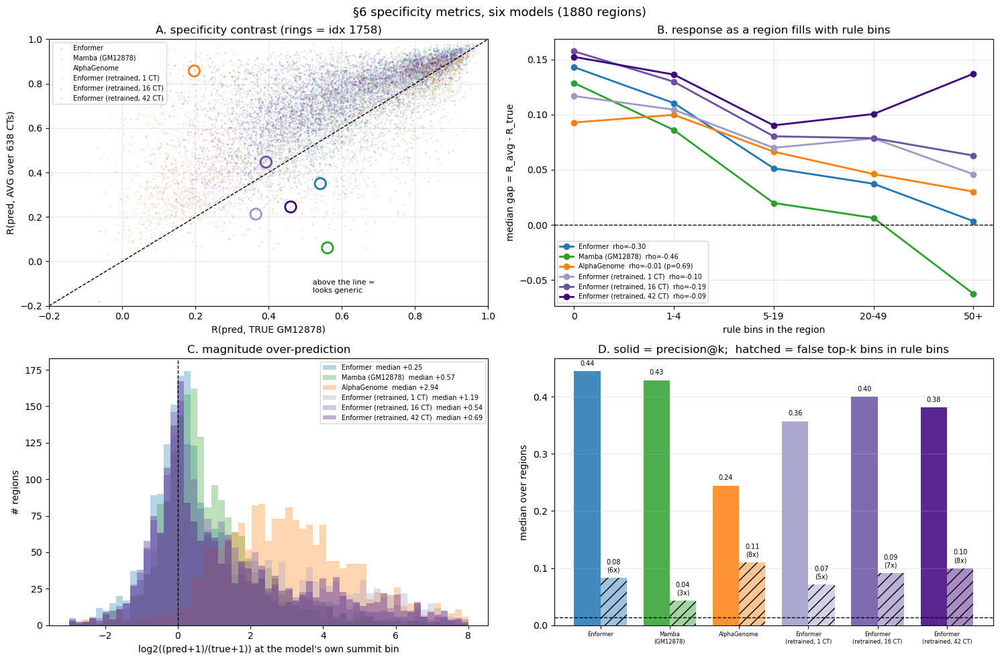

In [9]:
# §6b - the four-panel figure.
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

ax = axes[0, 0]
for key in ALL_KEYS:
    m = met[key]
    ax.scatter(m['R_true'], m['R_avg'], s=4, alpha=0.18, color=COLORS[key], label=PRETTY[key],
               edgecolors='none')
    ax.scatter(m['R_true'][mark_row], m['R_avg'][mark_row], s=140, facecolors='none',
               edgecolors=COLORS[key], linewidths=2, zorder=5)
ax.plot([-0.2, 1.0], [-0.2, 1.0], color='k', lw=1, ls='--')
ax.text(0.60, 0.05, 'above the line =\nlooks generic', fontsize=8, transform=ax.transAxes)
ax.set_xlim(-0.2, 1.0)
ax.set_ylim(-0.2, 1.0)
ax.set_xlabel('R(pred, TRUE GM12878)')
ax.set_ylabel('R(pred, AVG over 638 CTs)')
ax.set_title(f'A. specificity contrast (rings = idx {MARK_IDX})')
ax.legend(fontsize=7, loc='upper left')
ax.grid(alpha=0.3)

ax = axes[0, 1]
xs = np.arange(len(STRATA_LAB))
for key in ALL_KEYS:
    g_ = met[key]['gap']
    ok = ~np.isnan(g_)
    rho, pv = spearmanr(RC_ELIG[ok], g_[ok])
    ax.plot(xs, strat[key]['gap'], 'o-', color=COLORS[key], lw=2,
            label=f'{PRETTY[key]}  rho={rho:+.2f}' + ('' if pv < 0.01 else f' (p={pv:.2f})'))
ax.axhline(0, color='k', lw=1, ls='--')
ax.set_xticks(xs)
ax.set_xticklabels(STRATA_LAB)
ax.set_xlabel('rule bins in the region')
ax.set_ylabel('median gap = R_avg - R_true')
ax.set_title('B. response as a region fills with rule bins')
ax.legend(fontsize=7)
ax.grid(alpha=0.3)

ax = axes[1, 0]
bins = np.linspace(-3, 8, 60)
for key in ALL_KEYS:
    v = met[key]['log2_summit']
    ax.hist(v[~np.isnan(v)], bins=bins, color=COLORS[key], alpha=0.32, histtype='stepfilled',
            label=f'{PRETTY[key]}  median {np.nanmedian(v):+.2f}')
ax.axvline(0, color='k', lw=1, ls='--')
ax.set_xlabel("log2((pred+1)/(true+1)) at the model's own summit bin")
ax.set_ylabel('# regions')
ax.set_title('C. magnitude over-prediction')
ax.legend(fontsize=7)

ax = axes[1, 1]
w = 0.38
for j, key in enumerate(ALL_KEYS):
    pk = np.nanmedian(met[key]['prec_at_k'])
    fr = np.nanmedian(met[key]['fp_in_rule'])
    ax.bar(j - w / 2, pk, w, color=COLORS[key], alpha=0.85)
    ax.bar(j + w / 2, fr, w, color=COLORS[key], alpha=0.45, hatch='//')
    ax.text(j - w / 2, pk + 0.01, f'{pk:.2f}', ha='center', fontsize=7)
    ax.text(j + w / 2, fr + 0.01, f'{fr:.2f}\n({fr/RULE_PREV:.0f}x)', ha='center', fontsize=7)
ax.axhline(RULE_PREV, color='k', lw=1, ls='--')
ax.set_xticks(range(len(ALL_KEYS)))
ax.set_xticklabels([PRETTY[k].replace(' (', '\n(') for k in ALL_KEYS], fontsize=6)
ax.set_ylabel('median over regions')
ax.set_title('D. solid = precision@k;  hatched = false top-k bins in rule bins')
ax.grid(axis='y', alpha=0.3)

fig.suptitle(f'§6 specificity metrics, six models ({len(eligible)} regions)', fontsize=13)
fig.tight_layout()
plt.show()

## 7. = `comparing_model3` §10 — accuracy vs how generic the region isx = `R(TRUE GM12878, AVG)` per region (model-independent): left = the target looks nothing likegeneric expression, right = target and average nearly identical. y = `R(pred, TRUE)` then`R(pred, AVG)`. Thick lines are running medians over 12 equal-count x-bins.

raw R Enformer:   0%|          | 0/1880 [00:00<?, ?it/s]

raw R Enformer:   4%|▍         | 83/1880 [00:00<00:02, 825.41it/s]

raw R Enformer:   9%|▉         | 166/1880 [00:00<00:02, 820.95it/s]

raw R Enformer:  13%|█▎        | 249/1880 [00:00<00:01, 821.67it/s]

raw R Enformer:  18%|█▊        | 332/1880 [00:00<00:01, 819.91it/s]

raw R Enformer:  22%|██▏       | 415/1880 [00:00<00:01, 822.64it/s]

raw R Enformer:  26%|██▋       | 498/1880 [00:00<00:01, 824.74it/s]

raw R Enformer:  31%|███       | 582/1880 [00:00<00:01, 826.87it/s]

raw R Enformer:  35%|███▌      | 665/1880 [00:00<00:01, 827.34it/s]

raw R Enformer:  40%|███▉      | 749/1880 [00:00<00:01, 829.27it/s]

raw R Enformer:  44%|████▍     | 832/1880 [00:01<00:01, 826.56it/s]

raw R Enformer:  49%|████▊     | 916/1880 [00:01<00:01, 827.54it/s]

raw R Enformer:  53%|█████▎    | 1000/1880 [00:01<00:01, 828.54it/s]

raw R Enformer:  58%|█████▊    | 1083/1880 [00:01<00:00, 828.79it/s]

raw R Enformer:  62%|██████▏   | 1166/1880 [00:01<00:00, 828.63it/s]

raw R Enformer:  66%|██████▋   | 1250/1880 [00:01<00:00, 829.25it/s]

raw R Enformer:  71%|███████   | 1333/1880 [00:01<00:00, 827.62it/s]

raw R Enformer:  75%|███████▌  | 1416/1880 [00:01<00:00, 826.98it/s]

raw R Enformer:  80%|███████▉  | 1499/1880 [00:01<00:00, 817.76it/s]

raw R Enformer:  84%|████████▍ | 1581/1880 [00:01<00:00, 814.42it/s]

raw R Enformer:  89%|████████▊ | 1664/1880 [00:02<00:00, 818.11it/s]

raw R Enformer:  93%|█████████▎| 1747/1880 [00:02<00:00, 821.53it/s]

raw R Enformer:  97%|█████████▋| 1831/1880 [00:02<00:00, 824.47it/s]

raw R Enformer: 100%|██████████| 1880/1880 [00:02<00:00, 824.41it/s]

raw R Mamba (GM12878):   0%|          | 0/1880 [00:00<?, ?it/s]

raw R Mamba (GM12878):   4%|▍         | 84/1880 [00:00<00:02, 839.94it/s]

raw R Mamba (GM12878):   9%|▉         | 169/1880 [00:00<00:02, 843.70it/s]

raw R Mamba (GM12878):  14%|█▎        | 254/1880 [00:00<00:01, 844.51it/s]

raw R Mamba (GM12878):  18%|█▊        | 339/1880 [00:00<00:01, 844.99it/s]

raw R Mamba (GM12878):  23%|██▎       | 424/1880 [00:00<00:01, 842.70it/s]

raw R Mamba (GM12878):  27%|██▋       | 510/1880 [00:00<00:01, 845.59it/s]

raw R Mamba (GM12878):  32%|███▏      | 595/1880 [00:00<00:01, 845.59it/s]

raw R Mamba (GM12878):  36%|███▌      | 680/1880 [00:00<00:01, 839.27it/s]

raw R Mamba (GM12878):  41%|████      | 764/1880 [00:00<00:01, 838.96it/s]

raw R Mamba (GM12878):  45%|████▌     | 848/1880 [00:01<00:01, 838.71it/s]

raw R Mamba (GM12878):  50%|████▉     | 932/1880 [00:01<00:01, 838.87it/s]

raw R Mamba (GM12878):  54%|█████▍    | 1016/1880 [00:01<00:01, 838.79it/s]

raw R Mamba (GM12878):  59%|█████▊    | 1101/1880 [00:01<00:00, 839.25it/s]

raw R Mamba (GM12878):  63%|██████▎   | 1186/1880 [00:01<00:00, 840.43it/s]

raw R Mamba (GM12878):  68%|██████▊   | 1271/1880 [00:01<00:00, 840.63it/s]

raw R Mamba (GM12878):  72%|███████▏  | 1356/1880 [00:01<00:00, 837.92it/s]

raw R Mamba (GM12878):  77%|███████▋  | 1440/1880 [00:01<00:00, 835.66it/s]

raw R Mamba (GM12878):  81%|████████  | 1524/1880 [00:01<00:00, 836.57it/s]

raw R Mamba (GM12878):  86%|████████▌ | 1609/1880 [00:01<00:00, 838.47it/s]

raw R Mamba (GM12878):  90%|█████████ | 1694/1880 [00:02<00:00, 839.90it/s]

raw R Mamba (GM12878):  95%|█████████▍| 1779/1880 [00:02<00:00, 841.34it/s]

raw R Mamba (GM12878):  99%|█████████▉| 1864/1880 [00:02<00:00, 840.95it/s]

raw R Mamba (GM12878): 100%|██████████| 1880/1880 [00:02<00:00, 840.08it/s]

raw R AlphaGenome:   0%|          | 0/1880 [00:00<?, ?it/s]

raw R AlphaGenome:   4%|▍         | 84/1880 [00:00<00:02, 838.34it/s]

raw R AlphaGenome:   9%|▉         | 168/1880 [00:00<00:02, 834.38it/s]

raw R AlphaGenome:  13%|█▎        | 252/1880 [00:00<00:01, 834.48it/s]

raw R AlphaGenome:  18%|█▊        | 336/1880 [00:00<00:01, 836.53it/s]

raw R AlphaGenome:  22%|██▏       | 420/1880 [00:00<00:01, 836.28it/s]

raw R AlphaGenome:  27%|██▋       | 504/1880 [00:00<00:01, 829.13it/s]

raw R AlphaGenome:  31%|███▏      | 588/1880 [00:00<00:01, 831.46it/s]

raw R AlphaGenome:  36%|███▌      | 673/1880 [00:00<00:01, 834.10it/s]

raw R AlphaGenome:  40%|████      | 758/1880 [00:00<00:01, 837.05it/s]

raw R AlphaGenome:  45%|████▍     | 843/1880 [00:01<00:01, 838.97it/s]

raw R AlphaGenome:  49%|████▉     | 928/1880 [00:01<00:01, 839.80it/s]

raw R AlphaGenome:  54%|█████▍    | 1013/1880 [00:01<00:01, 840.73it/s]

raw R AlphaGenome:  58%|█████▊    | 1098/1880 [00:01<00:00, 838.22it/s]

raw R AlphaGenome:  63%|██████▎   | 1183/1880 [00:01<00:00, 839.43it/s]

raw R AlphaGenome:  67%|██████▋   | 1267/1880 [00:01<00:00, 837.73it/s]

raw R AlphaGenome:  72%|███████▏  | 1351/1880 [00:01<00:00, 835.85it/s]

raw R AlphaGenome:  76%|███████▋  | 1435/1880 [00:01<00:00, 836.95it/s]

raw R AlphaGenome:  81%|████████  | 1519/1880 [00:01<00:00, 837.10it/s]

raw R AlphaGenome:  85%|████████▌ | 1603/1880 [00:01<00:00, 836.63it/s]

raw R AlphaGenome:  90%|████████▉ | 1688/1880 [00:02<00:00, 838.09it/s]

raw R AlphaGenome:  94%|█████████▍| 1772/1880 [00:02<00:00, 837.59it/s]

raw R AlphaGenome:  99%|█████████▊| 1856/1880 [00:02<00:00, 835.70it/s]

raw R AlphaGenome: 100%|██████████| 1880/1880 [00:02<00:00, 836.29it/s]

raw R Enformer (retrained, 1 CT):   0%|          | 0/1880 [00:00<?, ?it/s]

raw R Enformer (retrained, 1 CT):   5%|▍         | 85/1880 [00:00<00:02, 845.45it/s]

raw R Enformer (retrained, 1 CT):   9%|▉         | 170/1880 [00:00<00:02, 845.95it/s]

raw R Enformer (retrained, 1 CT):  14%|█▎        | 255/1880 [00:00<00:01, 844.30it/s]

raw R Enformer (retrained, 1 CT):  18%|█▊        | 340/1880 [00:00<00:01, 839.31it/s]

raw R Enformer (retrained, 1 CT):  23%|██▎       | 425/1880 [00:00<00:01, 842.25it/s]

raw R Enformer (retrained, 1 CT):  27%|██▋       | 511/1880 [00:00<00:01, 846.61it/s]

raw R Enformer (retrained, 1 CT):  32%|███▏      | 596/1880 [00:00<00:01, 844.01it/s]

raw R Enformer (retrained, 1 CT):  36%|███▋      | 682/1880 [00:00<00:01, 847.71it/s]

raw R Enformer (retrained, 1 CT):  41%|████      | 768/1880 [00:00<00:01, 848.92it/s]

raw R Enformer (retrained, 1 CT):  45%|████▌     | 853/1880 [00:01<00:01, 848.06it/s]

raw R Enformer (retrained, 1 CT):  50%|████▉     | 938/1880 [00:01<00:01, 831.22it/s]

raw R Enformer (retrained, 1 CT):  54%|█████▍    | 1023/1880 [00:01<00:01, 835.69it/s]

raw R Enformer (retrained, 1 CT):  59%|█████▉    | 1107/1880 [00:01<00:00, 836.77it/s]

raw R Enformer (retrained, 1 CT):  63%|██████▎   | 1191/1880 [00:01<00:00, 832.13it/s]

raw R Enformer (retrained, 1 CT):  68%|██████▊   | 1275/1880 [00:01<00:00, 831.37it/s]

raw R Enformer (retrained, 1 CT):  72%|███████▏  | 1359/1880 [00:01<00:00, 833.79it/s]

raw R Enformer (retrained, 1 CT):  77%|███████▋  | 1443/1880 [00:01<00:00, 813.18it/s]

raw R Enformer (retrained, 1 CT):  81%|████████  | 1525/1880 [00:01<00:00, 812.93it/s]

raw R Enformer (retrained, 1 CT):  86%|████████▌ | 1610/1880 [00:01<00:00, 821.39it/s]

raw R Enformer (retrained, 1 CT):  90%|█████████ | 1695/1880 [00:02<00:00, 827.54it/s]

raw R Enformer (retrained, 1 CT):  95%|█████████▍| 1779/1880 [00:02<00:00, 831.21it/s]

raw R Enformer (retrained, 1 CT):  99%|█████████▉| 1865/1880 [00:02<00:00, 837.81it/s]

raw R Enformer (retrained, 1 CT): 100%|██████████| 1880/1880 [00:02<00:00, 835.07it/s]

raw R Enformer (retrained, 16 CT):   0%|          | 0/1880 [00:00<?, ?it/s]

raw R Enformer (retrained, 16 CT):   5%|▍         | 85/1880 [00:00<00:02, 847.49it/s]

raw R Enformer (retrained, 16 CT):   9%|▉         | 170/1880 [00:00<00:02, 847.62it/s]

raw R Enformer (retrained, 16 CT):  14%|█▎        | 255/1880 [00:00<00:01, 848.05it/s]

raw R Enformer (retrained, 16 CT):  18%|█▊        | 340/1880 [00:00<00:01, 848.09it/s]

raw R Enformer (retrained, 16 CT):  23%|██▎       | 426/1880 [00:00<00:01, 850.96it/s]

raw R Enformer (retrained, 16 CT):  27%|██▋       | 512/1880 [00:00<00:01, 851.43it/s]

raw R Enformer (retrained, 16 CT):  32%|███▏      | 598/1880 [00:00<00:01, 850.42it/s]

raw R Enformer (retrained, 16 CT):  36%|███▋      | 684/1880 [00:00<00:01, 842.12it/s]

raw R Enformer (retrained, 16 CT):  41%|████      | 769/1880 [00:00<00:01, 843.08it/s]

raw R Enformer (retrained, 16 CT):  45%|████▌     | 855/1880 [00:01<00:01, 846.43it/s]

raw R Enformer (retrained, 16 CT):  50%|█████     | 940/1880 [00:01<00:01, 846.12it/s]

raw R Enformer (retrained, 16 CT):  55%|█████▍    | 1025/1880 [00:01<00:01, 846.33it/s]

raw R Enformer (retrained, 16 CT):  59%|█████▉    | 1111/1880 [00:01<00:00, 849.11it/s]

raw R Enformer (retrained, 16 CT):  64%|██████▎   | 1197/1880 [00:01<00:00, 850.15it/s]

raw R Enformer (retrained, 16 CT):  68%|██████▊   | 1283/1880 [00:01<00:00, 844.21it/s]

raw R Enformer (retrained, 16 CT):  73%|███████▎  | 1368/1880 [00:01<00:00, 821.60it/s]

raw R Enformer (retrained, 16 CT):  77%|███████▋  | 1452/1880 [00:01<00:00, 826.04it/s]

raw R Enformer (retrained, 16 CT):  82%|████████▏ | 1537/1880 [00:01<00:00, 831.28it/s]

raw R Enformer (retrained, 16 CT):  86%|████████▋ | 1623/1880 [00:01<00:00, 837.63it/s]

raw R Enformer (retrained, 16 CT):  91%|█████████ | 1708/1880 [00:02<00:00, 841.16it/s]

raw R Enformer (retrained, 16 CT):  95%|█████████▌| 1794/1880 [00:02<00:00, 844.29it/s]

raw R Enformer (retrained, 16 CT): 100%|█████████▉| 1879/1880 [00:02<00:00, 818.99it/s]

raw R Enformer (retrained, 16 CT): 100%|██████████| 1880/1880 [00:02<00:00, 838.80it/s]

raw R Enformer (retrained, 42 CT):   0%|          | 0/1880 [00:00<?, ?it/s]

raw R Enformer (retrained, 42 CT):   5%|▍         | 85/1880 [00:00<00:02, 841.64it/s]

raw R Enformer (retrained, 42 CT):   9%|▉         | 170/1880 [00:00<00:02, 843.07it/s]

raw R Enformer (retrained, 42 CT):  14%|█▎        | 255/1880 [00:00<00:01, 844.75it/s]

raw R Enformer (retrained, 42 CT):  18%|█▊        | 340/1880 [00:00<00:01, 845.45it/s]

raw R Enformer (retrained, 42 CT):  23%|██▎       | 425/1880 [00:00<00:01, 846.54it/s]

raw R Enformer (retrained, 42 CT):  27%|██▋       | 510/1880 [00:00<00:01, 846.64it/s]

raw R Enformer (retrained, 42 CT):  32%|███▏      | 595/1880 [00:00<00:01, 841.49it/s]

raw R Enformer (retrained, 42 CT):  36%|███▌      | 680/1880 [00:00<00:01, 838.60it/s]

raw R Enformer (retrained, 42 CT):  41%|████      | 765/1880 [00:00<00:01, 841.49it/s]

raw R Enformer (retrained, 42 CT):  45%|████▌     | 850/1880 [00:01<00:01, 841.01it/s]

raw R Enformer (retrained, 42 CT):  50%|████▉     | 935/1880 [00:01<00:01, 839.37it/s]

raw R Enformer (retrained, 42 CT):  54%|█████▍    | 1020/1880 [00:01<00:01, 840.87it/s]

raw R Enformer (retrained, 42 CT):  59%|█████▉    | 1105/1880 [00:01<00:00, 842.90it/s]

raw R Enformer (retrained, 42 CT):  63%|██████▎   | 1190/1880 [00:01<00:00, 844.59it/s]

raw R Enformer (retrained, 42 CT):  68%|██████▊   | 1276/1880 [00:01<00:00, 846.35it/s]

raw R Enformer (retrained, 42 CT):  72%|███████▏  | 1362/1880 [00:01<00:00, 847.33it/s]

raw R Enformer (retrained, 42 CT):  77%|███████▋  | 1447/1880 [00:01<00:00, 845.68it/s]

raw R Enformer (retrained, 42 CT):  81%|████████▏ | 1532/1880 [00:01<00:00, 843.95it/s]

raw R Enformer (retrained, 42 CT):  86%|████████▌ | 1617/1880 [00:01<00:00, 839.67it/s]

raw R Enformer (retrained, 42 CT):  91%|█████████ | 1702/1880 [00:02<00:00, 841.52it/s]

raw R Enformer (retrained, 42 CT):  95%|█████████▌| 1787/1880 [00:02<00:00, 841.93it/s]

raw R Enformer (retrained, 42 CT): 100%|█████████▉| 1872/1880 [00:02<00:00, 841.24it/s]

raw R Enformer (retrained, 42 CT): 100%|██████████| 1880/1880 [00:02<00:00, 842.46it/s]

x = R(TRUE, AVG): median 0.793, tertile cuts 0.655 / 0.894
x deciles (raw):      10%=0.32  20%=0.49  30%=0.62  40%=0.71  50%=0.79  60%=0.86  70%=0.91  80%=0.95  90%=0.98
x deciles (smoothed): 10%=0.43  20%=0.54  30%=0.61  40%=0.66  50%=0.72  60%=0.77  70%=0.83  80%=0.88  90%=0.92

model                                   specific  x<0.65                    middle         generic   x>=0.89
                                     R_true        R_avg       R_true        R_avg       R_true        R_avg
Enformer                              0.403        0.588        0.674        0.766        0.916        0.922
Mamba (GM12878)                       0.441        0.468        0.647        0.699        0.892        0.892
AlphaGenome                           0.129        0.423        0.204        0.329        0.895        0.929
Enformer (retrained, 1 CT)            0.266        0.473        0.525        0.600        0.831        0.845
Enformer (retrained, 16 CT)           0.343        0.583        

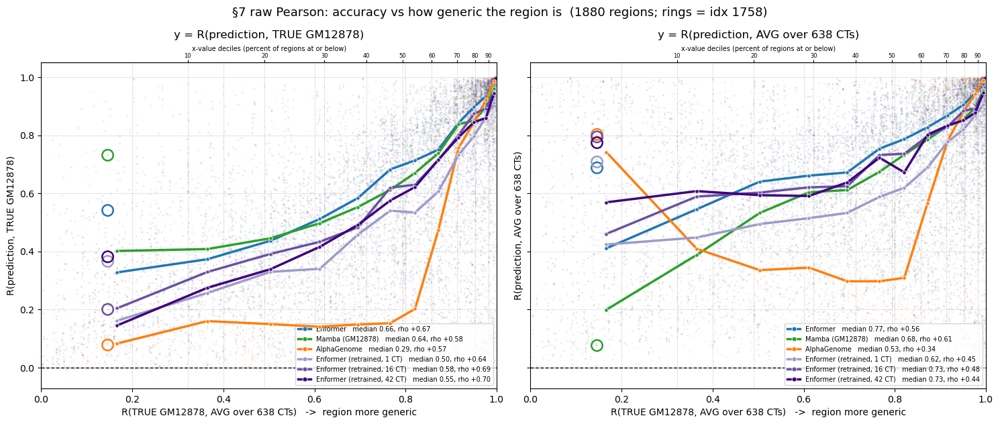

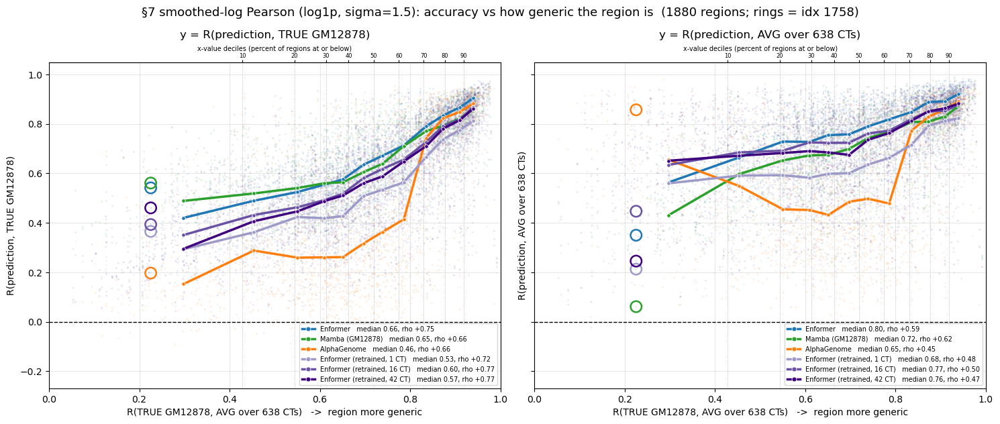

In [10]:
# §7 - x is a target-vs-target correlation; y is prediction-vs-target. Raw and smoothed-log.
if 'x_raw' not in globals():
    x_raw = np.array([raw_pearson(TRUE_ALL[i], AVG_ALL[i]) for i in eligible])
    x_sm = np.array([smoothed_log_pearson(TRUE_ALL[i], AVG_ALL[i]) for i in eligible])
    y_raw = {}
    for key in ALL_KEYS:
        y_raw[key] = {'true': np.full(len(eligible), np.nan),
                      'avg': np.full(len(eligible), np.nan)}
        for row, i in enumerate(tqdm(eligible, desc=f'raw R {PRETTY[key]}')):
            pr = np.asarray(preds[key][i], dtype=np.float64)
            y_raw[key]['true'][row] = raw_pearson(pr, TRUE_ALL[i])
            y_raw[key]['avg'][row] = raw_pearson(pr, AVG_ALL[i])
y_sm = {k: {'true': met[k]['R_true'], 'avg': met[k]['R_avg']} for k in ALL_KEYS}

q1, q2 = np.nanpercentile(x_raw, [33.3, 66.7])
terts = [(f'specific  x<{q1:.2f}', x_raw < q1), ('middle', (x_raw >= q1) & (x_raw < q2)),
         (f'generic   x>={q2:.2f}', x_raw >= q2)]
print(f'x = R(TRUE, AVG): median {np.nanmedian(x_raw):.3f}, tertile cuts {q1:.3f} / {q2:.3f}')
print('x deciles (raw):      ' + '  '.join(f'{q}%={v:.2f}' for q, v in
      zip(range(10, 100, 10), np.nanpercentile(x_raw, np.arange(10, 100, 10)))))
print('x deciles (smoothed): ' + '  '.join(f'{q}%={v:.2f}' for q, v in
      zip(range(10, 100, 10), np.nanpercentile(x_sm, np.arange(10, 100, 10)))) + '\n')
print(f"{'model':<30}" + ''.join(f'{lab:>26}' for lab, _ in terts))
print(f"{'':<30}" + ''.join(f"{'R_true':>13}{'R_avg':>13}" for _ in terts))
for key in ALL_KEYS:
    print(f'{PRETTY[key]:<30}' + ''.join(
        f"{np.nanmedian(y_raw[key]['true'][sel]):>13.3f}"
        f"{np.nanmedian(y_raw[key]['avg'][sel]):>13.3f}" for _, sel in terts))


def running_median(x, y, nbins=12):
    ok = ~np.isnan(x) & ~np.isnan(y)
    xs, ys = x[ok], y[ok]
    edges = np.unique(np.nanpercentile(xs, np.linspace(0, 100, nbins + 1)))
    cx, cy = [], []
    for a, b in zip(edges[:-1], edges[1:]):
        m = (xs >= a) & (xs <= b if b == edges[-1] else xs < b)
        if m.sum() >= 5:
            cx.append(np.median(xs[m]))
            cy.append(np.median(ys[m]))
    return np.array(cx), np.array(cy)


from matplotlib.lines import Line2D

for tag, x, y in [('raw Pearson', x_raw, y_raw),
                  ('smoothed-log Pearson (log1p, sigma=1.5)', x_sm, y_sm)]:
    # deciles of the x distribution: x is heavily right-skewed, so mark where the data is
    dec = np.nanpercentile(x[np.isfinite(x)], np.arange(10, 100, 10))
    fig, axes = plt.subplots(1, 2, figsize=(15, 6.4), sharex=True, sharey=True)
    for ax, which, ylab in [(axes[0], 'true', 'R(prediction, TRUE GM12878)'),
                            (axes[1], 'avg', 'R(prediction, AVG over 638 CTs)')]:
        handles = []
        for key in ALL_KEYS:
            yy = y[key][which]
            ok = ~np.isnan(x) & ~np.isnan(yy)
            rho = spearmanr(x[ok], yy[ok])[0]
            ax.scatter(x, yy, s=4, alpha=0.13, color=COLORS[key], edgecolors='none')
            cx, cy = running_median(x, yy)
            ax.plot(cx, cy, '-o', color=COLORS[key], lw=2.5, ms=4, markeredgecolor='white',
                    markeredgewidth=0.6, zorder=6)
            ax.scatter(x[mark_row], yy[mark_row], s=140, facecolors='none',
                       edgecolors=COLORS[key], linewidths=1.8, zorder=7)
            # fully opaque legend handle (the scatter itself is alpha=0.13 and unreadable at
            # legend size), matching the running-median line style
            handles.append(Line2D([0], [0], color=COLORS[key], lw=2.5, marker='o', ms=5,
                                  markeredgecolor='white', markeredgewidth=0.6, alpha=1.0,
                                  label=f'{PRETTY[key]}   median {np.nanmedian(yy):.2f}, '
                                        f'rho {rho:+.2f}'))
        ax.axhline(0, color='k', lw=1, ls='--')
        ax.set_xlim(0, 1)
        # decile guides on this axis + a labelled decile scale along the top
        for d in dec:
            ax.axvline(d, color='0.55', lw=0.6, ls=':', alpha=0.7, zorder=0)
        top = ax.secondary_xaxis('top')
        top.set_xticks(dec)
        top.set_xticklabels([str(q) for q in range(10, 100, 10)], fontsize=6)
        top.tick_params(length=3, pad=1)
        top.set_xlabel('x-value deciles (percent of regions at or below)', fontsize=7,
                       labelpad=2)
        ax.set_xlabel('R(TRUE GM12878, AVG over 638 CTs)   ->  region more generic')
        ax.set_ylabel(ylab)
        ax.set_title(f'y = {ylab}', pad=26)
        ax.legend(handles=handles, fontsize=7, loc='lower right')
        ax.grid(alpha=0.3)
    fig.suptitle(f'§7 {tag}: accuracy vs how generic the region is  '
                 f'({len(eligible)} regions; rings = idx {MARK_IDX})', fontsize=13)
    fig.tight_layout()
    plt.show()

## 8. One cell type only — `n1` (768ch) vs `n1_1536` (1536ch)

**Self-contained**: this section reloads every array it needs and does not depend on §1–§7 having
been run. The 16 CT and 42 CT retrained runs are dropped; `enformer_retrained_n1_1536` is added.
Five models, all scored against the same GM12878 CAGE target (track 5110):

| model | note |
|---|---|
| Enformer | original, ~5300 tracks |
| Enformer (retrained, 1 CT, 768ch) | `enformer_retrained_gm12878/`, `channels=768` |
| Enformer (retrained, 1 CT, 1536ch) | `enformer_retrained_n1_1536/`, `channels=1536` |
| Mamba (GM12878) | 1 cell type |
| AlphaGenome | |

Both retrained runs write **2-D** CAGE files (a single column, `target_index` 5110 read from
`*_cage_meta.json`), so unlike the 16/42 CT runs there is no column to resolve and no
`*_cage_tracks.csv` to read. §8b therefore gates on: (1) the file's target index is 5110, (2) its
target array is *identical* to this notebook's reference target, and (3) a **row-shuffle control**
that must fail the same test — otherwise "identical" would prove nothing.

§9–§13 repeat §3–§7 with these five models.

In [11]:
# §8a - self-contained reload. Everything below is recomputed unconditionally so this block
# runs correctly on a cold kernel and also after §1-§7 have populated the same names.
import os
import sys
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zarr
from tqdm import tqdm
from scipy.ndimage import gaussian_filter1d
from scipy.stats import pearsonr, spearmanr

sys.path.insert(0, '/data1/lesliec/sarthak/caduceus')
from evals.plotting_utils import Track, GeneAnnotation, plot_tracks

MODEL_OUT = '/data1/lesliec/sarthak/data/joint_playground/model_out'
ENFORMER_NPY = '/data1/lesliec/sarthak/data/enformer/data/model_out/enformer.npy'
BED_PATH = '/data1/lesliec/sarthak/data/DK_zarr/sequences_enformer.bed'
LABELS_ZARR = '/data1/lesliec/sarthak/data/enformer/data/labels.zarr'
AVG_CACHE = '/data1/lesliec/sarthak/data/enformer/data/avg_cage_test_all.npy'

ENFORMER_TRACK = 5110          # GM12878 CAGE
ALPHAGENOME_TRACK = 156
CAGE_START = 4675              # labels.zarr CAGE block = 4675:5313 (638 experiments)
SEQ_LEN, PRED_LEN, BIN = 131072, 896 * 128, 128
CROP = (SEQ_LEN - PRED_LEN) // 2
CONTEXT = 524288
HALF_CTX = CONTEXT // 2
OVERLAP_FRAC = 0.20
SMOOTH_SIGMA = 1.5

mamba_key = 'GM12878_no_mlm_predictions.npy'
enformer_key = 'enformer'
ag_key = 'alphagenome_cage_test_128bp.npy'

# --- base predictions + the reference GM12878 target -------------------------------
# the 5110 slice out of the 35 GB track file is the only genuinely slow read, so it is
# cached to its own .npy; delete the cache to force a re-slice.
ENFORMER_CACHE = f'{MODEL_OUT}/enformer_test_track{ENFORMER_TRACK}.npy'
if os.path.exists(ENFORMER_CACHE):
    _enf = np.load(ENFORMER_CACHE)
    print(f'loaded cached Enformer track {ENFORMER_TRACK} {_enf.shape}')
else:
    _enf = np.asarray(np.load(ENFORMER_NPY, mmap_mode='r')[:, :, ENFORMER_TRACK])
    np.save(ENFORMER_CACHE, _enf)
    print(f'sliced and cached {ENFORMER_CACHE} {_enf.shape}')

preds = {enformer_key: _enf}
_a = np.load(f'{MODEL_OUT}/{mamba_key}')
preds[mamba_key] = _a[:, :, 0] if _a.ndim == 3 else _a
preds[ag_key] = np.asarray(np.load(f'{MODEL_OUT}/{ag_key}', mmap_mode='r')[:, :, ALPHAGENOME_TRACK])
print('loaded base predictions')

t1 = np.load(f'{MODEL_OUT}/GM12878_base_targets_conv.npy')
TRUE_ALL = np.asarray(t1, dtype=np.float32)
print('reference target:', t1.shape, f'mean {t1.mean():.6f}')

COLORS = {enformer_key: '#1f77b4', mamba_key: '#2ca02c', ag_key: '#ff7f0e'}
PRETTY = {enformer_key: 'Enformer', mamba_key: 'Mamba (GM12878)', ag_key: 'AlphaGenome'}


def smoothed_log_pearson(pred, true, sigma=SMOOTH_SIGMA):
    p = gaussian_filter1d(np.log1p(np.clip(pred, 0, None)), sigma=sigma)
    t = gaussian_filter1d(np.log1p(np.clip(true, 0, None)), sigma=sigma)
    if np.std(p) < 1e-8 or np.std(t) < 1e-8:
        return np.nan
    return pearsonr(p, t)[0]


def raw_pearson(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    if a.std() < 1e-12 or b.std() < 1e-12:
        return np.nan
    return pearsonr(a, b)[0]


# --- region coordinates ------------------------------------------------------------
_bed = pd.read_csv(BED_PATH, sep='\t', header=None)
_test_bed = _bed[_bed.iloc[:, -1] == 'test'].reset_index(drop=True)
print(f'test regions: {len(_test_bed)}')


def region_coords(idx):
    chrom = str(_test_bed.iloc[idx, 0])
    start = int(_test_bed.iloc[idx, 1]) + CROP
    return chrom, start, start + PRED_LEN


# --- cross-cell-type average CAGE (cached whole-test-set scan) ---------------------
_labels_test = zarr.open(LABELS_ZARR, mode='r')['test']
if os.path.exists(AVG_CACHE):
    AVG_ALL = np.load(AVG_CACHE)
    print(f'loaded cached AVG_ALL {AVG_ALL.shape}')
else:
    AVG_ALL = np.empty((_labels_test.shape[0], 896), dtype=np.float32)
    for s in tqdm(range(0, _labels_test.shape[0], 32), desc='AVG scan'):
        e = min(s + 32, _labels_test.shape[0])
        AVG_ALL[s:e] = np.asarray(_labels_test[s:e, :, CAGE_START:]).mean(axis=2)
    np.save(AVG_CACHE, AVG_ALL)
    print(f'scanned and cached {AVG_CACHE}')

# --- blacklist --------------------------------------------------------------------
_split_col = _bed.shape[1] - 1
_train_by_chrom = {}
for chrom, g in _bed[_bed[_split_col] == 'train'].groupby(0):
    ce = (g[1].astype(int).to_numpy() + g[2].astype(int).to_numpy()) // 2
    _train_by_chrom[str(chrom)] = (ce - HALF_CTX, ce + HALF_CTX)
blacklisted = np.zeros(len(_test_bed), dtype=bool)
for i in range(len(_test_bed)):
    chrom = str(_test_bed.iloc[i, 0])
    c, d = int(_test_bed.iloc[i, 1]), int(_test_bed.iloc[i, 2])
    if chrom not in _train_by_chrom:
        continue
    a, b = _train_by_chrom[chrom]
    if np.any(np.maximum(0, np.minimum(b, d) - np.maximum(a, c)) > OVERLAP_FRAC * (d - c)):
        blacklisted[i] = True
allowed = ~blacklisted
print(f'blacklisted {blacklisted.sum()} / {len(blacklisted)}; {allowed.sum()} allowed')

# Two gene tracks are drawn under every panel. The protein-coding-only view is the
# conventional one, but it is misleading at loci whose transcription is noncoding: the
# rule regions include imprinted domains (14q32 DLK1-DIO3, 15q11 SNRPN) where nearly
# every gene is a lncRNA, miRNA or snoRNA and a protein-coding track looks empty.
# `ann` stays the protein-coding annotation so any code that used it is unchanged.
GENE_TYPES_ALL = None            # None = every biotype GENCODE lists
ann_pc = GeneAnnotation()                              # protein_coding only
ann_all = GeneAnnotation(gene_types=GENE_TYPES_ALL)    # every biotype
ann = ann_pc
print(f'annotation rows: protein-coding {len(ann_pc.df):,}, all biotypes {len(ann_all.df):,}')
GENE_TRACKS = [('Protein-coding', ann_pc), ('All genes', ann_all)]
print('\n§8a reload complete.')

loaded cached Enformer track 5110 (1937, 896)
loaded base predictions
reference target: (1937, 896) mean 0.570867
test regions: 1937
loaded cached AVG_ALL (1937, 896)
blacklisted 54 / 1937; 1883 allowed


annotation rows: protein-coding 3,222,714, all biotypes 4,181,314

§8a reload complete.


### 8b. Target gate for the two 1-CT runs

Same contract as §2, adapted to 2-D CAGE files. For each run:

1. `*_cage_meta.json` must report `target_indices == [5110]` and `model_cell_types == ['GM12878']`;
2. the run's target array must be **exactly equal** to `GM12878_base_targets_conv.npy` — this is
   the check that matters;
3. the predictions must *not* equal the targets (a silently copied file would score ~1.0);
4. plus two cheap falsifiability checks: a row-roll of the target must fail (2), and the two runs'
   targets must equal *each other* while their predictions must differ.

Note what is **not** checked here. §2's neighbouring-column control exists because the 16/42 CT
runs write a 3-D CAGE array and the GM12878 column has to be resolved; if every column held the
same data, any column would pass and the match would prove nothing. Both 1-CT runs write a **2-D**
array — one column, no neighbours — so there is no column mapping to verify and that control is
skipped (the original code already guards it with `tg.ndim == 3`). The row-roll in (4) is a weaker
claim: it only rules out a degenerate target, it is not a substitute for the column control.

Incidentally, `enformer_retrained_n1_1536/` does ship a `_tracks.csv`, but it is the **combined**
dnase+cage file (col 0 = dnase/track 12, col 1 = cage/track 5110). Its `column` indexes the
combined array, not the cage array, so it must not be used to slice the cage file. The gate looks
for `*_cage_tracks.csv`, which neither 1-CT run has, so both correctly take the `meta` branch.

Any failure raises and stops the notebook.

In [12]:
# §8b - load the two 1-CT retrained Enformers and hard-gate on the targets.
RETRAIN_SPEC = [
    # key, directory, file stem, pretty label, colour
    ('enformer_n1', 'enformer_retrained_gm12878', 'enformer_retrained_gm12878',
     'Enformer (retrained, 1 CT, 768ch)', '#9e9ac8'),
    ('enformer_n1_1536', 'enformer_retrained_n1_1536', 'enformer_retrained_n1_1536',
     'Enformer (retrained, 1 CT, 1536ch)', '#54278f'),
]

REF = np.asarray(t1)
RETRAIN_KEYS = []
gate_rows = []
gate_targets = {}
for key, dirname, stem, label, color in RETRAIN_SPEC:
    d = f'{MODEL_OUT}/{dirname}'
    cfg = json.load(open(f'{d}/training_config.json'))
    meta = json.load(open(f'{d}/{stem}_cage_meta.json'))
    tg = np.load(f'{d}/{stem}_cage_targets.npy', mmap_mode='r')

    # --- resolve the GM12878 CAGE column (never hard-coded) ---
    tracks_csv = f'{d}/{stem}_cage_tracks.csv'
    if os.path.exists(tracks_csv):
        tr = pd.read_csv(tracks_csv)
        row = tr[(tr['cell_type'] == 'GM12878') & (tr['assay'] == 'cage')]
        assert len(row) == 1, f'{stem}: expected 1 GM12878 cage row in tracks.csv, got {len(row)}'
        col = int(row['column'].iloc[0])
        tidx = int(row['target_index'].iloc[0])
        reported_r = float(row['pearson_r'].iloc[0])
        src = 'cage_tracks.csv'
    else:
        # single-cell-type run: the cage file is 2-D, one column
        assert len(meta['target_indices']) == 1, (
            f'GATE FAILED [{key}]: no cage_tracks.csv but meta lists '
            f'{len(meta["target_indices"])} target indices, so the column is ambiguous.')
        col, tidx, src = 0, int(meta['target_indices'][0]), 'meta (2-D file)'
        reported_r = float(meta['pearson_r'][0])
    assert tidx == ENFORMER_TRACK, (
        f'GATE FAILED [{key}]: target_index is {tidx}, expected {ENFORMER_TRACK}')
    assert meta['model_cell_types'] == ['GM12878'], (
        f'GATE FAILED [{key}]: model_cell_types is {meta["model_cell_types"]}, expected [GM12878]')

    targ = np.asarray(tg) if tg.ndim == 2 else np.asarray(tg[:, :, col])
    assert targ.shape == REF.shape, (
        f'GATE FAILED [{key}]: sliced target is {targ.shape}, reference is {REF.shape}')
    exact = np.array_equal(targ, REF)
    close = np.allclose(targ, REF, rtol=1e-5, atol=1e-6)
    maxdiff = float(np.abs(targ - REF).max())
    assert exact or close, (
        f'GATE FAILED [{key}]: target does not match GM12878_base_targets_conv.npy '
        f'(max|diff| = {maxdiff:.6g}). Refusing to continue - the sliced index is wrong or the '
        f'target differs.')

    # --- controls: something must FAIL the test above, else it proves nothing. ---
    # 3-D file -> the neighbouring columns, which is what proves the column mapping is right.
    # 2-D file -> no neighbours exist and there is no column to resolve, so all that is left is
    # a row-roll degeneracy check: it only rules out a target so uniform that any array would
    # match. It is NOT equivalent to the column control.
    controls = []
    if tg.ndim == 3 and tg.shape[2] > 1:
        for other in [c for c in (col - 1, col + 1) if 0 <= c < tg.shape[2]]:
            controls.append((f'col{other}',
                             float(np.abs(np.asarray(tg[:, :, other]) - REF).max())))
    else:
        controls.append(('roll+1 (degeneracy only)',
                         float(np.abs(np.roll(targ, 1, axis=0) - REF).max())))
    assert controls and all(od > 0 for _, od in controls), (
        f'GATE FAILED [{key}]: the control also matches the reference target, so the equality '
        f'test is not discriminating.')

    pr = np.load(f'{d}/{stem}_cage_predictions.npy', mmap_mode='r')
    preds[key] = np.ascontiguousarray(pr if pr.ndim == 2 else pr[:, :, col])
    assert preds[key].shape == REF.shape
    # the predictions must NOT be the targets (a silently copied file would score ~1.0)
    assert not np.array_equal(preds[key], REF), (
        f'GATE FAILED [{key}]: predictions are identical to the targets.')
    COLORS[key], PRETTY[key] = color, label
    RETRAIN_KEYS.append(key)
    gate_targets[key] = targ
    gate_rows.append(dict(key=key, n_ct=cfg['num_cell_types'], ch=cfg['channels'], ndim=tg.ndim,
                          col=col, src=src, exact=exact, maxdiff=maxdiff, controls=controls,
                          reported_r=reported_r, ckpt=meta['checkpoint']))

# --- cross-run: the two runs are scored on the same target, from different weights ---
ka, kb = RETRAIN_KEYS
assert np.array_equal(gate_targets[ka], gate_targets[kb]), (
    f'GATE FAILED: {ka} and {kb} do not share the same target array.')
assert not np.array_equal(preds[ka], preds[kb]), (
    f'GATE FAILED: {ka} and {kb} have identical predictions - the same run was loaded twice.')

print(f"{'model':<36}{'CTs':>4}{'ch':>6}{'src':>18}{'GM col':>7}{'exact':>7}"
      f"{'max|diff|':>11}{'control max|diff|':>30}{'reported r':>12}")
for g in gate_rows:
    ctl = ', '.join(f'{c}:{d:.4g}' for c, d in g['controls'])
    print(f"{PRETTY[g['key']]:<36}{g['n_ct']:>4}{g['ch']:>6}{g['src']:>18}{g['col']:>7}"
          f"{str(g['exact']):>7}{g['maxdiff']:>11.4g}{ctl:>30}{g['reported_r']:>12.4f}")
for g in gate_rows:
    print(f"  {PRETTY[g['key']]:<36} ckpt {g['ckpt']}")
print('\nTARGET GATE PASSED: both 1-CT runs are bit-exact against '
      'GM12878_base_targets_conv.npy and against each other, with distinct predictions.')
print('NOTE: the 2-D cage files have no neighbouring column, so §2\'s column-mapping control '
      'does not apply here; nothing needs resolving.')

ALL_KEYS = [enformer_key] + RETRAIN_KEYS + [mamba_key, ag_key]
print('\nmodels in play:', [PRETTY[k] for k in ALL_KEYS])

model                                CTs    ch               src GM col  exact  max|diff|             control max|diff|  reported r
Enformer (retrained, 1 CT, 768ch)      1   768   meta (2-D file)      0   True          0roll+1 (degeneracy only):454.5      0.6425
Enformer (retrained, 1 CT, 1536ch)     1  1536   meta (2-D file)      0   True          0roll+1 (degeneracy only):454.5      0.6836
  Enformer (retrained, 1 CT, 768ch)    ckpt runs/n1/best/ckpt-36
  Enformer (retrained, 1 CT, 1536ch)   ckpt runs/n1_1536/best/ckpt-50

TARGET GATE PASSED: both 1-CT runs are bit-exact against GM12878_base_targets_conv.npy and against each other, with distinct predictions.
NOTE: the 2-D cage files have no neighbouring column, so §2's column-mapping control does not apply here; nothing needs resolving.

models in play: ['Enformer', 'Enformer (retrained, 1 CT, 768ch)', 'Enformer (retrained, 1 CT, 1536ch)', 'Mamba (GM12878)', 'AlphaGenome']


## 9. = §3 — boxplot across the five models

Per-region correlation against the GM12878 target under both metrics: smoothed-log Pearson
(log1p + Gaussian sigma=1.5) and plain per-bin Pearson. Bold number is the mean, black bar the median.

Enformer:   0%|          | 0/1937 [00:00<?, ?it/s]

Enformer:   7%|▋         | 137/1937 [00:00<00:01, 1368.44it/s]

Enformer:  14%|█▍        | 274/1937 [00:00<00:01, 871.46it/s] 

Enformer:  21%|██▏       | 414/1937 [00:00<00:01, 1054.58it/s]

Enformer:  29%|██▊       | 553/1937 [00:00<00:01, 1165.21it/s]

Enformer:  36%|███▌      | 693/1937 [00:00<00:01, 1240.18it/s]

Enformer:  43%|████▎     | 834/1937 [00:00<00:00, 1291.07it/s]

Enformer:  50%|█████     | 975/1937 [00:00<00:00, 1326.01it/s]

Enformer:  58%|█████▊    | 1116/1937 [00:00<00:00, 1351.56it/s]

Enformer:  65%|██████▍   | 1256/1937 [00:00<00:00, 1366.11it/s]

Enformer:  72%|███████▏  | 1397/1937 [00:01<00:00, 1376.78it/s]

Enformer:  79%|███████▉  | 1538/1937 [00:01<00:00, 1385.19it/s]

Enformer:  87%|████████▋ | 1679/1937 [00:01<00:00, 1391.92it/s]

Enformer:  94%|█████████▍| 1819/1937 [00:01<00:00, 1393.69it/s]

Enformer: 100%|██████████| 1937/1937 [00:01<00:00, 1303.09it/s]

Enformer (retrained, 1 CT, 768ch):   0%|          | 0/1937 [00:00<?, ?it/s]

Enformer (retrained, 1 CT, 768ch):   7%|▋         | 143/1937 [00:00<00:01, 1427.06it/s]

Enformer (retrained, 1 CT, 768ch):  15%|█▍        | 286/1937 [00:00<00:01, 1369.47it/s]

Enformer (retrained, 1 CT, 768ch):  22%|██▏       | 430/1937 [00:00<00:01, 1398.69it/s]

Enformer (retrained, 1 CT, 768ch):  30%|██▉       | 573/1937 [00:00<00:00, 1407.34it/s]

Enformer (retrained, 1 CT, 768ch):  37%|███▋      | 717/1937 [00:00<00:00, 1417.18it/s]

Enformer (retrained, 1 CT, 768ch):  44%|████▍     | 860/1937 [00:00<00:00, 1419.90it/s]

Enformer (retrained, 1 CT, 768ch):  52%|█████▏    | 1003/1937 [00:00<00:00, 1418.38it/s]

Enformer (retrained, 1 CT, 768ch):  59%|█████▉    | 1146/1937 [00:00<00:00, 1421.81it/s]

Enformer (retrained, 1 CT, 768ch):  67%|██████▋   | 1289/1937 [00:00<00:00, 1422.35it/s]

Enformer (retrained, 1 CT, 768ch):  74%|███████▍  | 1435/1937 [00:01<00:00, 1431.94it/s]

Enformer (retrained, 1 CT, 768ch):  82%|████████▏ | 1580/1937 [00:01<00:00, 1434.53it/s]

Enformer (retrained, 1 CT, 768ch):  89%|████████▉ | 1726/1937 [00:01<00:00, 1440.11it/s]

Enformer (retrained, 1 CT, 768ch):  97%|█████████▋| 1871/1937 [00:01<00:00, 1427.63it/s]

Enformer (retrained, 1 CT, 768ch): 100%|██████████| 1937/1937 [00:01<00:00, 1421.93it/s]

Enformer (retrained, 1 CT, 1536ch):   0%|          | 0/1937 [00:00<?, ?it/s]

Enformer (retrained, 1 CT, 1536ch):   8%|▊         | 146/1937 [00:00<00:01, 1451.66it/s]

Enformer (retrained, 1 CT, 1536ch):  15%|█▌        | 292/1937 [00:00<00:01, 1415.88it/s]

Enformer (retrained, 1 CT, 1536ch):  22%|██▏       | 435/1937 [00:00<00:01, 1418.97it/s]

Enformer (retrained, 1 CT, 1536ch):  30%|██▉       | 578/1937 [00:00<00:00, 1419.84it/s]

Enformer (retrained, 1 CT, 1536ch):  37%|███▋      | 721/1937 [00:00<00:00, 1422.01it/s]

Enformer (retrained, 1 CT, 1536ch):  45%|████▍     | 865/1937 [00:00<00:00, 1426.59it/s]

Enformer (retrained, 1 CT, 1536ch):  52%|█████▏    | 1010/1937 [00:00<00:00, 1432.81it/s]

Enformer (retrained, 1 CT, 1536ch):  60%|█████▉    | 1154/1937 [00:00<00:00, 1434.78it/s]

Enformer (retrained, 1 CT, 1536ch):  67%|██████▋   | 1298/1937 [00:00<00:00, 1434.14it/s]

Enformer (retrained, 1 CT, 1536ch):  74%|███████▍  | 1443/1937 [00:01<00:00, 1438.31it/s]

Enformer (retrained, 1 CT, 1536ch):  82%|████████▏ | 1587/1937 [00:01<00:00, 1433.87it/s]

Enformer (retrained, 1 CT, 1536ch):  89%|████████▉ | 1731/1937 [00:01<00:00, 1430.53it/s]

Enformer (retrained, 1 CT, 1536ch):  97%|█████████▋| 1875/1937 [00:01<00:00, 1429.78it/s]

Enformer (retrained, 1 CT, 1536ch): 100%|██████████| 1937/1937 [00:01<00:00, 1429.11it/s]

Mamba (GM12878):   0%|          | 0/1937 [00:00<?, ?it/s]

Mamba (GM12878):   8%|▊         | 146/1937 [00:00<00:01, 1452.22it/s]

Mamba (GM12878):  15%|█▌        | 292/1937 [00:00<00:01, 1411.38it/s]

Mamba (GM12878):  22%|██▏       | 435/1937 [00:00<00:01, 1416.70it/s]

Mamba (GM12878):  30%|██▉       | 577/1937 [00:00<00:00, 1394.21it/s]

Mamba (GM12878):  37%|███▋      | 720/1937 [00:00<00:00, 1405.23it/s]

Mamba (GM12878):  44%|████▍     | 861/1937 [00:00<00:00, 1400.58it/s]

Mamba (GM12878):  52%|█████▏    | 1005/1937 [00:00<00:00, 1412.33it/s]

Mamba (GM12878):  59%|█████▉    | 1150/1937 [00:00<00:00, 1423.33it/s]

Mamba (GM12878):  67%|██████▋   | 1296/1937 [00:00<00:00, 1433.42it/s]

Mamba (GM12878):  74%|███████▍  | 1441/1937 [00:01<00:00, 1436.14it/s]

Mamba (GM12878):  82%|████████▏ | 1585/1937 [00:01<00:00, 1397.72it/s]

Mamba (GM12878):  89%|████████▉ | 1730/1937 [00:01<00:00, 1413.12it/s]

Mamba (GM12878):  97%|█████████▋| 1872/1937 [00:01<00:00, 1414.01it/s]

Mamba (GM12878): 100%|██████████| 1937/1937 [00:01<00:00, 1413.90it/s]

AlphaGenome:   0%|          | 0/1937 [00:00<?, ?it/s]

AlphaGenome:   7%|▋         | 135/1937 [00:00<00:01, 1344.45it/s]

AlphaGenome:  14%|█▍        | 270/1937 [00:00<00:01, 1337.85it/s]

AlphaGenome:  21%|██        | 404/1937 [00:00<00:01, 1336.22it/s]

AlphaGenome:  28%|██▊       | 538/1937 [00:00<00:01, 1337.08it/s]

AlphaGenome:  35%|███▍      | 672/1937 [00:00<00:00, 1332.41it/s]

AlphaGenome:  42%|████▏     | 806/1937 [00:00<00:00, 1326.74it/s]

AlphaGenome:  49%|████▊     | 940/1937 [00:00<00:00, 1328.30it/s]

AlphaGenome:  55%|█████▌    | 1073/1937 [00:00<00:00, 1319.30it/s]

AlphaGenome:  62%|██████▏   | 1205/1937 [00:00<00:00, 1316.33it/s]

AlphaGenome:  69%|██████▉   | 1337/1937 [00:01<00:00, 1313.29it/s]

AlphaGenome:  76%|███████▌  | 1471/1937 [00:01<00:00, 1319.19it/s]

AlphaGenome:  83%|████████▎ | 1603/1937 [00:01<00:00, 1318.74it/s]

AlphaGenome:  90%|████████▉ | 1736/1937 [00:01<00:00, 1321.46it/s]

AlphaGenome:  96%|█████████▋| 1869/1937 [00:01<00:00, 1323.31it/s]

AlphaGenome: 100%|██████████| 1937/1937 [00:01<00:00, 1323.97it/s]


model                                 mean smooth   median  mean plain   median   nan
Enformer                                    0.651    0.658       0.626    0.662     0
Enformer (retrained, 1 CT, 768ch)           0.527    0.525       0.512    0.504     0
Enformer (retrained, 1 CT, 1536ch)          0.597    0.604       0.572    0.594     0
Mamba (GM12878)                             0.641    0.650       0.622    0.641     0
AlphaGenome                                 0.483    0.453       0.428    0.284     0
  smoothed-log: 1536ch beats 768ch in 75.4% of regions, mean d +0.0700, median d +0.0577
         plain: 1536ch beats 768ch in 65.5% of regions, mean d +0.0610, median d +0.0338


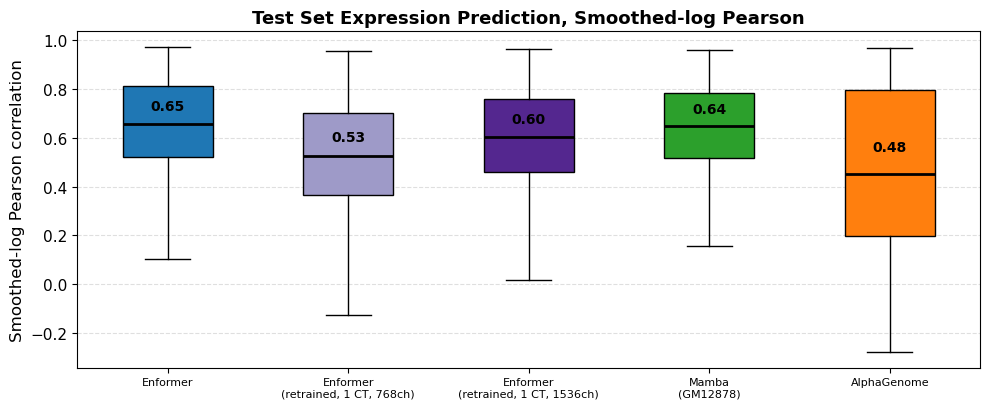

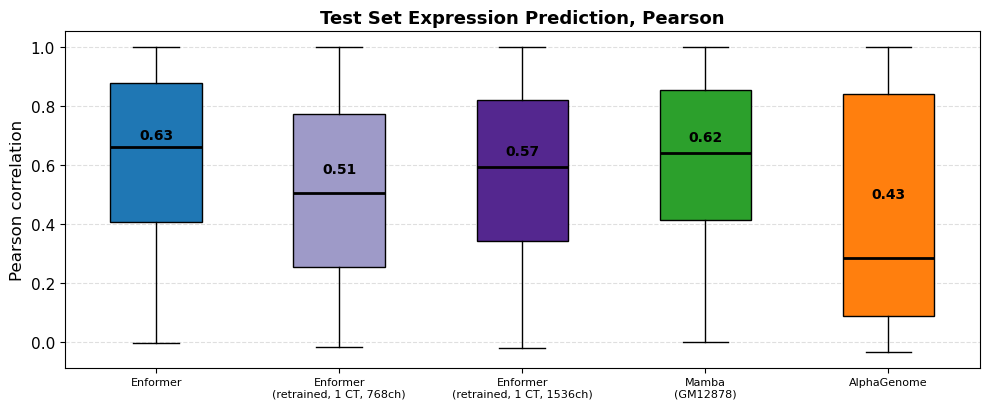

In [13]:
# §9 - per-region scores for every model, both metrics, then the boxplots.
BOX_KEYS = list(ALL_KEYS)

box_smooth, box_plain = {}, {}
for k in BOX_KEYS:
    arr = preds[k]
    assert arr.shape == t1.shape, f'{k} shape {arr.shape} vs target {t1.shape}'
    box_smooth[k] = np.array([smoothed_log_pearson(arr[i], t1[i])
                              for i in tqdm(range(arr.shape[0]), desc=PRETTY[k])])
    box_plain[k] = np.array([raw_pearson(arr[i], t1[i]) for i in range(arr.shape[0])])

print(f"\n{'model':<36}{'mean smooth':>13}{'median':>9}{'mean plain':>12}{'median':>9}{'nan':>6}")
for k in BOX_KEYS:
    s, pl = box_smooth[k], box_plain[k]
    print(f'{PRETTY[k]:<36}{np.nanmean(s):>13.3f}{np.nanmedian(s):>9.3f}'
          f'{np.nanmean(pl):>12.3f}{np.nanmedian(pl):>9.3f}{int(np.isnan(s).sum()):>6}')

# head-to-head between the two 1-CT widths
a, b = 'enformer_n1', 'enformer_n1_1536'
for res, meth in [(box_smooth, 'smoothed-log'), (box_plain, 'plain')]:
    m = ~np.isnan(res[a]) & ~np.isnan(res[b])
    d = res[b][m] - res[a][m]
    print(f'{meth:>14}: 1536ch beats 768ch in {float((d > 0).mean()):.1%} of regions, '
          f'mean d {d.mean():+.4f}, median d {np.median(d):+.4f}')

for res, meth in [(box_smooth, 'Smoothed-log Pearson'), (box_plain, 'Pearson')]:
    data = [res[k][~np.isnan(res[k])] for k in BOX_KEYS]
    plt.figure(figsize=(10, 4.2))
    box = plt.boxplot(data, labels=[PRETTY[k].replace(' (', '\n(') for k in BOX_KEYS],
                      showfliers=False, patch_artist=True, boxprops=dict(edgecolor='black'),
                      medianprops=dict(color='black', linewidth=2),
                      whiskerprops=dict(color='black'), capprops=dict(color='black'))
    for patch, k in zip(box['boxes'], BOX_KEYS):
        patch.set_facecolor(COLORS[k])
    for i, vals in enumerate(data):
        plt.text(i + 1, np.mean(vals) + 0.05, f'{np.mean(vals):.2f}', ha='center', va='bottom',
                 fontsize=10, fontweight='bold')
    plt.ylabel(f'{meth} correlation', fontsize=12)
    plt.title(f'Test Set Expression Prediction, {meth}', fontsize=13, weight='bold')
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=11)
    plt.grid(axis='y', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

## 10. = §4 — element-wise comparison vs Enformer

One panel per model: its per-region correlation against the original Enformer's. Points above the
dashed `y = x` are regions where that model wins; the title gives the win rate and the mean delta.
The final row adds the direct 768ch-vs-1536ch panel, which is the comparison this section is for.

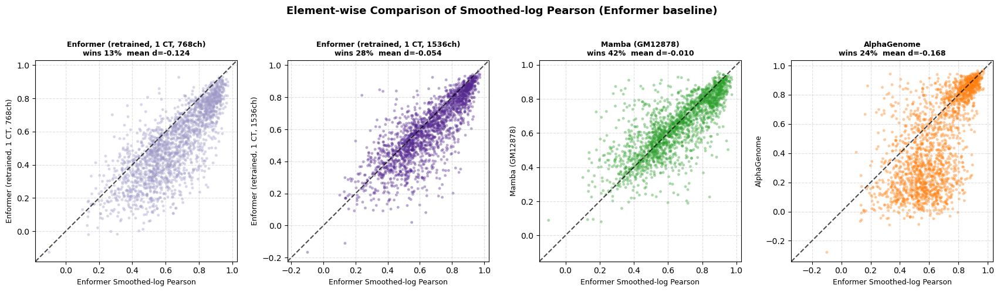

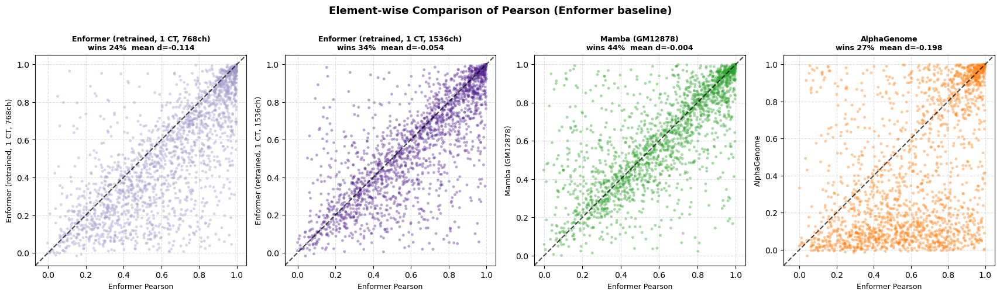

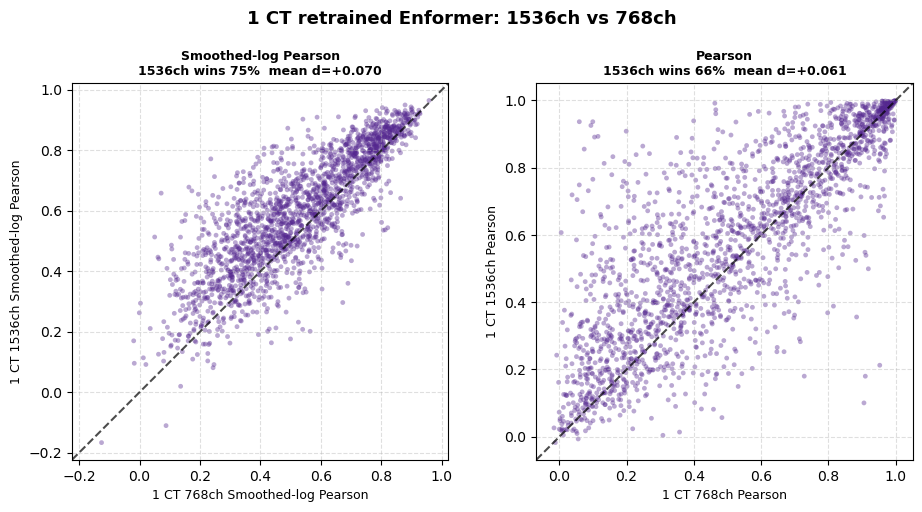

In [14]:
# §10 - per-region scatter against the original Enformer, both metrics.
CMP_KEYS = RETRAIN_KEYS + [mamba_key, ag_key]

for res, meth in [(box_smooth, 'Smoothed-log Pearson'), (box_plain, 'Pearson')]:
    base = res[enformer_key]
    fig, axes = plt.subplots(1, len(CMP_KEYS), figsize=(4.3 * len(CMP_KEYS), 4.8))
    for ax, k in zip(np.atleast_1d(axes), CMP_KEYS):
        comp = res[k]
        m = ~np.isnan(base) & ~np.isnan(comp)
        xb, yb = base[m], comp[m]
        ax.scatter(xb, yb, color=COLORS[k], alpha=0.4, s=12, edgecolor='none')
        lo, hi = min(xb.min(), yb.min()), max(xb.max(), yb.max())
        buf = (hi - lo) * 0.05
        ax.plot([lo - buf, hi + buf], [lo - buf, hi + buf], color='black', ls='--', alpha=0.7)
        ax.set_xlabel(f'Enformer {meth}', fontsize=9)
        ax.set_ylabel(f'{PRETTY[k]}', fontsize=9)
        ax.set_title(f'{PRETTY[k]}\nwins {float((yb > xb).mean()):.0%}  '
                     f'mean d={np.mean(yb - xb):+.3f}', fontsize=9, weight='bold')
        ax.set_box_aspect(1)
        ax.set_xlim(lo - buf, hi + buf)
        ax.set_ylim(lo - buf, hi + buf)
        ax.grid(ls='--', alpha=0.4)
    plt.suptitle(f'Element-wise Comparison of {meth} (Enformer baseline)', fontsize=13,
                 weight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

# --- 768ch vs 1536ch head to head, x = the narrower model ---------------------------
fig, axes = plt.subplots(1, 2, figsize=(9.5, 4.8))
for ax, (res, meth) in zip(axes, [(box_smooth, 'Smoothed-log Pearson'), (box_plain, 'Pearson')]):
    xb_, yb_ = res['enformer_n1'], res['enformer_n1_1536']
    m = ~np.isnan(xb_) & ~np.isnan(yb_)
    xb, yb = xb_[m], yb_[m]
    ax.scatter(xb, yb, color=COLORS['enformer_n1_1536'], alpha=0.4, s=12, edgecolor='none')
    lo, hi = min(xb.min(), yb.min()), max(xb.max(), yb.max())
    buf = (hi - lo) * 0.05
    ax.plot([lo - buf, hi + buf], [lo - buf, hi + buf], color='black', ls='--', alpha=0.7)
    ax.set_xlabel(f'1 CT 768ch {meth}', fontsize=9)
    ax.set_ylabel(f'1 CT 1536ch {meth}', fontsize=9)
    ax.set_title(f'{meth}\n1536ch wins {float((yb > xb).mean()):.0%}  '
                 f'mean d={np.mean(yb - xb):+.3f}', fontsize=9, weight='bold')
    ax.set_box_aspect(1)
    ax.set_xlim(lo - buf, hi + buf)
    ax.set_ylim(lo - buf, hi + buf)
    ax.grid(ls='--', alpha=0.4)
plt.suptitle('1 CT retrained Enformer: 1536ch vs 768ch', fontsize=13, weight='bold', y=1.02)
plt.tight_layout()
plt.show()

## 11. = §5 — the rule scan and the worst regions

Rule, per bin: `AVG > 2*TRUE` **and** `AVG >= p95(AVG)` **and** `TRUE < p95(TRUE)`, with percentiles
global over all allowed test bins. A rule bin is broadly transcribed but quiet in GM12878. The scan
is model-independent, so the same 5 worst regions are used; only the track stack changes.

In [15]:
# §11a - the rule, global thresholds, and the 5 worst regions.
THR_A = float(np.percentile(AVG_ALL[allowed], 95))
THR_T = float(np.percentile(TRUE_ALL[allowed], 95))
C1 = AVG_ALL > 2 * TRUE_ALL
C2 = AVG_ALL >= THR_A
C3 = TRUE_ALL < THR_T
RULE = C1 & C2 & C3
RULE_PREV = float(RULE[allowed].mean())
rule_count = np.where(allowed, RULE.sum(axis=1), -1)
print(f'global p95: avg {THR_A:.4f}  true {THR_T:.4f};  rule prevalence {RULE_PREV:.2%}')
print(f'rule bins per allowed region: mean {RULE[allowed].sum(axis=1).mean():.1f}, '
      f'median {np.median(RULE[allowed].sum(axis=1)):.0f}, max {rule_count.max()}')

WORST = np.argsort(rule_count)[-5:][::-1]
for r, i in enumerate(WORST):
    chrom, start, end = region_coords(i)
    print(f'  {r+1}. idx {i:>4}  {chrom}:{start:,}-{end:,}  {RULE[i].sum():>3} rule bins')

global p95: avg 0.2450  true 1.0312;  rule prevalence 1.33%
rule bins per allowed region: mean 11.9, median 4, max 205
  1. idx 1758  chr14:100,819,717-100,934,405  205 rule bins
  2. idx 1447  chr11:35,197,431-35,312,119  197 rule bins
  3. idx 1384  chr15:25,005,401-25,120,089  159 rule bins
  4. idx 1900  chr11:35,082,742-35,197,430  151 rule bins
  5. idx 1576  chr3:188,870,350-188,985,038  136 rule bins


DNase = labels.zarr track 12 (DNASE:GM12878) (1937, 896), mean 0.1050


rank 1 (idx 1758)  Enformer 4%  AlphaGenome 20%  Enformer (retrained, 1 CT, 768ch) 6%  Enformer (retrained, 1 CT, 1536ch) 4%  Mamba (GM12878) 3%


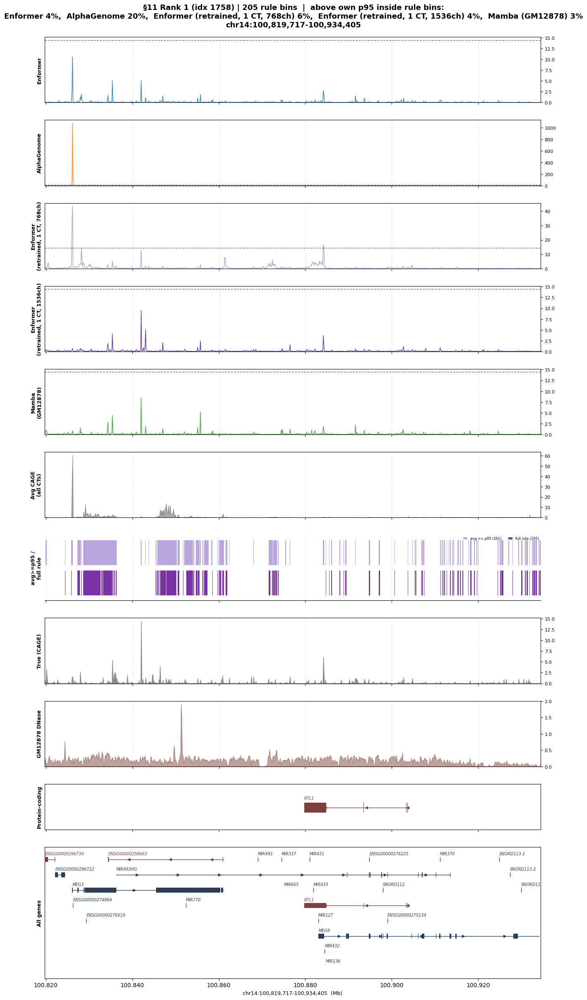

rank 2 (idx 1447)  Enformer 9%  AlphaGenome 12%  Enformer (retrained, 1 CT, 768ch) 7%  Enformer (retrained, 1 CT, 1536ch) 6%  Mamba (GM12878) 6%


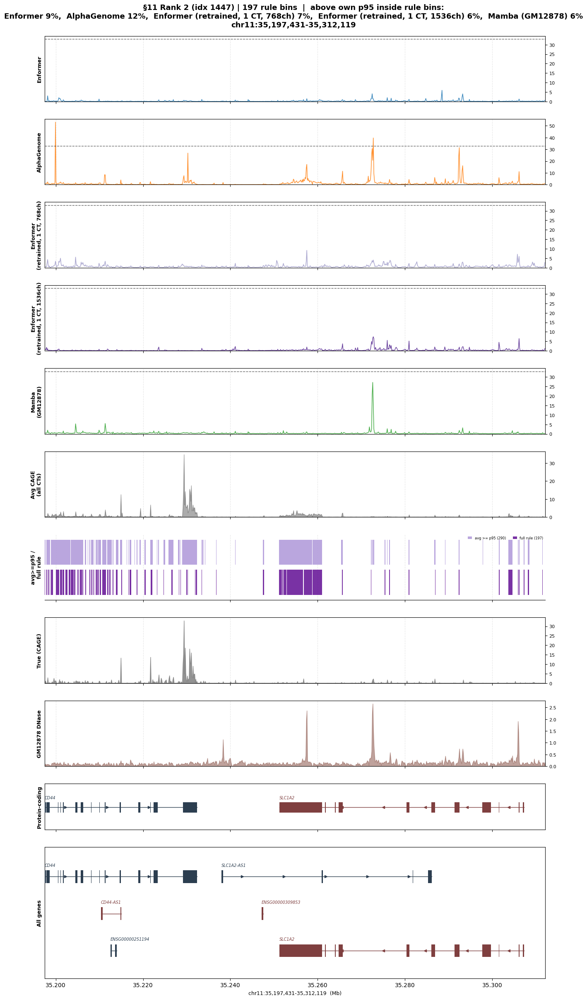

rank 3 (idx 1384)  Enformer 10%  AlphaGenome 11%  Enformer (retrained, 1 CT, 768ch) 5%  Enformer (retrained, 1 CT, 1536ch) 7%  Mamba (GM12878) 6%


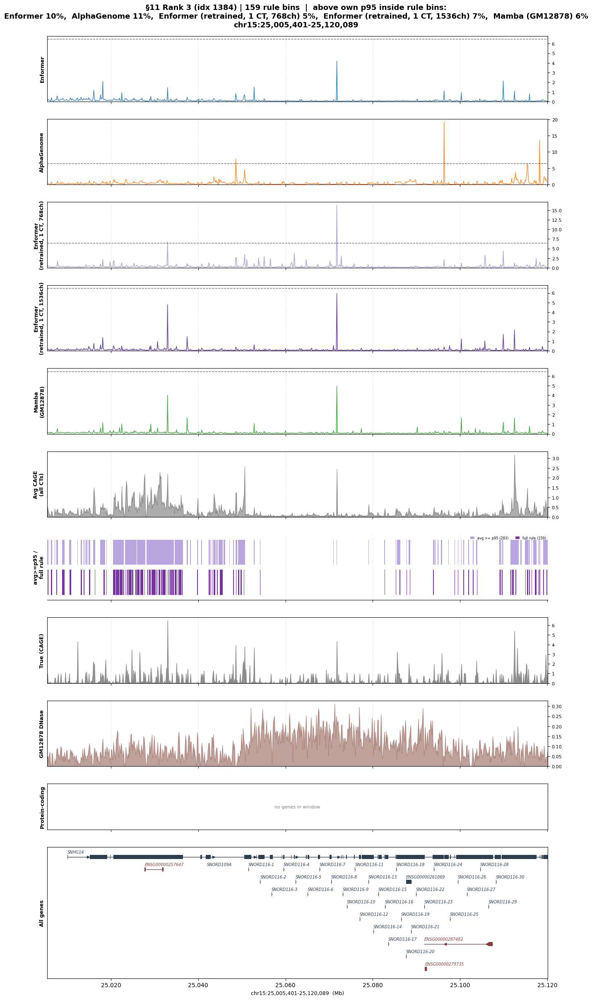

rank 4 (idx 1900)  Enformer 3%  AlphaGenome 3%  Enformer (retrained, 1 CT, 768ch) 4%  Enformer (retrained, 1 CT, 1536ch) 5%  Mamba (GM12878) 3%


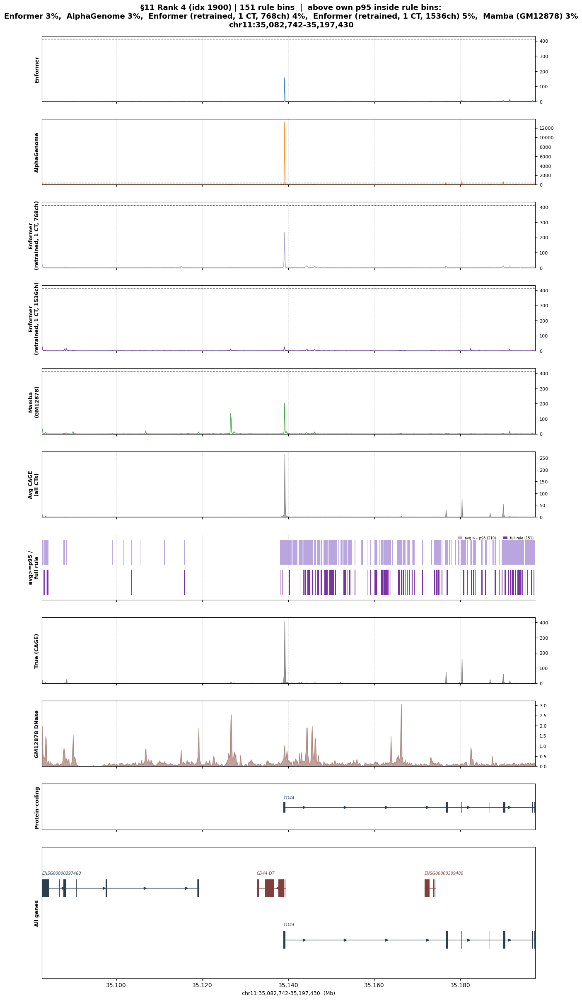

rank 5 (idx 1576)  Enformer 6%  AlphaGenome 29%  Enformer (retrained, 1 CT, 768ch) 18%  Enformer (retrained, 1 CT, 1536ch) 10%  Mamba (GM12878) 5%


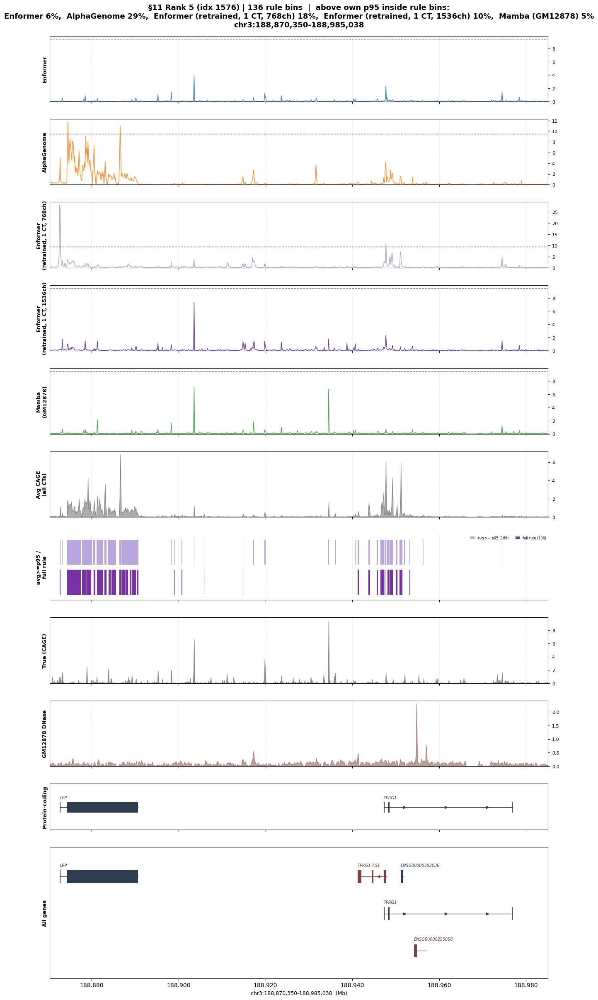

In [16]:
# §11b - track plots for the 5 worst regions with all five models.
from matplotlib.patches import Rectangle

RULE_COLOR, C2_COLOR = '#6a1b9a', '#b39ddb'

# --- observed GM12878 DNase, for the bottom track ---------------------------------
# labels.zarr track 12 is DNASE:GM12878 on this exact 128 bp grid -- the same grid, the
# same rows and the same crop as the CAGE target, so there is no resampling and no
# alignment question to answer. Sliced out once and cached beside the CAGE slice,
# following the pattern §8a uses for track 5110.
DNASE_TRACK = 12
DNASE_CACHE = f'{MODEL_OUT}/enformer_test_track{DNASE_TRACK}.npy'
if os.path.exists(DNASE_CACHE):
    DNASE = np.load(DNASE_CACHE)
else:
    DNASE = np.asarray(zarr.open(LABELS_ZARR, mode='r')['test'][:, :, DNASE_TRACK],
                       dtype=np.float32)
    np.save(DNASE_CACHE, DNASE)
_tg = pd.read_csv('/data1/lesliec/sarthak/data/enformer/data/targets.txt', sep='\t')
_desc = _tg.set_index('index').loc[DNASE_TRACK, 'description']
assert _desc == 'DNASE:GM12878', f'track {DNASE_TRACK} is {_desc!r}, not DNASE:GM12878'
assert DNASE.shape == TRUE_ALL.shape, f'DNase {DNASE.shape} vs target {TRUE_ALL.shape}'
assert not np.array_equal(DNASE, TRUE_ALL), 'the DNase slice IS the CAGE target'
DNASE_COLOR = '#8c564b'          # no model wears brown
print(f'DNase = labels.zarr track {DNASE_TRACK} ({_desc}) {DNASE.shape}, '
      f'mean {DNASE.mean():.4f}')

# Track stack order for these panels, which is NOT the ALL_KEYS order used elsewhere in
# the notebook: the base model, then AlphaGenome, then the retrained Enformers, then the
# Mamba arm -- so each panel reads outward from stock Enformer. Only the panels below use
# it; every other section keeps ALL_KEYS.
TRACK_ORDER = [enformer_key, ag_key] + RETRAIN_KEYS + [mamba_key]
assert sorted(TRACK_ORDER) == sorted(ALL_KEYS), 'TRACK_ORDER must be a permutation of ALL_KEYS'




def bins_to_intervals(mask):
    d = np.diff(np.concatenate(([0], mask.astype(np.int8), [0])))
    return list(zip(np.flatnonzero(d == 1).tolist(), np.flatnonzero(d == -1).tolist()))


def draw_rule_track(ax, idx, xlim):
    """Upper band = avg >= p95, lower band = full rule. Own axis, so no other track is tinted."""
    ax.set_xlim(xlim)
    ax.set_ylim(0, 1)
    ax.set_yticks([])
    ax.set_ylabel('avg>=p95 /\nfull rule', fontsize=9, weight='bold')
    ax.grid(axis='x', linestyle='--', alpha=0.3)
    for side in ('left', 'right', 'top'):
        ax.spines[side].set_visible(False)
    out = None
    for mask, color, y0 in [(C2[idx], C2_COLOR, 0.54), (RULE[idx], RULE_COLOR, 0.08)]:
        iv = bins_to_intervals(mask)
        if color == RULE_COLOR:
            out = iv
        for b0, b1 in iv:
            ax.add_patch(Rectangle((xlim[0] + b0 * BIN, y0), (b1 - b0) * BIN, 0.38,
                                   facecolor=color, edgecolor='none', alpha=0.9, zorder=3))
    ax.legend(handles=[Rectangle((0, 0), 1, 1, facecolor=C2_COLOR, alpha=0.9),
                       Rectangle((0, 0), 1, 1, facecolor=RULE_COLOR, alpha=0.9)],
              labels=[f'avg >= p95 ({C2[idx].sum()})', f'full rule ({RULE[idx].sum()})'],
              fontsize=6, loc='upper right', frameon=False, ncol=2, handlelength=1.2,
              borderaxespad=0.1)
    return out


for rank, idx in enumerate(WORST):
    chrom, start, end = region_coords(idx)
    common = dict(chrom=chrom, start=start, bin_size=BIN)
    # the ylabel is rotated, so 'Enformer (retrained, 16 CT)' needs ~2.3in of axis
    # height and gets ~1.9in; wrapping at the parenthesis halves what it needs.
    tracks = [Track(np.asarray(preds[k][idx]), name=PRETTY[k].replace(' (', '\n('),
                    color=COLORS[k], **common) for k in TRACK_ORDER]
    tracks.append(Track(AVG_ALL[idx], name='Avg CAGE\n(all CTs)', color='#111111', style='fill',
                        alpha=0.35, reference_exempt=True, **common))
    rule_slot = len(tracks)
    tracks.append(Track(np.zeros(896), name='rule', color=RULE_COLOR, style='fill', alpha=0.0,
                        reference_exempt=True, **common))
    truth = Track(np.asarray(t1[idx]), name='True (CAGE)', is_truth=True, **common)
    # DNase goes BELOW the truth axis, next to the gene models: a different assay in
    # different units, so it is reference_exempt and is not read as another prediction.
    dnase = Track(DNASE[idx], name='GM12878 DNase', color=DNASE_COLOR, style='fill',
                  alpha=0.55, reference_exempt=True, **common)

    m = RULE[idx]
    frac = {k: (np.asarray(preds[k][idx])[m]
                >= np.percentile(np.asarray(preds[k][idx]), 95)).mean() for k in TRACK_ORDER}
    title = (f'§11 Rank {rank+1} (idx {idx}) | {RULE[idx].sum()} rule bins  |  '
             f'above own p95 inside rule bins:\n'
             + ',  '.join(f'{PRETTY[k]} {frac[k]:.0%}' for k in TRACK_ORDER)
             + f'\n{chrom}:{start:,}-{end:,}')
    fig, axes = plot_tracks(tracks, genes=GENE_TRACKS, region=(chrom, start, end), ground_truth=truth,
                            bottom_tracks=[dnase], collapse_genes=True, title=title,
                            gene_track_ratio=(0.7, 2.0),
                            figsize=(13, 1.85 * (len(tracks) + 3) + 5.7))
    draw_rule_track(axes[rule_slot], idx, (start, end))
    print(f'rank {rank+1} (idx {idx})  ' + '  '.join(f'{PRETTY[k]} {frac[k]:.0%}' for k in TRACK_ORDER))
    plt.show()

## 12. = §6 — the four specificity metrics

`gap = R(pred, AVG) - R(pred, TRUE)` (positive = looks generic), magnitude over-prediction
`log2((pred+1)/(true+1))`, `precision@k` with `k` = the number of true peak bins, and the fraction of
each model's *false* top-k bins that are rule bins (against the ~1.3% prevalence).

In [17]:
# §12a - per-region metrics for all five models.
cols = ['R_true', 'R_avg', 'gap', 'prec_at_k', 'log2_topk', 'log2_summit', 'fp_in_rule']
K_MIN = 3
eligible = np.flatnonzero(allowed & ((TRUE_ALL >= THR_T).sum(axis=1) >= K_MIN))
RC_ELIG = RULE.sum(axis=1)[eligible]
print(f'{len(eligible)} of {allowed.sum()} allowed regions have >= {K_MIN} true peak bins')

met = {}
for key in ALL_KEYS:
    met[key] = {c: np.full(len(eligible), np.nan) for c in cols}
    for row, i in enumerate(tqdm(eligible, desc=f'metrics {PRETTY[key]}')):
        tr, av, ru = TRUE_ALL[i], AVG_ALL[i], RULE[i]
        pos = tr >= THR_T
        k = int(pos.sum())
        pr = np.asarray(preds[key][i], dtype=np.float64)
        topk = np.argsort(pr)[-k:]
        fp = topk[~pos[topk]]
        m = met[key]
        m['R_true'][row] = smoothed_log_pearson(pr, tr)
        m['R_avg'][row] = smoothed_log_pearson(pr, av)
        m['gap'][row] = m['R_avg'][row] - m['R_true'][row]
        m['prec_at_k'][row] = pos[topk].mean()
        m['log2_topk'][row] = np.median(np.log2((pr[topk] + 1) / (tr[topk] + 1)))
        j = int(np.argmax(pr))
        m['log2_summit'][row] = np.log2((pr[j] + 1) / (tr[j] + 1))
        if len(fp):
            m['fp_in_rule'][row] = ru[fp].mean()

MARK_IDX = int(WORST[0])
mark_row = int(np.flatnonzero(eligible == MARK_IDX)[0])

print(f"\n{'model':<36}{'R_true':>8}{'R_avg':>8}{'gap':>8}{'prec@k':>8}"
      f"{'log2_topk':>10}{'log2_sum':>9}{'FPinRule':>9}{'enrich':>8}")
for key in ALL_KEYS:
    m = met[key]
    fr = np.nanmedian(m['fp_in_rule'])
    print(f'{PRETTY[key]:<36}' + ''.join(f'{np.nanmedian(m[c]):>8.3f}' for c in cols[:4])
          + f"{np.nanmedian(m['log2_topk']):>10.2f}{np.nanmedian(m['log2_summit']):>9.2f}"
          + f'{fr:>9.3f}{fr / RULE_PREV:>7.1f}x')

print('\ngap vs rule-bin count:')
for key in ALL_KEYS:
    g_ = met[key]['gap']
    ok = ~np.isnan(g_)
    rho, pv = spearmanr(RC_ELIG[ok], g_[ok])
    print(f'  {PRETTY[key]:<36} Spearman rho {rho:>+.3f} (p {pv:.1e})   '
          f'median gap {np.median(g_[ok]):>+.3f}')

STRATA = [(0, 0), (1, 4), (5, 19), (20, 49), (50, 10 ** 9)]
STRATA_LAB = ['0', '1-4', '5-19', '20-49', '50+']
strat = {key: {c: [] for c in ['gap', 'prec_at_k', 'log2_summit']} for key in ALL_KEYS}
for lo, hi in STRATA:
    sel = (RC_ELIG >= lo) & (RC_ELIG <= hi)
    for key in ALL_KEYS:
        for c in ['gap', 'prec_at_k', 'log2_summit']:
            strat[key][c].append(np.nanmedian(met[key][c][sel]))
for c, lab in [('gap', 'median gap = R_avg - R_true'), ('prec_at_k', 'median precision@k'),
               ('log2_summit', 'median log2 excess at summit')]:
    print(f'\n{lab}  (columns = rule bins per region)')
    print(f"{'':<36}" + ''.join(f'{s:>10}' for s in STRATA_LAB))
    for key in ALL_KEYS:
        print(f'{PRETTY[key]:<36}' + ''.join(f'{v:>+10.3f}' for v in strat[key][c]))

print(f'\nidx {MARK_IDX}:')
for key in ALL_KEYS:
    m = met[key]
    print(f'  {PRETTY[key]:<36} R_true {m["R_true"][mark_row]:>6.3f}  '
          f'R_avg {m["R_avg"][mark_row]:>6.3f}  gap {m["gap"][mark_row]:>+6.3f}  '
          f'prec@k {m["prec_at_k"][mark_row]:>5.2f}  log2summit {m["log2_summit"][mark_row]:>+6.2f}')

1880 of 1883 allowed regions have >= 3 true peak bins


metrics Enformer:   0%|          | 0/1880 [00:00<?, ?it/s]

metrics Enformer:   3%|▎         | 64/1880 [00:00<00:02, 632.32it/s]

metrics Enformer:   7%|▋         | 128/1880 [00:00<00:02, 634.22it/s]

metrics Enformer:  10%|█         | 192/1880 [00:00<00:02, 629.67it/s]

metrics Enformer:  14%|█▎        | 256/1880 [00:00<00:02, 631.39it/s]

metrics Enformer:  17%|█▋        | 321/1880 [00:00<00:02, 635.87it/s]

metrics Enformer:  21%|██        | 386/1880 [00:00<00:02, 640.02it/s]

metrics Enformer:  24%|██▍       | 451/1880 [00:00<00:02, 642.82it/s]

metrics Enformer:  27%|██▋       | 516/1880 [00:00<00:02, 643.63it/s]

metrics Enformer:  31%|███       | 581/1880 [00:00<00:02, 643.10it/s]

metrics Enformer:  34%|███▍      | 646/1880 [00:01<00:01, 641.70it/s]

metrics Enformer:  38%|███▊      | 711/1880 [00:01<00:01, 641.86it/s]

metrics Enformer:  41%|████▏     | 776/1880 [00:01<00:01, 643.20it/s]

metrics Enformer:  45%|████▍     | 841/1880 [00:01<00:01, 636.14it/s]

metrics Enformer:  48%|████▊     | 906/1880 [00:01<00:01, 638.60it/s]

metrics Enformer:  52%|█████▏    | 970/1880 [00:01<00:01, 636.02it/s]

metrics Enformer:  55%|█████▌    | 1034/1880 [00:01<00:01, 635.44it/s]

metrics Enformer:  58%|█████▊    | 1098/1880 [00:01<00:01, 634.26it/s]

metrics Enformer:  62%|██████▏   | 1162/1880 [00:01<00:01, 634.79it/s]

metrics Enformer:  65%|██████▌   | 1226/1880 [00:01<00:01, 634.44it/s]

metrics Enformer:  69%|██████▊   | 1290/1880 [00:02<00:00, 634.09it/s]

metrics Enformer:  72%|███████▏  | 1355/1880 [00:02<00:00, 636.04it/s]

metrics Enformer:  75%|███████▌  | 1419/1880 [00:02<00:00, 636.04it/s]

metrics Enformer:  79%|███████▉  | 1484/1880 [00:02<00:00, 637.91it/s]

metrics Enformer:  82%|████████▏ | 1548/1880 [00:02<00:00, 638.25it/s]

metrics Enformer:  86%|████████▌ | 1613/1880 [00:02<00:00, 640.84it/s]

metrics Enformer:  89%|████████▉ | 1678/1880 [00:02<00:00, 640.47it/s]

metrics Enformer:  93%|█████████▎| 1743/1880 [00:02<00:00, 640.93it/s]

metrics Enformer:  96%|█████████▌| 1808/1880 [00:02<00:00, 634.42it/s]

metrics Enformer: 100%|█████████▉| 1872/1880 [00:02<00:00, 633.95it/s]

metrics Enformer: 100%|██████████| 1880/1880 [00:02<00:00, 636.97it/s]

metrics Enformer (retrained, 1 CT, 768ch):   0%|          | 0/1880 [00:00<?, ?it/s]

metrics Enformer (retrained, 1 CT, 768ch):   3%|▎         | 65/1880 [00:00<00:02, 646.20it/s]

metrics Enformer (retrained, 1 CT, 768ch):   7%|▋         | 130/1880 [00:00<00:02, 644.28it/s]

metrics Enformer (retrained, 1 CT, 768ch):  10%|█         | 195/1880 [00:00<00:02, 644.88it/s]

metrics Enformer (retrained, 1 CT, 768ch):  14%|█▍        | 260/1880 [00:00<00:02, 644.11it/s]

metrics Enformer (retrained, 1 CT, 768ch):  17%|█▋        | 325/1880 [00:00<00:02, 644.76it/s]

metrics Enformer (retrained, 1 CT, 768ch):  21%|██        | 390/1880 [00:00<00:02, 646.44it/s]

metrics Enformer (retrained, 1 CT, 768ch):  24%|██▍       | 455/1880 [00:00<00:02, 645.97it/s]

metrics Enformer (retrained, 1 CT, 768ch):  28%|██▊       | 520/1880 [00:00<00:02, 644.94it/s]

metrics Enformer (retrained, 1 CT, 768ch):  31%|███       | 585/1880 [00:00<00:02, 644.95it/s]

metrics Enformer (retrained, 1 CT, 768ch):  35%|███▍      | 650/1880 [00:01<00:01, 644.70it/s]

metrics Enformer (retrained, 1 CT, 768ch):  38%|███▊      | 715/1880 [00:01<00:01, 643.45it/s]

metrics Enformer (retrained, 1 CT, 768ch):  41%|████▏     | 780/1880 [00:01<00:01, 643.63it/s]

metrics Enformer (retrained, 1 CT, 768ch):  45%|████▍     | 845/1880 [00:01<00:01, 641.21it/s]

metrics Enformer (retrained, 1 CT, 768ch):  48%|████▊     | 910/1880 [00:01<00:01, 641.34it/s]

metrics Enformer (retrained, 1 CT, 768ch):  52%|█████▏    | 975/1880 [00:01<00:01, 637.00it/s]

metrics Enformer (retrained, 1 CT, 768ch):  55%|█████▌    | 1040/1880 [00:01<00:01, 640.30it/s]

metrics Enformer (retrained, 1 CT, 768ch):  59%|█████▉    | 1106/1880 [00:01<00:01, 643.37it/s]

metrics Enformer (retrained, 1 CT, 768ch):  62%|██████▏   | 1171/1880 [00:01<00:01, 636.37it/s]

metrics Enformer (retrained, 1 CT, 768ch):  66%|██████▌   | 1236/1880 [00:01<00:01, 638.53it/s]

metrics Enformer (retrained, 1 CT, 768ch):  69%|██████▉   | 1301/1880 [00:02<00:00, 640.39it/s]

metrics Enformer (retrained, 1 CT, 768ch):  73%|███████▎  | 1366/1880 [00:02<00:00, 629.73it/s]

metrics Enformer (retrained, 1 CT, 768ch):  76%|███████▌  | 1431/1880 [00:02<00:00, 635.04it/s]

metrics Enformer (retrained, 1 CT, 768ch):  80%|███████▉  | 1495/1880 [00:02<00:00, 630.37it/s]

metrics Enformer (retrained, 1 CT, 768ch):  83%|████████▎ | 1559/1880 [00:02<00:00, 631.79it/s]

metrics Enformer (retrained, 1 CT, 768ch):  86%|████████▋ | 1624/1880 [00:02<00:00, 634.75it/s]

metrics Enformer (retrained, 1 CT, 768ch):  90%|████████▉ | 1688/1880 [00:02<00:00, 633.43it/s]

metrics Enformer (retrained, 1 CT, 768ch):  93%|█████████▎| 1753/1880 [00:02<00:00, 632.40it/s]

metrics Enformer (retrained, 1 CT, 768ch):  97%|█████████▋| 1817/1880 [00:02<00:00, 632.27it/s]

metrics Enformer (retrained, 1 CT, 768ch): 100%|██████████| 1880/1880 [00:02<00:00, 638.82it/s]

metrics Enformer (retrained, 1 CT, 1536ch):   0%|          | 0/1880 [00:00<?, ?it/s]

metrics Enformer (retrained, 1 CT, 1536ch):   3%|▎         | 64/1880 [00:00<00:02, 639.16it/s]

metrics Enformer (retrained, 1 CT, 1536ch):   7%|▋         | 128/1880 [00:00<00:02, 639.23it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  10%|█         | 193/1880 [00:00<00:02, 642.09it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  14%|█▎        | 258/1880 [00:00<00:02, 642.66it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  17%|█▋        | 323/1880 [00:00<00:02, 638.94it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  21%|██        | 388/1880 [00:00<00:02, 641.40it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  24%|██▍       | 453/1880 [00:00<00:02, 639.89it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  28%|██▊       | 517/1880 [00:00<00:02, 639.77it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  31%|███       | 581/1880 [00:00<00:02, 637.07it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  34%|███▍      | 645/1880 [00:01<00:01, 633.97it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  38%|███▊      | 709/1880 [00:01<00:01, 629.99it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  41%|████      | 774/1880 [00:01<00:01, 634.02it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  45%|████▍     | 840/1880 [00:01<00:01, 639.87it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  48%|████▊     | 906/1880 [00:01<00:01, 643.23it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  52%|█████▏    | 971/1880 [00:01<00:01, 644.77it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  55%|█████▌    | 1036/1880 [00:01<00:01, 641.74it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  59%|█████▊    | 1101/1880 [00:01<00:01, 641.29it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  62%|██████▏   | 1166/1880 [00:01<00:01, 640.29it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  65%|██████▌   | 1231/1880 [00:01<00:01, 640.78it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  69%|██████▉   | 1296/1880 [00:02<00:00, 641.98it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  72%|███████▏  | 1361/1880 [00:02<00:00, 625.22it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  76%|███████▌  | 1426/1880 [00:02<00:00, 631.33it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  79%|███████▉  | 1490/1880 [00:02<00:00, 606.45it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  83%|████████▎ | 1554/1880 [00:02<00:00, 614.79it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  86%|████████▌ | 1619/1880 [00:02<00:00, 622.94it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  90%|████████▉ | 1685/1880 [00:02<00:00, 631.05it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  93%|█████████▎| 1750/1880 [00:02<00:00, 636.58it/s]

metrics Enformer (retrained, 1 CT, 1536ch):  96%|█████████▋| 1814/1880 [00:02<00:00, 629.53it/s]

metrics Enformer (retrained, 1 CT, 1536ch): 100%|█████████▉| 1878/1880 [00:02<00:00, 632.33it/s]

metrics Enformer (retrained, 1 CT, 1536ch): 100%|██████████| 1880/1880 [00:02<00:00, 634.37it/s]

metrics Mamba (GM12878):   0%|          | 0/1880 [00:00<?, ?it/s]

metrics Mamba (GM12878):   3%|▎         | 64/1880 [00:00<00:02, 638.17it/s]

metrics Mamba (GM12878):   7%|▋         | 128/1880 [00:00<00:02, 636.91it/s]

metrics Mamba (GM12878):  10%|█         | 193/1880 [00:00<00:02, 640.04it/s]

metrics Mamba (GM12878):  14%|█▎        | 258/1880 [00:00<00:02, 634.35it/s]

metrics Mamba (GM12878):  17%|█▋        | 323/1880 [00:00<00:02, 636.76it/s]

metrics Mamba (GM12878):  21%|██        | 387/1880 [00:00<00:02, 631.84it/s]

metrics Mamba (GM12878):  24%|██▍       | 453/1880 [00:00<00:02, 638.42it/s]

metrics Mamba (GM12878):  28%|██▊       | 517/1880 [00:00<00:02, 637.38it/s]

metrics Mamba (GM12878):  31%|███       | 582/1880 [00:00<00:02, 640.24it/s]

metrics Mamba (GM12878):  34%|███▍      | 647/1880 [00:01<00:01, 642.33it/s]

metrics Mamba (GM12878):  38%|███▊      | 712/1880 [00:01<00:01, 643.47it/s]

metrics Mamba (GM12878):  41%|████▏     | 777/1880 [00:01<00:01, 643.69it/s]

metrics Mamba (GM12878):  45%|████▍     | 842/1880 [00:01<00:01, 642.46it/s]

metrics Mamba (GM12878):  48%|████▊     | 907/1880 [00:01<00:01, 642.89it/s]

metrics Mamba (GM12878):  52%|█████▏    | 972/1880 [00:01<00:01, 642.47it/s]

metrics Mamba (GM12878):  55%|█████▌    | 1037/1880 [00:01<00:01, 639.49it/s]

metrics Mamba (GM12878):  59%|█████▊    | 1101/1880 [00:01<00:01, 638.05it/s]

metrics Mamba (GM12878):  62%|██████▏   | 1166/1880 [00:01<00:01, 639.09it/s]

metrics Mamba (GM12878):  65%|██████▌   | 1231/1880 [00:01<00:01, 640.70it/s]

metrics Mamba (GM12878):  69%|██████▉   | 1296/1880 [00:02<00:00, 640.10it/s]

metrics Mamba (GM12878):  72%|███████▏  | 1361/1880 [00:02<00:00, 641.08it/s]

metrics Mamba (GM12878):  76%|███████▌  | 1426/1880 [00:02<00:00, 639.68it/s]

metrics Mamba (GM12878):  79%|███████▉  | 1490/1880 [00:02<00:00, 637.32it/s]

metrics Mamba (GM12878):  83%|████████▎ | 1554/1880 [00:02<00:00, 618.44it/s]

metrics Mamba (GM12878):  86%|████████▌ | 1616/1880 [00:02<00:00, 617.67it/s]

metrics Mamba (GM12878):  89%|████████▉ | 1679/1880 [00:02<00:00, 621.12it/s]

metrics Mamba (GM12878):  93%|█████████▎| 1742/1880 [00:02<00:00, 622.01it/s]

metrics Mamba (GM12878):  96%|█████████▌| 1806/1880 [00:02<00:00, 625.27it/s]

metrics Mamba (GM12878):  99%|█████████▉| 1869/1880 [00:02<00:00, 625.85it/s]

metrics Mamba (GM12878): 100%|██████████| 1880/1880 [00:02<00:00, 634.60it/s]

metrics AlphaGenome:   0%|          | 0/1880 [00:00<?, ?it/s]

metrics AlphaGenome:   3%|▎         | 64/1880 [00:00<00:02, 631.92it/s]

metrics AlphaGenome:   7%|▋         | 128/1880 [00:00<00:02, 624.49it/s]

metrics AlphaGenome:  10%|█         | 191/1880 [00:00<00:02, 622.28it/s]

metrics AlphaGenome:  14%|█▎        | 254/1880 [00:00<00:02, 624.11it/s]

metrics AlphaGenome:  17%|█▋        | 317/1880 [00:00<00:02, 625.07it/s]

metrics AlphaGenome:  20%|██        | 380/1880 [00:00<00:02, 626.61it/s]

metrics AlphaGenome:  24%|██▎       | 443/1880 [00:00<00:02, 627.62it/s]

metrics AlphaGenome:  27%|██▋       | 506/1880 [00:00<00:02, 626.23it/s]

metrics AlphaGenome:  30%|███       | 570/1880 [00:00<00:02, 628.39it/s]

metrics AlphaGenome:  34%|███▎      | 634/1880 [00:01<00:01, 631.66it/s]

metrics AlphaGenome:  37%|███▋      | 699/1880 [00:01<00:01, 634.39it/s]

metrics AlphaGenome:  41%|████      | 763/1880 [00:01<00:01, 629.66it/s]

metrics AlphaGenome:  44%|████▍     | 826/1880 [00:01<00:01, 624.02it/s]

metrics AlphaGenome:  47%|████▋     | 890/1880 [00:01<00:01, 626.75it/s]

metrics AlphaGenome:  51%|█████     | 953/1880 [00:01<00:01, 619.33it/s]

metrics AlphaGenome:  54%|█████▍    | 1016/1880 [00:01<00:01, 621.67it/s]

metrics AlphaGenome:  57%|█████▋    | 1079/1880 [00:01<00:01, 614.76it/s]

metrics AlphaGenome:  61%|██████    | 1141/1880 [00:01<00:01, 611.82it/s]

metrics AlphaGenome:  64%|██████▍   | 1203/1880 [00:01<00:01, 613.24it/s]

metrics AlphaGenome:  67%|██████▋   | 1265/1880 [00:02<00:00, 615.23it/s]

metrics AlphaGenome:  71%|███████   | 1327/1880 [00:02<00:00, 613.49it/s]

metrics AlphaGenome:  74%|███████▍  | 1389/1880 [00:02<00:00, 614.33it/s]

metrics AlphaGenome:  77%|███████▋  | 1451/1880 [00:02<00:00, 615.92it/s]

metrics AlphaGenome:  81%|████████  | 1514/1880 [00:02<00:00, 619.43it/s]

metrics AlphaGenome:  84%|████████▍ | 1577/1880 [00:02<00:00, 620.49it/s]

metrics AlphaGenome:  87%|████████▋ | 1640/1880 [00:02<00:00, 616.62it/s]

metrics AlphaGenome:  91%|█████████ | 1704/1880 [00:02<00:00, 622.86it/s]

metrics AlphaGenome:  94%|█████████▍| 1767/1880 [00:02<00:00, 620.86it/s]

metrics AlphaGenome:  97%|█████████▋| 1830/1880 [00:02<00:00, 623.14it/s]

metrics AlphaGenome: 100%|██████████| 1880/1880 [00:03<00:00, 621.51it/s]


model                                 R_true   R_avg     gap  prec@k log2_topk log2_sum FPinRule  enrich
Enformer                               0.659   0.797   0.088   0.444      0.28     0.25    0.083    6.3x
Enformer (retrained, 1 CT, 768ch)      0.527   0.675   0.091   0.357      1.14     1.19    0.071    5.4x
Enformer (retrained, 1 CT, 1536ch)     0.608   0.725   0.079   0.400      0.59     0.72    0.071    5.3x
Mamba (GM12878)                        0.652   0.724   0.051   0.429      0.48     0.57    0.043    3.3x
AlphaGenome                            0.459   0.646   0.079   0.244      1.43     2.94    0.110    8.2x

gap vs rule-bin count:
  Enformer                             Spearman rho -0.304 (p 1.6e-41)   median gap +0.088
  Enformer (retrained, 1 CT, 768ch)    Spearman rho -0.100 (p 1.4e-05)   median gap +0.091
  Enformer (retrained, 1 CT, 1536ch)   Spearman rho -0.222 (p 2.1e-22)   median gap +0.079
  Mamba (GM12878)                      Spearman rho -0.462 (p 8.3e-100) 

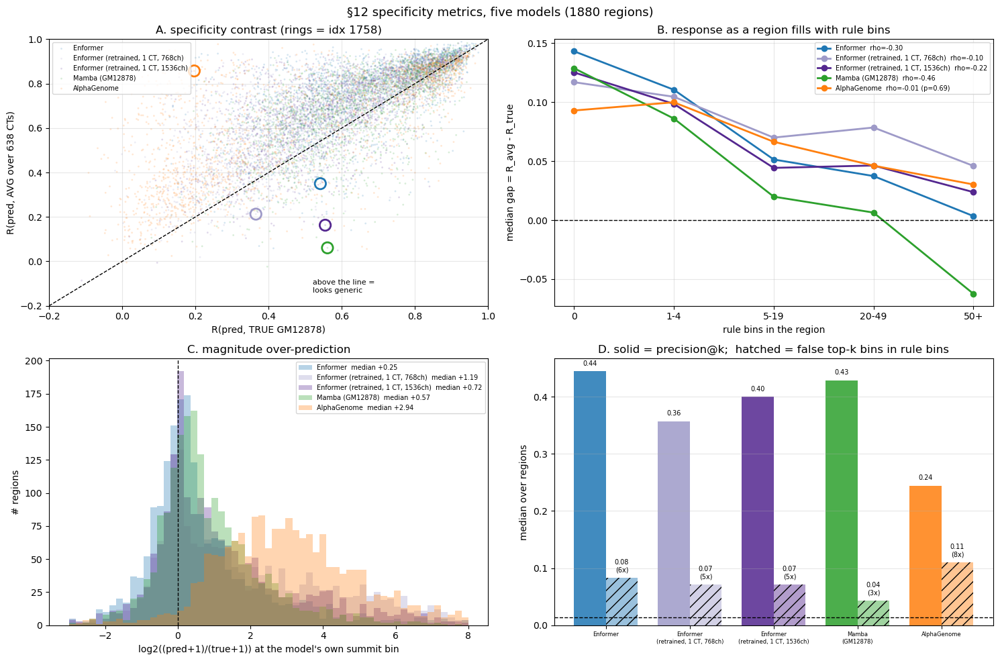

In [18]:
# §12b - the four-panel figure.
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

ax = axes[0, 0]
for key in ALL_KEYS:
    m = met[key]
    ax.scatter(m['R_true'], m['R_avg'], s=4, alpha=0.18, color=COLORS[key], label=PRETTY[key],
               edgecolors='none')
    ax.scatter(m['R_true'][mark_row], m['R_avg'][mark_row], s=140, facecolors='none',
               edgecolors=COLORS[key], linewidths=2, zorder=5)
ax.plot([-0.2, 1.0], [-0.2, 1.0], color='k', lw=1, ls='--')
ax.text(0.60, 0.05, 'above the line =\nlooks generic', fontsize=8, transform=ax.transAxes)
ax.set_xlim(-0.2, 1.0)
ax.set_ylim(-0.2, 1.0)
ax.set_xlabel('R(pred, TRUE GM12878)')
ax.set_ylabel('R(pred, AVG over 638 CTs)')
ax.set_title(f'A. specificity contrast (rings = idx {MARK_IDX})')
ax.legend(fontsize=7, loc='upper left')
ax.grid(alpha=0.3)

ax = axes[0, 1]
xs = np.arange(len(STRATA_LAB))
for key in ALL_KEYS:
    g_ = met[key]['gap']
    ok = ~np.isnan(g_)
    rho, pv = spearmanr(RC_ELIG[ok], g_[ok])
    ax.plot(xs, strat[key]['gap'], 'o-', color=COLORS[key], lw=2,
            label=f'{PRETTY[key]}  rho={rho:+.2f}' + ('' if pv < 0.01 else f' (p={pv:.2f})'))
ax.axhline(0, color='k', lw=1, ls='--')
ax.set_xticks(xs)
ax.set_xticklabels(STRATA_LAB)
ax.set_xlabel('rule bins in the region')
ax.set_ylabel('median gap = R_avg - R_true')
ax.set_title('B. response as a region fills with rule bins')
ax.legend(fontsize=7)
ax.grid(alpha=0.3)

ax = axes[1, 0]
bins = np.linspace(-3, 8, 60)
for key in ALL_KEYS:
    v = met[key]['log2_summit']
    ax.hist(v[~np.isnan(v)], bins=bins, color=COLORS[key], alpha=0.32, histtype='stepfilled',
            label=f'{PRETTY[key]}  median {np.nanmedian(v):+.2f}')
ax.axvline(0, color='k', lw=1, ls='--')
ax.set_xlabel("log2((pred+1)/(true+1)) at the model's own summit bin")
ax.set_ylabel('# regions')
ax.set_title('C. magnitude over-prediction')
ax.legend(fontsize=7)

ax = axes[1, 1]
w = 0.38
for j, key in enumerate(ALL_KEYS):
    pk = np.nanmedian(met[key]['prec_at_k'])
    fr = np.nanmedian(met[key]['fp_in_rule'])
    ax.bar(j - w / 2, pk, w, color=COLORS[key], alpha=0.85)
    ax.bar(j + w / 2, fr, w, color=COLORS[key], alpha=0.45, hatch='//')
    ax.text(j - w / 2, pk + 0.01, f'{pk:.2f}', ha='center', fontsize=7)
    ax.text(j + w / 2, fr + 0.01, f'{fr:.2f}\n({fr/RULE_PREV:.0f}x)', ha='center', fontsize=7)
ax.axhline(RULE_PREV, color='k', lw=1, ls='--')
ax.set_xticks(range(len(ALL_KEYS)))
ax.set_xticklabels([PRETTY[k].replace(' (', '\n(') for k in ALL_KEYS], fontsize=6)
ax.set_ylabel('median over regions')
ax.set_title('D. solid = precision@k;  hatched = false top-k bins in rule bins')
ax.grid(axis='y', alpha=0.3)

fig.suptitle(f'§12 specificity metrics, five models ({len(eligible)} regions)', fontsize=13)
fig.tight_layout()
plt.show()

## 13. = §7 — accuracy vs how generic the region is

x = `R(TRUE GM12878, AVG)` per region (model-independent): left = the target looks nothing like
generic expression, right = target and average nearly identical. y = `R(pred, TRUE)` then
`R(pred, AVG)`. Thick lines are running medians over 12 equal-count x-bins.

raw R Enformer:   0%|          | 0/1880 [00:00<?, ?it/s]

raw R Enformer:   5%|▍         | 87/1880 [00:00<00:02, 863.35it/s]

raw R Enformer:   9%|▉         | 174/1880 [00:00<00:02, 841.90it/s]

raw R Enformer:  14%|█▍        | 259/1880 [00:00<00:01, 828.44it/s]

raw R Enformer:  18%|█▊        | 345/1880 [00:00<00:01, 838.99it/s]

raw R Enformer:  23%|██▎       | 432/1880 [00:00<00:01, 846.45it/s]

raw R Enformer:  28%|██▊       | 518/1880 [00:00<00:01, 850.56it/s]

raw R Enformer:  32%|███▏      | 604/1880 [00:00<00:01, 852.72it/s]

raw R Enformer:  37%|███▋      | 690/1880 [00:00<00:01, 853.42it/s]

raw R Enformer:  41%|████▏     | 776/1880 [00:00<00:01, 854.67it/s]

raw R Enformer:  46%|████▌     | 862/1880 [00:01<00:01, 849.80it/s]

raw R Enformer:  50%|█████     | 947/1880 [00:01<00:01, 848.38it/s]

raw R Enformer:  55%|█████▍    | 1032/1880 [00:01<00:01, 847.17it/s]

raw R Enformer:  59%|█████▉    | 1118/1880 [00:01<00:00, 848.16it/s]

raw R Enformer:  64%|██████▍   | 1203/1880 [00:01<00:00, 847.29it/s]

raw R Enformer:  69%|██████▊   | 1288/1880 [00:01<00:00, 844.81it/s]

raw R Enformer:  73%|███████▎  | 1374/1880 [00:01<00:00, 846.74it/s]

raw R Enformer:  78%|███████▊  | 1459/1880 [00:01<00:00, 844.95it/s]

raw R Enformer:  82%|████████▏ | 1544/1880 [00:01<00:00, 845.42it/s]

raw R Enformer:  87%|████████▋ | 1630/1880 [00:01<00:00, 847.12it/s]

raw R Enformer:  91%|█████████ | 1715/1880 [00:02<00:00, 847.75it/s]

raw R Enformer:  96%|█████████▌| 1800/1880 [00:02<00:00, 848.24it/s]

raw R Enformer: 100%|██████████| 1880/1880 [00:02<00:00, 847.80it/s]

raw R Enformer (retrained, 1 CT, 768ch):   0%|          | 0/1880 [00:00<?, ?it/s]

raw R Enformer (retrained, 1 CT, 768ch):   5%|▍         | 87/1880 [00:00<00:02, 862.60it/s]

raw R Enformer (retrained, 1 CT, 768ch):   9%|▉         | 174/1880 [00:00<00:01, 858.26it/s]

raw R Enformer (retrained, 1 CT, 768ch):  14%|█▍        | 260/1880 [00:00<00:01, 850.42it/s]

raw R Enformer (retrained, 1 CT, 768ch):  18%|█▊        | 346/1880 [00:00<00:01, 850.24it/s]

raw R Enformer (retrained, 1 CT, 768ch):  23%|██▎       | 432/1880 [00:00<00:01, 849.85it/s]

raw R Enformer (retrained, 1 CT, 768ch):  28%|██▊       | 518/1880 [00:00<00:01, 850.02it/s]

raw R Enformer (retrained, 1 CT, 768ch):  32%|███▏      | 604/1880 [00:00<00:01, 849.73it/s]

raw R Enformer (retrained, 1 CT, 768ch):  37%|███▋      | 689/1880 [00:00<00:01, 847.57it/s]

raw R Enformer (retrained, 1 CT, 768ch):  41%|████      | 774/1880 [00:00<00:01, 844.93it/s]

raw R Enformer (retrained, 1 CT, 768ch):  46%|████▌     | 859/1880 [00:01<00:01, 845.79it/s]

raw R Enformer (retrained, 1 CT, 768ch):  50%|█████     | 944/1880 [00:01<00:01, 844.68it/s]

raw R Enformer (retrained, 1 CT, 768ch):  55%|█████▍    | 1029/1880 [00:01<00:01, 831.39it/s]

raw R Enformer (retrained, 1 CT, 768ch):  59%|█████▉    | 1115/1880 [00:01<00:00, 839.23it/s]

raw R Enformer (retrained, 1 CT, 768ch):  64%|██████▍   | 1200/1880 [00:01<00:00, 842.39it/s]

raw R Enformer (retrained, 1 CT, 768ch):  68%|██████▊   | 1285/1880 [00:01<00:00, 842.19it/s]

raw R Enformer (retrained, 1 CT, 768ch):  73%|███████▎  | 1370/1880 [00:01<00:00, 838.75it/s]

raw R Enformer (retrained, 1 CT, 768ch):  77%|███████▋  | 1455/1880 [00:01<00:00, 840.29it/s]

raw R Enformer (retrained, 1 CT, 768ch):  82%|████████▏ | 1540/1880 [00:01<00:00, 842.31it/s]

raw R Enformer (retrained, 1 CT, 768ch):  86%|████████▋ | 1625/1880 [00:01<00:00, 835.38it/s]

raw R Enformer (retrained, 1 CT, 768ch):  91%|█████████ | 1709/1880 [00:02<00:00, 827.98it/s]

raw R Enformer (retrained, 1 CT, 768ch):  95%|█████████▌| 1792/1880 [00:02<00:00, 806.57it/s]

raw R Enformer (retrained, 1 CT, 768ch): 100%|█████████▉| 1878/1880 [00:02<00:00, 819.56it/s]

raw R Enformer (retrained, 1 CT, 768ch): 100%|██████████| 1880/1880 [00:02<00:00, 837.69it/s]

raw R Enformer (retrained, 1 CT, 1536ch):   0%|          | 0/1880 [00:00<?, ?it/s]

raw R Enformer (retrained, 1 CT, 1536ch):   5%|▍         | 86/1880 [00:00<00:02, 857.49it/s]

raw R Enformer (retrained, 1 CT, 1536ch):   9%|▉         | 172/1880 [00:00<00:02, 842.72it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  14%|█▎        | 257/1880 [00:00<00:01, 828.24it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  18%|█▊        | 340/1880 [00:00<00:01, 825.86it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  23%|██▎       | 425/1880 [00:00<00:01, 833.87it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  27%|██▋       | 509/1880 [00:00<00:01, 813.22it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  32%|███▏      | 595/1880 [00:00<00:01, 825.87it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  36%|███▌      | 679/1880 [00:00<00:01, 829.21it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  41%|████      | 765/1880 [00:00<00:01, 836.39it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  45%|████▌     | 851/1880 [00:01<00:01, 841.49it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  50%|████▉     | 936/1880 [00:01<00:01, 836.04it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  54%|█████▍    | 1020/1880 [00:01<00:01, 831.36it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  59%|█████▊    | 1104/1880 [00:01<00:00, 832.86it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  63%|██████▎   | 1188/1880 [00:01<00:00, 832.88it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  68%|██████▊   | 1274/1880 [00:01<00:00, 838.16it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  72%|███████▏  | 1358/1880 [00:01<00:00, 831.78it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  77%|███████▋  | 1443/1880 [00:01<00:00, 835.35it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  81%|████████▏ | 1528/1880 [00:01<00:00, 837.67it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  86%|████████▌ | 1613/1880 [00:01<00:00, 840.05it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  90%|█████████ | 1698/1880 [00:02<00:00, 837.30it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  95%|█████████▍| 1782/1880 [00:02<00:00, 831.93it/s]

raw R Enformer (retrained, 1 CT, 1536ch):  99%|█████████▉| 1866/1880 [00:02<00:00, 832.95it/s]

raw R Enformer (retrained, 1 CT, 1536ch): 100%|██████████| 1880/1880 [00:02<00:00, 833.03it/s]

raw R Mamba (GM12878):   0%|          | 0/1880 [00:00<?, ?it/s]

raw R Mamba (GM12878):   5%|▍         | 86/1880 [00:00<00:02, 859.85it/s]

raw R Mamba (GM12878):   9%|▉         | 172/1880 [00:00<00:02, 812.36it/s]

raw R Mamba (GM12878):  14%|█▎        | 258/1880 [00:00<00:01, 831.55it/s]

raw R Mamba (GM12878):  18%|█▊        | 344/1880 [00:00<00:01, 841.95it/s]

raw R Mamba (GM12878):  23%|██▎       | 431/1880 [00:00<00:01, 848.33it/s]

raw R Mamba (GM12878):  27%|██▋       | 516/1880 [00:00<00:01, 840.92it/s]

raw R Mamba (GM12878):  32%|███▏      | 601/1880 [00:00<00:01, 817.29it/s]

raw R Mamba (GM12878):  37%|███▋      | 687/1880 [00:00<00:01, 828.67it/s]

raw R Mamba (GM12878):  41%|████      | 773/1880 [00:00<00:01, 836.30it/s]

raw R Mamba (GM12878):  46%|████▌     | 859/1880 [00:01<00:01, 841.53it/s]

raw R Mamba (GM12878):  50%|█████     | 945/1880 [00:01<00:01, 846.62it/s]

raw R Mamba (GM12878):  55%|█████▍    | 1031/1880 [00:01<00:01, 848.11it/s]

raw R Mamba (GM12878):  59%|█████▉    | 1117/1880 [00:01<00:00, 849.40it/s]

raw R Mamba (GM12878):  64%|██████▍   | 1202/1880 [00:01<00:00, 849.35it/s]

raw R Mamba (GM12878):  68%|██████▊   | 1287/1880 [00:01<00:00, 849.51it/s]

raw R Mamba (GM12878):  73%|███████▎  | 1373/1880 [00:01<00:00, 849.84it/s]

raw R Mamba (GM12878):  78%|███████▊  | 1459/1880 [00:01<00:00, 850.81it/s]

raw R Mamba (GM12878):  82%|████████▏ | 1545/1880 [00:01<00:00, 850.72it/s]

raw R Mamba (GM12878):  87%|████████▋ | 1631/1880 [00:01<00:00, 849.73it/s]

raw R Mamba (GM12878):  91%|█████████▏| 1716/1880 [00:02<00:00, 847.83it/s]

raw R Mamba (GM12878):  96%|█████████▌| 1801/1880 [00:02<00:00, 847.68it/s]

raw R Mamba (GM12878): 100%|██████████| 1880/1880 [00:02<00:00, 843.83it/s]

raw R AlphaGenome:   0%|          | 0/1880 [00:00<?, ?it/s]

raw R AlphaGenome:   5%|▍         | 86/1880 [00:00<00:02, 852.75it/s]

raw R AlphaGenome:   9%|▉         | 172/1880 [00:00<00:02, 846.99it/s]

raw R AlphaGenome:  14%|█▎        | 257/1880 [00:00<00:01, 836.74it/s]

raw R AlphaGenome:  18%|█▊        | 341/1880 [00:00<00:01, 837.63it/s]

raw R AlphaGenome:  23%|██▎       | 426/1880 [00:00<00:01, 839.08it/s]

raw R AlphaGenome:  27%|██▋       | 510/1880 [00:00<00:01, 832.50it/s]

raw R AlphaGenome:  32%|███▏      | 595/1880 [00:00<00:01, 837.47it/s]

raw R AlphaGenome:  36%|███▌      | 680/1880 [00:00<00:01, 840.84it/s]

raw R AlphaGenome:  41%|████      | 765/1880 [00:00<00:01, 843.48it/s]

raw R AlphaGenome:  45%|████▌     | 851/1880 [00:01<00:01, 845.79it/s]

raw R AlphaGenome:  50%|████▉     | 936/1880 [00:01<00:01, 846.56it/s]

raw R AlphaGenome:  54%|█████▍    | 1021/1880 [00:01<00:01, 846.60it/s]

raw R AlphaGenome:  59%|█████▉    | 1106/1880 [00:01<00:00, 841.11it/s]

raw R AlphaGenome:  63%|██████▎   | 1191/1880 [00:01<00:00, 833.93it/s]

raw R AlphaGenome:  68%|██████▊   | 1275/1880 [00:01<00:00, 832.81it/s]

raw R AlphaGenome:  72%|███████▏  | 1359/1880 [00:01<00:00, 834.62it/s]

raw R AlphaGenome:  77%|███████▋  | 1443/1880 [00:01<00:00, 834.24it/s]

raw R AlphaGenome:  81%|████████  | 1527/1880 [00:01<00:00, 835.65it/s]

raw R AlphaGenome:  86%|████████▌ | 1611/1880 [00:01<00:00, 835.59it/s]

raw R AlphaGenome:  90%|█████████ | 1695/1880 [00:02<00:00, 833.60it/s]

raw R AlphaGenome:  95%|█████████▍| 1779/1880 [00:02<00:00, 831.93it/s]

raw R AlphaGenome:  99%|█████████▉| 1863/1880 [00:02<00:00, 828.49it/s]

raw R AlphaGenome: 100%|██████████| 1880/1880 [00:02<00:00, 836.42it/s]

x = R(TRUE, AVG): median 0.793, tertile cuts 0.655 / 0.894
x deciles (raw):      10%=0.32  20%=0.49  30%=0.62  40%=0.71  50%=0.79  60%=0.86  70%=0.91  80%=0.95  90%=0.98
x deciles (smoothed): 10%=0.43  20%=0.54  30%=0.61  40%=0.66  50%=0.72  60%=0.77  70%=0.83  80%=0.88  90%=0.92

model                                         specific  x<0.65                    middle         generic   x>=0.89
                                           R_true        R_avg       R_true        R_avg       R_true        R_avg
Enformer                                    0.403        0.588        0.674        0.766        0.916        0.922
Enformer (retrained, 1 CT, 768ch)           0.266        0.473        0.525        0.600        0.831        0.845
Enformer (retrained, 1 CT, 1536ch)          0.354        0.499        0.616        0.683        0.865        0.876
Mamba (GM12878)                             0.441        0.468        0.647        0.699        0.892        0.892
AlphaGenome                 

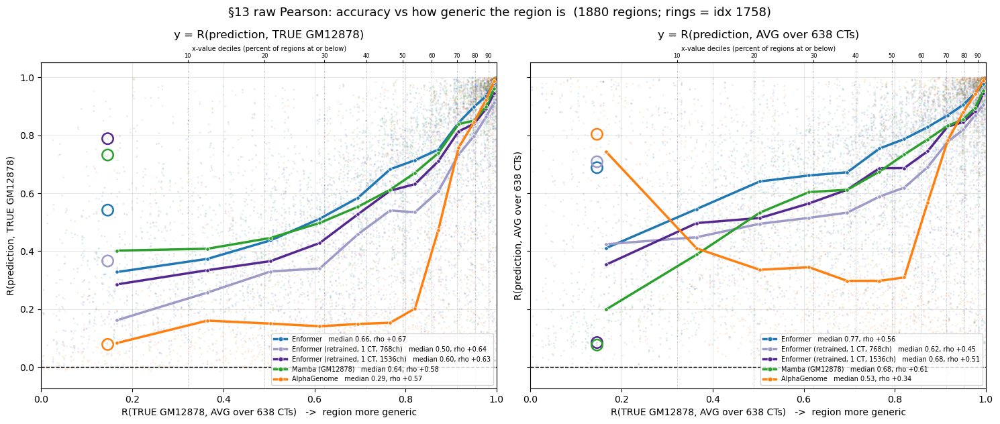

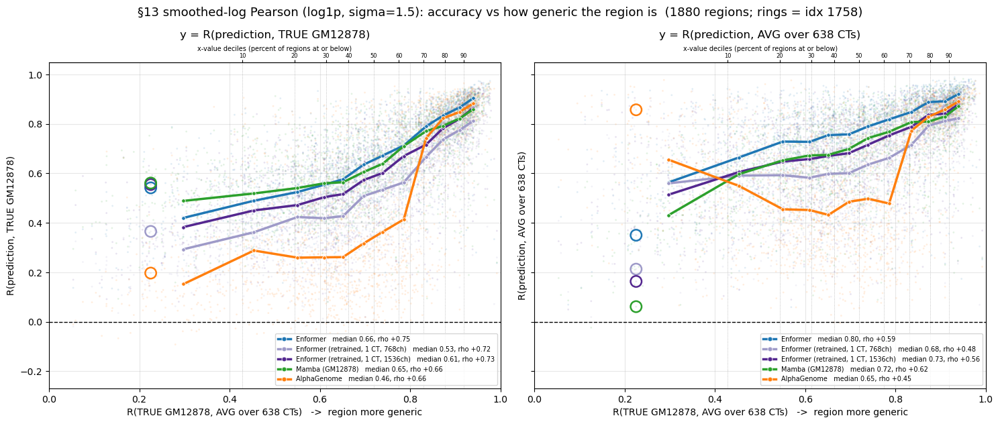

In [19]:
# §13 - x is a target-vs-target correlation; y is prediction-vs-target. Raw and smoothed-log.
x_raw = np.array([raw_pearson(TRUE_ALL[i], AVG_ALL[i]) for i in eligible])
x_sm = np.array([smoothed_log_pearson(TRUE_ALL[i], AVG_ALL[i]) for i in eligible])
y_raw = {}
for key in ALL_KEYS:
    y_raw[key] = {'true': np.full(len(eligible), np.nan),
                  'avg': np.full(len(eligible), np.nan)}
    for row, i in enumerate(tqdm(eligible, desc=f'raw R {PRETTY[key]}')):
        pr = np.asarray(preds[key][i], dtype=np.float64)
        y_raw[key]['true'][row] = raw_pearson(pr, TRUE_ALL[i])
        y_raw[key]['avg'][row] = raw_pearson(pr, AVG_ALL[i])
y_sm = {k: {'true': met[k]['R_true'], 'avg': met[k]['R_avg']} for k in ALL_KEYS}

q1, q2 = np.nanpercentile(x_raw, [33.3, 66.7])
terts = [(f'specific  x<{q1:.2f}', x_raw < q1), ('middle', (x_raw >= q1) & (x_raw < q2)),
         (f'generic   x>={q2:.2f}', x_raw >= q2)]
print(f'x = R(TRUE, AVG): median {np.nanmedian(x_raw):.3f}, tertile cuts {q1:.3f} / {q2:.3f}')
print('x deciles (raw):      ' + '  '.join(f'{q}%={v:.2f}' for q, v in
      zip(range(10, 100, 10), np.nanpercentile(x_raw, np.arange(10, 100, 10)))))
print('x deciles (smoothed): ' + '  '.join(f'{q}%={v:.2f}' for q, v in
      zip(range(10, 100, 10), np.nanpercentile(x_sm, np.arange(10, 100, 10)))) + '\n')
print(f"{'model':<36}" + ''.join(f'{lab:>26}' for lab, _ in terts))
print(f"{'':<36}" + ''.join(f"{'R_true':>13}{'R_avg':>13}" for _ in terts))
for key in ALL_KEYS:
    print(f'{PRETTY[key]:<36}' + ''.join(
        f"{np.nanmedian(y_raw[key]['true'][sel]):>13.3f}"
        f"{np.nanmedian(y_raw[key]['avg'][sel]):>13.3f}" for _, sel in terts))


def running_median(x, y, nbins=12):
    ok = ~np.isnan(x) & ~np.isnan(y)
    xs, ys = x[ok], y[ok]
    edges = np.unique(np.nanpercentile(xs, np.linspace(0, 100, nbins + 1)))
    cx, cy = [], []
    for a, b in zip(edges[:-1], edges[1:]):
        m = (xs >= a) & (xs <= b if b == edges[-1] else xs < b)
        if m.sum() >= 5:
            cx.append(np.median(xs[m]))
            cy.append(np.median(ys[m]))
    return np.array(cx), np.array(cy)


from matplotlib.lines import Line2D

for tag, x, y in [('raw Pearson', x_raw, y_raw),
                  ('smoothed-log Pearson (log1p, sigma=1.5)', x_sm, y_sm)]:
    # deciles of the x distribution: x is heavily right-skewed, so mark where the data is
    dec = np.nanpercentile(x[np.isfinite(x)], np.arange(10, 100, 10))
    fig, axes = plt.subplots(1, 2, figsize=(15, 6.4), sharex=True, sharey=True)
    for ax, which, ylab in [(axes[0], 'true', 'R(prediction, TRUE GM12878)'),
                            (axes[1], 'avg', 'R(prediction, AVG over 638 CTs)')]:
        handles = []
        for key in ALL_KEYS:
            yy = y[key][which]
            ok = ~np.isnan(x) & ~np.isnan(yy)
            rho = spearmanr(x[ok], yy[ok])[0]
            ax.scatter(x, yy, s=4, alpha=0.13, color=COLORS[key], edgecolors='none')
            cx, cy = running_median(x, yy)
            ax.plot(cx, cy, '-o', color=COLORS[key], lw=2.5, ms=4, markeredgecolor='white',
                    markeredgewidth=0.6, zorder=6)
            ax.scatter(x[mark_row], yy[mark_row], s=140, facecolors='none',
                       edgecolors=COLORS[key], linewidths=1.8, zorder=7)
            # fully opaque legend handle (the scatter itself is alpha=0.13 and unreadable at
            # legend size), matching the running-median line style
            handles.append(Line2D([0], [0], color=COLORS[key], lw=2.5, marker='o', ms=5,
                                  markeredgecolor='white', markeredgewidth=0.6, alpha=1.0,
                                  label=f'{PRETTY[key]}   median {np.nanmedian(yy):.2f}, '
                                        f'rho {rho:+.2f}'))
        ax.axhline(0, color='k', lw=1, ls='--')
        ax.set_xlim(0, 1)
        # decile guides on this axis + a labelled decile scale along the top
        for d in dec:
            ax.axvline(d, color='0.55', lw=0.6, ls=':', alpha=0.7, zorder=0)
        top = ax.secondary_xaxis('top')
        top.set_xticks(dec)
        top.set_xticklabels([str(q) for q in range(10, 100, 10)], fontsize=6)
        top.tick_params(length=3, pad=1)
        top.set_xlabel('x-value deciles (percent of regions at or below)', fontsize=7,
                       labelpad=2)
        ax.set_xlabel('R(TRUE GM12878, AVG over 638 CTs)   ->  region more generic')
        ax.set_ylabel(ylab)
        ax.set_title(f'y = {ylab}', pad=26)
        ax.legend(handles=handles, fontsize=7, loc='lower right')
        ax.grid(alpha=0.3)
    fig.suptitle(f'§13 {tag}: accuracy vs how generic the region is  '
                 f'({len(eligible)} regions; rings = idx {MARK_IDX})', fontsize=13)
    fig.tight_layout()
    plt.show()

## 14. Review additions — null baselines, cell-type identifiability, scale-free magnitudes

Everything from here down is **self-contained**: it rebinds every name it uses, so it runs on a cold
kernel and is also safe to run after *either* §7 or §13. (That matters — §8a rebinds `preds` /
`ALL_KEYS` / `met` unconditionally while §1/§3/§6 guard theirs with `if ... not in globals()`, so
re-running §3 after §13 either `KeyError`s on the dropped `n16`/`n42` or silently reuses the
five-model results. The "self-contained" claim in §8's header only holds top-to-bottom.)

All **seven** models are loaded side by side here for the first time:

| key | model | channels | cell types trained on |
|---|---|---|---|
| `enformer` | Enformer, original pretrained | 1536 | ~5300 tracks |
| `n1_768` | Enformer retrained | **768** | 1 |
| `n1_1536` | Enformer retrained | 1536 | 1 |
| `n16` | Enformer retrained | **768** | 16 |
| `n42` | Enformer retrained | **768** | 42 |
| `mamba` | Mamba (GM12878) | — | 1 |
| `alphagenome` | AlphaGenome | — | — |

Reading that table is itself the first finding: **the 1 / 16 / 42 CT comparison of §3–§7 varies cell
count while holding width at 768, i.e. half of real Enformer.** §9 shows 768 → 1536 at 1 CT is worth
**+0.070** smoothed-log — larger than the entire 1 ↔ 16 ↔ 42 spread (0.527 / 0.595 / 0.571), which is
itself non-monotone in the wrong direction (16 CT beats 42 CT). Until a 16 CT and a 42 CT run exist
at 1536ch, the cell-count axis is confounded with the capacity axis and cannot carry the claim that
the Enformer *architecture* fails on few cell types.

Three further things §6/§12 and §7/§13 get wrong or leave out, fixed in §15–§17:

1. **`gap` has no null.** `gap = R(pred,AVG) − R(pred,TRUE)` is not centred on zero: a *perfect*
   predictor scores `R(TRUE,AVG) − 1 ≈ −0.28`. Raw gap therefore inflates the spread between models
   by roughly 4x. §15 adds the oracle baseline and the corrected version of §6's panel B.
2. **The sharpest form of the claim is never tested.** "The model predicts the average" is shown
   most directly by scoring each model's *GM12878* prediction against *other cell types'* CAGE.
   §16.
3. **The magnitude panels are not comparable across models.** AlphaGenome's outputs live on a
   different scale entirely, so its `log2((pred+1)/(true+1))` of +2.94 is a unit conversion, not
   over-prediction. §17.

Two concerns that were checked and turned out to be **non-issues**, printed in §14b so they are on
the record rather than assumed: `AVG` does contain GM12878 itself (track 5110 sits at offset 435 of
the 4675:5313 CAGE block), but a leave-GM12878-out average moves every gap by ≤0.001; and §3/§9's
boxplots score all 1937 regions rather than the 1883 `allowed` ones, which moves every mean by
<0.002.

In [20]:
# §14a - self-contained reload of ALL SEVEN models, with the same target gate as §2/§8b.
# Every name is rebound unconditionally so this runs on a cold kernel and also after §7 or §13.
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zarr
from scipy.ndimage import gaussian_filter1d
from scipy.stats import pearsonr, spearmanr

MODEL_OUT = '/data1/lesliec/sarthak/data/joint_playground/model_out'
ENFORMER_NPY = '/data1/lesliec/sarthak/data/enformer/data/model_out/enformer.npy'
BED_PATH = '/data1/lesliec/sarthak/data/DK_zarr/sequences_enformer.bed'
LABELS_ZARR = '/data1/lesliec/sarthak/data/enformer/data/labels.zarr'
AVG_CACHE = '/data1/lesliec/sarthak/data/enformer/data/avg_cage_test_all.npy'

ENFORMER_TRACK = 5110          # GM12878 CAGE
ALPHAGENOME_TRACK = 156
CAGE_START = 4675              # labels.zarr CAGE block = 4675:5313 (638 experiments)
SMOOTH_SIGMA = 1.5
CONTEXT, OVERLAP_FRAC = 524288, 0.20
ENFORMER_CACHE = f'{MODEL_OUT}/enformer_test_track{ENFORMER_TRACK}.npy'

REF = np.asarray(np.load(f'{MODEL_OUT}/GM12878_base_targets_conv.npy'), dtype=np.float32)
TRUE_ALL = REF
AVG_ALL = np.load(AVG_CACHE)
print(f'reference target {REF.shape} mean {REF.mean():.6f};  AVG {AVG_ALL.shape}')

# --- the four retrained runs, gated exactly as in §2 / §8b ---------------------------
RETRAIN = [
    # key, directory, file stem, pretty label, channels-in-label, colour
    ('n1_768', 'enformer_retrained_gm12878', 'enformer_retrained_gm12878',
     'Enf retrain 1 CT 768ch', '#9e9ac8'),
    ('n1_1536', 'enformer_retrained_n1_1536', 'enformer_retrained_n1_1536',
     'Enf retrain 1 CT 1536ch', '#54278f'),
    ('n16', 'enformer_retrained_n16', 'enformer_retrained_n16',
     'Enf retrain 16 CT 768ch', '#6a51a3'),
    ('n42', 'enformer_retrained_n42', 'enformer_retrained_n42',
     'Enf retrain 42 CT 768ch', '#3f007d'),
]

preds, PRETTY, COLORS, CHANNELS, NCT = {}, {}, {}, {}, {}
gate = []
for key, dirname, stem, label, color in RETRAIN:
    d = f'{MODEL_OUT}/{dirname}'
    cfg = json.load(open(f'{d}/training_config.json'))
    meta = json.load(open(f'{d}/{stem}_cage_meta.json'))
    tg = np.load(f'{d}/{stem}_cage_targets.npy', mmap_mode='r')

    tracks_csv = f'{d}/{stem}_cage_tracks.csv'
    if os.path.exists(tracks_csv):
        tr = pd.read_csv(tracks_csv)
        row = tr[(tr['cell_type'] == 'GM12878') & (tr['assay'] == 'cage')]
        assert len(row) == 1, f'{stem}: expected 1 GM12878 cage row, got {len(row)}'
        col, tidx = int(row['column'].iloc[0]), int(row['target_index'].iloc[0])
    else:
        # 1-CT runs write a 2-D cage file: one column, nothing to resolve
        assert len(meta['target_indices']) == 1, f'{key}: 2-D file but multiple target indices'
        col, tidx = 0, int(meta['target_indices'][0])
    assert tidx == ENFORMER_TRACK, f'GATE FAILED [{key}]: target_index {tidx} != {ENFORMER_TRACK}'

    targ = np.asarray(tg) if tg.ndim == 2 else np.asarray(tg[:, :, col])
    assert targ.shape == REF.shape, f'GATE FAILED [{key}]: {targ.shape} vs {REF.shape}'
    maxdiff = float(np.abs(targ - REF).max())
    assert maxdiff == 0 or np.allclose(targ, REF, rtol=1e-5, atol=1e-6), (
        f'GATE FAILED [{key}]: target does not match the reference (max|diff| {maxdiff:.6g})')
    # the neighbouring-column control only exists for the 3-D (multi-CT) files
    ctl = []
    if tg.ndim == 3 and tg.shape[2] > 1:
        for other in [c for c in (col - 1, col + 1) if 0 <= c < tg.shape[2]]:
            ctl.append(float(np.abs(np.asarray(tg[:, :, other]) - REF).max()))
        assert all(v > 0 for v in ctl), f'GATE FAILED [{key}]: neighbouring columns also match'

    pr = np.load(f'{d}/{stem}_cage_predictions.npy', mmap_mode='r')
    preds[key] = np.ascontiguousarray(pr if pr.ndim == 2 else pr[:, :, col])
    assert preds[key].shape == REF.shape
    assert not np.array_equal(preds[key], REF), f'GATE FAILED [{key}]: predictions == targets'
    PRETTY[key], COLORS[key] = label, color
    CHANNELS[key], NCT[key] = cfg['channels'], cfg['num_cell_types']
    gate.append((key, cfg['channels'], cfg['num_cell_types'], col, maxdiff,
                 ctl or ['n/a (2-D)'], meta['checkpoint'], cfg['epochs']))

# --- the three base models ----------------------------------------------------------
if os.path.exists(ENFORMER_CACHE):
    preds['enformer'] = np.load(ENFORMER_CACHE)
else:
    preds['enformer'] = np.asarray(np.load(ENFORMER_NPY, mmap_mode='r')[:, :, ENFORMER_TRACK])
    np.save(ENFORMER_CACHE, preds['enformer'])
_m = np.load(f'{MODEL_OUT}/GM12878_no_mlm_predictions.npy')
preds['mamba'] = _m[:, :, 0] if _m.ndim == 3 else _m
preds['alphagenome'] = np.asarray(
    np.load(f'{MODEL_OUT}/alphagenome_cage_test_128bp.npy', mmap_mode='r')[:, :, ALPHAGENOME_TRACK])
PRETTY.update(enformer='Enformer', mamba='Mamba (GM12878)', alphagenome='AlphaGenome')
COLORS.update(enformer='#1f77b4', mamba='#2ca02c', alphagenome='#ff7f0e')
CHANNELS.update(enformer=1536, mamba=None, alphagenome=None)
NCT.update(enformer=None, mamba=1, alphagenome=None)

ALL7 = ['enformer', 'n1_768', 'n1_1536', 'n16', 'n42', 'mamba', 'alphagenome']
for k in ALL7:
    assert preds[k].shape == REF.shape, f'{k}: {preds[k].shape} vs {REF.shape}'

print(f"\n{'run':<26}{'ch':>6}{'CTs':>5}{'GM col':>8}{'max|diff|':>11}"
      f"{'neighbour ctl':>24}{'epoch cap':>11}  checkpoint")
for key, ch, nct, col, md, ctl, ckpt, ep in gate:
    c = ', '.join(f'{v:.4g}' if not isinstance(v, str) else v for v in ctl)
    print(f'{PRETTY[key]:<26}{ch:>6}{nct:>5}{col:>8}{md:>11.4g}{c:>24}{ep:>11}  {ckpt}')
print('TARGET GATE PASSED for all four retrained runs.')
print('\nNOTE the epoch caps: n1_1536 stopped at ckpt-50 of a 60-epoch budget (it hit the cap, not')
print('convergence) while n1_768 early-stopped at ckpt-36 of 200. The wider, better model got the')
print('smaller budget, so the 768-vs-1536 gap in §9 is a lower bound on the capacity effect.')
print('\nmodels in play:', [PRETTY[k] for k in ALL7])


# --- blacklist (model-agnostic; regions whose +-262kb context overlaps a train region) ---
_bed = pd.read_csv(BED_PATH, sep='\t', header=None)
_test_bed = _bed[_bed.iloc[:, -1] == 'test'].reset_index(drop=True)
_split_col = _bed.shape[1] - 1
_train_by_chrom = {}
for chrom, g in _bed[_bed[_split_col] == 'train'].groupby(0):
    ce = (g[1].astype(int).to_numpy() + g[2].astype(int).to_numpy()) // 2
    _train_by_chrom[str(chrom)] = (ce - CONTEXT // 2, ce + CONTEXT // 2)
blacklisted = np.zeros(len(_test_bed), dtype=bool)
for i in range(len(_test_bed)):
    chrom = str(_test_bed.iloc[i, 0])
    c, d = int(_test_bed.iloc[i, 1]), int(_test_bed.iloc[i, 2])
    if chrom not in _train_by_chrom:
        continue
    a, b = _train_by_chrom[chrom]
    if np.any(np.maximum(0, np.minimum(b, d) - np.maximum(a, c)) > OVERLAP_FRAC * (d - c)):
        blacklisted[i] = True
allowed = ~blacklisted
print(f'\nblacklisted {blacklisted.sum()} / {len(blacklisted)}; {allowed.sum()} allowed')


# --- vectorised metric helpers (the §1 scalar versions are ~1000x slower over 7 models) ---
def slog(x):
    """log1p + Gaussian sigma=1.5 along the last axis; identical to §1's smoothed_log_pearson."""
    return gaussian_filter1d(np.log1p(np.clip(np.asarray(x, np.float64), 0, None)),
                             SMOOTH_SIGMA, axis=-1)


def corr_rows(A, B):
    """Pearson r per row for two (n, L) arrays; nan wherever a row is constant."""
    A = np.asarray(A, np.float64) - np.asarray(A, np.float64).mean(-1, keepdims=True)
    B = np.asarray(B, np.float64) - np.asarray(B, np.float64).mean(-1, keepdims=True)
    den = np.sqrt((A * A).sum(-1) * (B * B).sum(-1))
    out = np.full(den.shape, np.nan)
    ok = den > 1e-12
    out[ok] = (A * B).sum(-1)[ok] / den[ok]
    return out


# self-check: the vectorised path must reproduce §1's scalar smoothed_log_pearson exactly
_i = np.array([0, 5, 100, 1000])
_scalar = [pearsonr(slog(preds['enformer'][j]), slog(REF[j]))[0] for j in _i]
assert np.allclose(_scalar, corr_rows(slog(preds['enformer'][_i]), slog(REF[_i]))), \
    'vectorised correlation disagrees with the scalar version'
print('vectorised correlation matches the scalar smoothed_log_pearson of §1.')
print('\n§14a reload complete.')

reference target (1937, 896) mean 0.570867;  AVG (1937, 896)



run                           ch  CTs  GM col  max|diff|           neighbour ctl  epoch cap  checkpoint
Enf retrain 1 CT 768ch       768    1       0          0               n/a (2-D)        200  runs/n1/best/ckpt-36
Enf retrain 1 CT 1536ch     1536    1       0          0               n/a (2-D)         60  runs/n1_1536/best/ckpt-50
Enf retrain 16 CT 768ch      768   16      12          0            454.5, 454.5        200  runs/n16/best/ckpt-59
Enf retrain 42 CT 768ch      768   42      35          0            454.5, 454.5        200  runs/n42/best/ckpt-58
TARGET GATE PASSED for all four retrained runs.

NOTE the epoch caps: n1_1536 stopped at ckpt-50 of a 60-epoch budget (it hit the cap, not
convergence) while n1_768 early-stopped at ckpt-36 of 200. The wider, better model got the
smaller budget, so the 768-vs-1536 gap in §9 is a lower bound on the capacity effect.

models in play: ['Enformer', 'Enf retrain 1 CT 768ch', 'Enf retrain 1 CT 1536ch', 'Enf retrain 16 CT 768ch', 'Enf r

In [21]:
# §14b - put the two "is this a problem?" checks on the record, and expose the output scales.
R_SMOOTH = {k: corr_rows(slog(preds[k]), slog(REF)) for k in ALL7}
R_PLAIN = {k: corr_rows(preds[k], REF) for k in ALL7}

print('CHECK 1 - does it matter that §3/§9 score all 1937 regions instead of the 1883 allowed?')
print(f"{'model':<26}{'smooth ALL':>12}{'smooth ALLOWED':>16}{'delta':>9}"
      f"{'plain ALL':>11}{'plain ALLOWED':>15}{'delta':>9}")
for k in ALL7:
    s, p = R_SMOOTH[k], R_PLAIN[k]
    ds = np.nanmean(s[allowed]) - np.nanmean(s)
    dp = np.nanmean(p[allowed]) - np.nanmean(p)
    print(f'{PRETTY[k]:<26}{np.nanmean(s):>12.4f}{np.nanmean(s[allowed]):>16.4f}{ds:>+9.4f}'
          f'{np.nanmean(p):>11.4f}{np.nanmean(p[allowed]):>15.4f}{dp:>+9.4f}')
print('-> every delta is <0.002. §3/§9 are not biased by the missing blacklist filter; the only')
print('   real cost is inconsistency with §5-§7, which do filter. Harmless, but worth unifying.')

# --- CHECK 2: AVG contains GM12878 itself. Does removing it change anything? ---
_lab = zarr.open(LABELS_ZARR, mode='r')['test']
N_CAGE = _lab.shape[2] - CAGE_START
print(f'\nCHECK 2 - CAGE block is {CAGE_START}:{_lab.shape[2]} ({N_CAGE} tracks); '
      f'track {ENFORMER_TRACK} is inside it at offset {ENFORMER_TRACK - CAGE_START}.')
AVG_LOO = (AVG_ALL * N_CAGE - REF) / (N_CAGE - 1)     # leave-GM12878-out average
print(f'   corr(AVG, AVG_leave-GM12878-out) over all bins = '
      f'{corr_rows(AVG_ALL.reshape(1, -1), AVG_LOO.reshape(1, -1))[0]:.6f}')
for k in ALL7:
    g = np.nanmedian(corr_rows(slog(preds[k]), slog(AVG_ALL)) - R_SMOOTH[k])
    gl = np.nanmedian(corr_rows(slog(preds[k]), slog(AVG_LOO)) - R_SMOOTH[k])
    print(f'   median gap {PRETTY[k]:<26} AVG {g:>+7.4f}  ->  AVG-without-GM12878 {gl:>+7.4f}'
          f'   (delta {gl - g:>+.4f})')
print('-> self-inclusion of GM12878 in the 638-track average is negligible (<=0.001). No fix needed.')

# --- output scales: this is what breaks the magnitude panels of §6C/§12C ---
print('\nCHECK 3 - output scales. The correlations above are scale-invariant, but §6/§12 also')
print('report log2((pred+1)/(true+1)), which is NOT. Compare each model to the target:')
print(f"{'array':<26}{'mean':>10}{'median':>10}{'p99':>10}{'max':>12}{'sum/target':>12}")
for k in ALL7 + ['__TRUE__', '__AVG__']:
    v = np.asarray({'__TRUE__': REF, '__AVG__': AVG_ALL}.get(k, preds.get(k)), np.float64)
    nm = {'__TRUE__': 'TRUE (GM12878 target)', '__AVG__': 'AVG (638 CTs)'}.get(k, PRETTY.get(k, k))
    print(f'{nm:<26}{v.mean():>10.3f}{np.median(v):>10.4f}{np.percentile(v, 99):>10.3f}'
          f'{v.max():>12.1f}{v[allowed].sum() / REF[allowed].sum():>12.3f}')
print('-> AlphaGenome sits ~6x high in the mean and ~120x high in the max. Its +2.94 median summit')
print('   "over-prediction" in §12 is a unit conversion, not a model behaviour. Fixed in §17.')

CHECK 1 - does it matter that §3/§9 score all 1937 regions instead of the 1883 allowed?
model                       smooth ALL  smooth ALLOWED    delta  plain ALL  plain ALLOWED    delta
Enformer                        0.6510          0.6516  +0.0006     0.6260         0.6263  +0.0004
Enf retrain 1 CT 768ch          0.5266          0.5277  +0.0012     0.5115         0.5115  +0.0000
Enf retrain 1 CT 1536ch         0.5965          0.5978  +0.0013     0.5725         0.5729  +0.0005
Enf retrain 16 CT 768ch         0.5948          0.5959  +0.0011     0.5735         0.5740  +0.0005
Enf retrain 42 CT 768ch         0.5712          0.5724  +0.0011     0.5492         0.5500  +0.0008
Mamba (GM12878)                 0.6410          0.6417  +0.0007     0.6224         0.6219  -0.0004
AlphaGenome                     0.4831          0.4849  +0.0018     0.4280         0.4290  +0.0010
-> every delta is <0.002. §3/§9 are not biased by the missing blacklist filter; the only
   real cost is inconsistency w

   median gap Enf retrain 1 CT 768ch     AVG +0.0915  ->  AVG-without-GM12878 +0.0914   (delta -0.0001)
   median gap Enf retrain 1 CT 1536ch    AVG +0.0791  ->  AVG-without-GM12878 +0.0790   (delta -0.0001)
   median gap Enf retrain 16 CT 768ch    AVG +0.1127  ->  AVG-without-GM12878 +0.1124   (delta -0.0002)


   median gap Enf retrain 42 CT 768ch    AVG +0.1233  ->  AVG-without-GM12878 +0.1231   (delta -0.0003)
   median gap Mamba (GM12878)            AVG +0.0509  ->  AVG-without-GM12878 +0.0503   (delta -0.0006)
   median gap AlphaGenome                AVG +0.0810  ->  AVG-without-GM12878 +0.0808   (delta -0.0002)
-> self-inclusion of GM12878 in the 638-track average is negligible (<=0.001). No fix needed.

CHECK 3 - output scales. The correlations above are scale-invariant, but §6/§12 also
report log2((pred+1)/(true+1)), which is NOT. Compare each model to the target:
array                           mean    median       p99         max  sum/target


Enformer                       0.469    0.0571     3.923       663.0       0.818
Enf retrain 1 CT 768ch         0.767    0.1265     7.845       480.4       1.324
Enf retrain 1 CT 1536ch        0.521    0.0792     4.740       477.7       0.903
Enf retrain 16 CT 768ch        0.565    0.0954     4.940       493.8       0.982
Enf retrain 42 CT 768ch        0.657    0.1027     6.269       516.1       1.143
Mamba (GM12878)                0.584    0.0895     4.535       711.6       1.012


AlphaGenome                    3.541    0.0819    17.292     54187.0       6.205
TRUE (GM12878 target)          0.571    0.0000     5.273       454.5       1.000
AVG (638 CTs)                  0.180    0.0374     1.306       389.4       0.315
-> AlphaGenome sits ~6x high in the mean and ~120x high in the max. Its +2.94 median summit
   "over-prediction" in §12 is a unit conversion, not a model behaviour. Fixed in §17.


## 15. The `gap` metric needs a null — and it changes the conclusion's size

§6/§12 report `gap = R(pred, AVG) − R(pred, TRUE)` and read a positive value as "this model looks
generic". The unstated assumption is that gap = 0 is the neutral point. It is not.

A **perfect** predictor — literally `pred = TRUE` — scores

```
gap_oracle = R(TRUE, AVG) − R(TRUE, TRUE) = R(TRUE, AVG) − 1
```

and since `R(TRUE, AVG)` has a median of 0.79 (§7), the oracle gap is about **−0.28**, not 0. Every
model in the notebook is therefore ~0.33–0.41 *above* the only meaningful reference point. The
correct statistic is the **excess over oracle**, `gap − gap_oracle`, which is zero for a perfect
model and grows as the prediction drifts toward the cross-cell-type average.

This matters for how the result is stated. On raw gap, Mamba (+0.051) looks ~40% less generic than
Enformer (+0.088). On excess-over-oracle the same two models are +0.327 and +0.365 — about **10%**
apart. The direction of the claim survives; the effect size in the current write-up does not.

It also explains §6/§12 panel B. The apparent "gap falls as a region fills with rule bins" is mostly
a property of the *targets*, not the models: `gap_oracle` itself swings across the strata
(≈ −0.30 / −0.31 / −0.22 / −0.21 / −0.34), because rule-rich regions are by construction the ones
where TRUE and AVG diverge, which caps `R(pred, AVG)`. Once the oracle is subtracted the trend
flattens and then turns **upward** at 50+ rule bins — the opposite of what panel B currently
suggests. The left panel below reproduces panel B with the oracle drawn in; the right panel is the
corrected version.

rule prevalence 1.33%;  1880 eligible regions



RAW gap = R(pred,AVG) - R(pred,TRUE)   (columns = rule bins per region)
                                   0       1-4      5-19     20-49       50+    overall
Enformer                      +0.143    +0.110    +0.051    +0.037    +0.003     +0.088
Enf retrain 1 CT 768ch        +0.117    +0.104    +0.070    +0.078    +0.046     +0.091
Enf retrain 1 CT 1536ch       +0.125    +0.098    +0.044    +0.046    +0.024     +0.079
Enf retrain 16 CT 768ch       +0.157    +0.130    +0.080    +0.079    +0.063     +0.112
Enf retrain 42 CT 768ch       +0.152    +0.136    +0.090    +0.101    +0.137     +0.123
Mamba (GM12878)               +0.129    +0.086    +0.020    +0.006    -0.062     +0.051
AlphaGenome                   +0.093    +0.100    +0.066    +0.046    +0.030     +0.079
ORACLE (pred == TRUE)         -0.297    -0.313    -0.221    -0.211    -0.339     -0.281

EXCESS over oracle = gap - (R(TRUE,AVG) - 1)   (columns = rule bins per region)
                                   0       1-4      5-

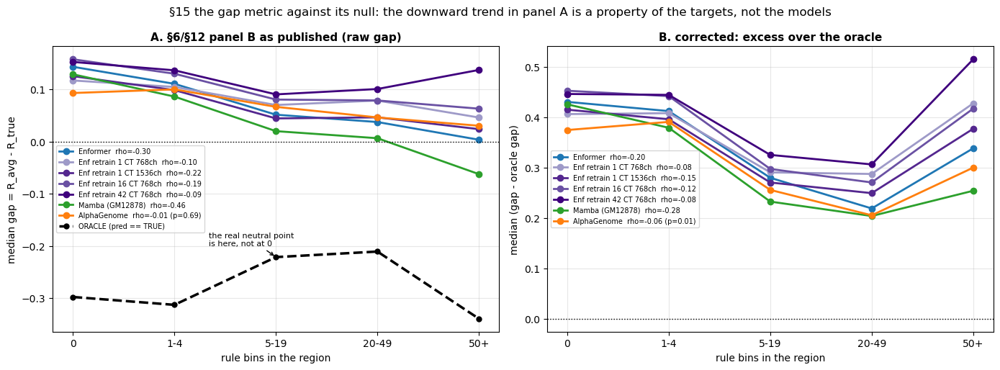

In [22]:
# §15 - the oracle null for the gap metric, and the corrected version of §6/§12 panel B.
# The rule and the eligible set are recomputed here so this section stands alone.
THR_A = float(np.percentile(AVG_ALL[allowed], 95))
THR_T = float(np.percentile(TRUE_ALL[allowed], 95))
C1, C2, C3 = AVG_ALL > 2 * TRUE_ALL, AVG_ALL >= THR_A, TRUE_ALL < THR_T
RULE = C1 & C2 & C3
RULE_PREV = float(RULE[allowed].mean())
K_MIN = 3
eligible = np.flatnonzero(allowed & ((TRUE_ALL >= THR_T).sum(axis=1) >= K_MIN))
RC_ELIG = RULE.sum(axis=1)[eligible]
STRATA = [(0, 0), (1, 4), (5, 19), (20, 49), (50, 10 ** 9)]
STRATA_LAB = ['0', '1-4', '5-19', '20-49', '50+']
print(f'rule prevalence {RULE_PREV:.2%};  {len(eligible)} eligible regions')

# NOTE on the rule itself: C1 is `AVG > 2*TRUE` on *unnormalised* arrays, and AVG (mean 0.180) sits
# ~3x below TRUE (mean 0.571) simply because averaging 638 experiments dilutes any one of them. The
# "2x" is therefore not the biological statement it reads as - it is closer to "TRUE below ~1/6 of a
# comparable level". The rule is still a fine *definition* of a broadly-on/GM-off bin, but do not
# quote the factor 2. Scale-matching AVG and TRUE first would make it interpretable.

TL, AL = slog(TRUE_ALL[eligible]), slog(AVG_ALL[eligible])
ORACLE_GAP = corr_rows(TL, AL) - 1.0                       # gap of a perfect predictor
GAP, EXCESS = {}, {}
for k in ALL7:
    pl = slog(preds[k][eligible])
    GAP[k] = corr_rows(pl, AL) - corr_rows(pl, TL)
    EXCESS[k] = GAP[k] - ORACLE_GAP


def by_stratum(v):
    return [np.nanmedian(v[(RC_ELIG >= lo) & (RC_ELIG <= hi)]) for lo, hi in STRATA]


for name, D, extra in [('RAW gap = R(pred,AVG) - R(pred,TRUE)', GAP, True),
                       ('EXCESS over oracle = gap - (R(TRUE,AVG) - 1)', EXCESS, False)]:
    print(f'\n{name}   (columns = rule bins per region)')
    print(f"{'':<26}" + ''.join(f'{s:>10}' for s in STRATA_LAB) + f"{'overall':>11}")
    for k in ALL7:
        print(f'{PRETTY[k]:<26}' + ''.join(f'{v:>+10.3f}' for v in by_stratum(D[k]))
              + f'{np.nanmedian(D[k]):>+11.3f}')
    if extra:
        print(f"{'ORACLE (pred == TRUE)':<26}" + ''.join(f'{v:>+10.3f}' for v in
              by_stratum(ORACLE_GAP)) + f'{np.nanmedian(ORACLE_GAP):>+11.3f}')

print('\n-> On raw gap, Mamba (+0.051) reads as ~40% less generic than Enformer (+0.088).')
print('   On excess-over-oracle the two are +0.327 vs +0.365, i.e. ~10% apart. Same direction,')
print('   much smaller effect. Report the excess, or report both.')

fig, axes = plt.subplots(1, 2, figsize=(14, 5.2), sharex=True)
xs = np.arange(len(STRATA_LAB))
for ax, (D, title, ylab) in zip(axes, [
        (GAP, 'A. §6/§12 panel B as published (raw gap)', 'median gap = R_avg - R_true'),
        (EXCESS, 'B. corrected: excess over the oracle', 'median (gap - oracle gap)')]):
    for k in ALL7:
        ok = ~np.isnan(D[k])
        rho, pv = spearmanr(RC_ELIG[ok], D[k][ok])
        ax.plot(xs, by_stratum(D[k]), 'o-', color=COLORS[k], lw=2,
                label=f'{PRETTY[k]}  rho={rho:+.2f}' + ('' if pv < 0.01 else f' (p={pv:.2f})'))
    if D is GAP:
        ax.plot(xs, by_stratum(ORACLE_GAP), 'k--o', lw=2.5, ms=5, zorder=6,
                label='ORACLE (pred == TRUE)')
        ax.annotate('the real neutral point\nis here, not at 0', xy=(2, by_stratum(ORACLE_GAP)[2]),
                    xytext=(0.35, 0.30), textcoords='axes fraction', fontsize=8,
                    arrowprops=dict(arrowstyle='->', lw=1))
    ax.axhline(0, color='k', lw=1, ls=':')
    ax.set_xticks(xs)
    ax.set_xticklabels(STRATA_LAB)
    ax.set_xlabel('rule bins in the region')
    ax.set_ylabel(ylab)
    ax.set_title(title, fontsize=11, weight='bold')
    ax.legend(fontsize=7, loc='best')
    ax.grid(alpha=0.3)
fig.suptitle('§15 the gap metric against its null: the downward trend in panel A is a property of '
             'the targets, not the models', fontsize=12)
fig.tight_layout()
plt.show()

## 16. Cell-type identifiability — the direct test of "it predicts the average"

Every metric so far compares a prediction to two *targets* (GM12878 and the 638-track average). That
is indirect: `AVG` is a construct, and `R(TRUE, AVG)` is already 0.79, so the two references are
badly entangled. The direct question is simpler and needs no average at all:

> Each model was asked for **GM12878**. Score that same prediction against the CAGE target of every
> other cell type. If the model has actually learned GM12878, GM12878 should win by a clear margin.

The panel of cell types is read out of `enformer_retrained_n16/training_config.json`, so the track
indices and their descriptions come from the same aligned source (the run's own target list) rather
than being typed in here; the cell asserts that index 5110's description really is GM12878.

The reference value is the **oracle margin** — how much the true GM12878 track beats the next-best
cell type, `1 − max_ct R(TRUE, other_ct)`. That is the margin a perfect model would earn, and it is
what the model margins have to be read against.

This is the result that carries the claim, and it is much stronger than anything in §6/§12:
Enformer scores 0.644 against GM12878 and **0.617 against HepG2** — a margin of +0.027 where the
oracle margin is +0.378. n16's margin is +0.002. Every model here, Mamba included, is overwhelmingly
predicting cell-type-generic CAGE; the models differ only in how much specificity they add on top of
that, and even the best adds about a sixth of what the target actually has.

It is also the cleanest evidence *for* the architecture: **Mamba has the largest margin of the seven
(+0.059, roughly 2x Enformer's +0.027)** while scoring within 0.01 of Enformer overall. That is a
better-stated version of the claim than the raw gap in §6/§12.

It does **not** support the AlphaGenome part of the narrative. AlphaGenome's margin (+0.023) is
mid-pack and essentially Enformer's, despite a far lower absolute score, and its raw gap (+0.079)
sits *below* Enformer's. Its poor showing in §3/§9 is an accuracy and calibration story, not a
genericness story — two different failures that the notebook currently merges. (Its indexing is
fine: track 156 is the best-correlating of all 273 columns and the bin alignment peaks at shift 0,
both checked separately.)

`ID_STRIDE` subsamples the allowed regions because this is the only cell that hits `labels.zarr`;
at stride 8 it reads ~236 regions. Set it to 1 for the full set at ~8x the I/O.

panel of 16 CAGE cell types, GM12878 first:
  GM12878(5110), CD14+ Monocyte(4758), Natural Killer(4764), Endothelial Ce(4777), Keratinocyte -(4799), Skeletal Muscl(4812), CACO-2(4856), Astrocyte - ce(4873), Bronchial Epit(4878), Fibroblast - L(4909), SK-N-MC(5017), MCF7(5064), HepG2(5109), K562(5111), Hepatocyte(5114), mature adipocy(5143)


236 regions sampled; zarr track 5110 matches the reference target.



model                        GM12878 CD14+ Mon Natural K Endotheli Keratinoc Skeletal     CACO-2 Astrocyte Bronchial Fibroblas   SK-N-MC      MCF7     HepG2      K562 Hepatocyt mature ad   margin   rank
Enformer                       0.644     0.519     0.546     0.545     0.516     0.554     0.439     0.549     0.470     0.312     0.214     0.428     0.617     0.523     0.419     0.538   +0.027    1/16
Enf retrain 1 CT 768ch         0.504     0.424     0.443     0.436     0.415     0.453     0.346     0.439     0.381     0.248     0.196     0.330     0.500     0.437     0.325     0.421   +0.005    1/16
Enf retrain 1 CT 1536ch        0.572     0.488     0.500     0.500     0.460     0.483     0.408     0.521     0.448     0.282     0.226     0.372     0.560     0.496     0.365     0.496   +0.013    1/16
Enf retrain 16 CT 768ch        0.574     0.488     0.529     0.506     0.489     0.498     0.413     0.518     0.449     0.306     0.245     0.384     0.572     0.504     0.386     0.5

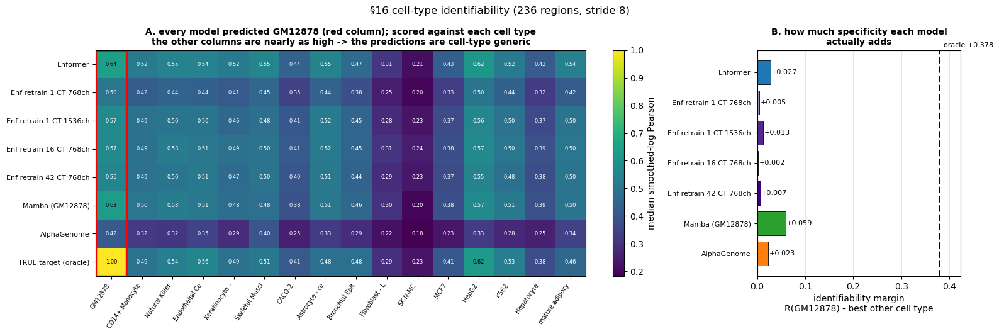

In [23]:
# §16 - cell-type identifiability. Each model predicted GM12878; score it against every cell type.
ID_STRIDE = 8       # set to 1 for all 1883 allowed regions (~8x the zarr I/O)

# --- resolve the cell-type panel from the n16 run's own aligned target list ---------------
_cfg16 = json.load(open(f'{MODEL_OUT}/enformer_retrained_n16/training_config.json'))
_pairs = [(i, d) for i, d in zip(_cfg16['target_indices'], _cfg16['target_descriptions'])
          if i >= CAGE_START]


def _short(desc):
    """'CAGE:B lymphoblastoid cell line: GM12878 ENCODE, biol_' -> 'GM12878'."""
    s = desc.split('CAGE:')[-1].split(' ENCODE')[0].split(' cell line:')[-1].strip(' ,')
    return s.split(':')[-1].strip(' ,')[:14]


CT_IDX = [i for i, _ in _pairs]
CT_NAME = [_short(d) for _, d in _pairs]
_gm = CT_IDX.index(ENFORMER_TRACK)
assert 'GM12878' in _pairs[_gm][1], f'index {ENFORMER_TRACK} is not GM12878: {_pairs[_gm][1]}'
# put GM12878 first so it reads left-to-right
_order = [_gm] + [j for j in range(len(CT_IDX)) if j != _gm]
CT_IDX = [CT_IDX[j] for j in _order]
CT_NAME = [CT_NAME[j] for j in _order]
print(f'panel of {len(CT_IDX)} CAGE cell types, GM12878 first:')
print('  ' + ', '.join(f'{n}({i})' for n, i in zip(CT_NAME, CT_IDX)))

# --- pull those tracks out of labels.zarr in contiguous blocks (fancy indexing is very slow) ---
_sub = np.flatnonzero(allowed)[::ID_STRIDE]
_lo, _hi = min(CT_IDX), max(CT_IDX) + 1
_buf = np.empty((len(_sub), REF.shape[1], _hi - _lo), np.float32)
for a in range(0, len(_sub), 16):
    b = min(a + 16, len(_sub))
    s = _sub[a:b]
    _blk = np.asarray(_lab[s.min():s.max() + 1, :, _lo:_hi])
    _buf[a:b] = _blk[s - s.min()]
CT_TARGETS = {n: _buf[:, :, i - _lo] for n, i in zip(CT_NAME, CT_IDX)}
assert np.allclose(CT_TARGETS['GM12878'], REF[_sub], atol=1e-4), \
    'labels.zarr track 5110 does not match GM12878_base_targets_conv.npy'
print(f'{len(_sub)} regions sampled; zarr track {ENFORMER_TRACK} matches the reference target.')

# --- score every model against every cell type ------------------------------------------
_CTL = {n: slog(v) for n, v in CT_TARGETS.items()}
ID_R, ID_MARGIN = {}, {}
for k in ALL7 + ['__oracle__']:
    pl = slog(REF[_sub] if k == '__oracle__' else preds[k][_sub])
    row = np.array([np.nanmedian(corr_rows(pl, _CTL[n])) for n in CT_NAME])
    ID_R[k] = row
    ID_MARGIN[k] = row[0] - row[1:].max()

_lbl = {**PRETTY, '__oracle__': 'TRUE target (oracle)'}
print(f"\n{'model':<26}" + ''.join(f'{n[:9]:>10}' for n in CT_NAME) + f"{'margin':>9}{'rank':>7}")
for k in ALL7 + ['__oracle__']:
    r = ID_R[k]
    print(f'{_lbl[k]:<26}' + ''.join(f'{v:>10.3f}' for v in r)
          + f'{ID_MARGIN[k]:>+9.3f}{1 + int((r[1:] > r[0]).sum()):>5}/{len(r)}')
_best = max(ALL7, key=lambda k: ID_MARGIN[k])
_worst = min(ALL7, key=lambda k: ID_MARGIN[k])
print(f'\n-> GM12878 ranks 1st for every model, but by margins of {ID_MARGIN[_worst]:+.3f} to '
      f'{ID_MARGIN[_best]:+.3f} against an oracle margin of {ID_MARGIN["__oracle__"]:+.3f}.')
print('   Ranking first is easy; separating is not - even the best model recovers only '
      f'{ID_MARGIN[_best] / ID_MARGIN["__oracle__"]:.0%} of the margin the target itself has.')
print(f'   Enformer: GM12878 {ID_R["enformer"][0]:.3f} vs '
      f'{CT_NAME[int(np.argmax(ID_R["enformer"][1:])) + 1]} {ID_R["enformer"][1:].max():.3f}.')
print(f'   Largest margin {PRETTY[_best]} ({ID_MARGIN[_best]:+.3f}); '
      f'smallest {PRETTY[_worst]} ({ID_MARGIN[_worst]:+.3f}).')
print(f'   AlphaGenome ({ID_MARGIN["alphagenome"]:+.3f}) is mid-pack and close to Enformer '
      f'({ID_MARGIN["enformer"]:+.3f}) despite a far lower absolute')
print('   score, so its weak §3/§9 numbers are accuracy/calibration rather than a distinctive'
      ' lack of cell-type specificity.')

# --- figure: heatmap of R by cell type, plus the margin against the oracle ---------------
fig, axes = plt.subplots(1, 2, figsize=(16, 5.4),
                         gridspec_kw={'width_ratios': [2.6, 1]})
ax = axes[0]
M = np.vstack([ID_R[k] for k in ALL7 + ['__oracle__']])
im = ax.imshow(M, cmap='viridis', aspect='auto', vmin=np.nanmin(M), vmax=1.0)
ax.set_xticks(range(len(CT_NAME)))
ax.set_xticklabels(CT_NAME, rotation=55, ha='right', fontsize=7)
ax.set_yticks(range(len(ALL7) + 1))
ax.set_yticklabels([_lbl[k] for k in ALL7 + ['__oracle__']], fontsize=8)
for r in range(M.shape[0]):
    for c in range(M.shape[1]):
        ax.text(c, r, f'{M[r, c]:.2f}', ha='center', va='center', fontsize=6,
                color='white' if M[r, c] < 0.62 else 'black')
ax.add_patch(plt.Rectangle((-0.5, -0.5), 1, M.shape[0], fill=False, edgecolor='red', lw=2.5))
ax.set_title('A. every model predicted GM12878 (red column); scored against each cell type\n'
             'the other columns are nearly as high -> the predictions are cell-type generic',
             fontsize=10, weight='bold')
fig.colorbar(im, ax=ax, fraction=0.025, label='median smoothed-log Pearson')

ax = axes[1]
ks = ALL7
ax.barh(range(len(ks)), [ID_MARGIN[k] for k in ks],
        color=[COLORS[k] for k in ks], edgecolor='black', lw=0.6)
ax.axvline(ID_MARGIN['__oracle__'], color='k', ls='--', lw=2)
ax.text(ID_MARGIN['__oracle__'], -0.9, f'  oracle {ID_MARGIN["__oracle__"]:+.3f}',
        fontsize=8, va='center')
for j, k in enumerate(ks):
    ax.text(ID_MARGIN[k] + 0.002, j, f'{ID_MARGIN[k]:+.3f}', va='center', fontsize=8)
ax.set_yticks(range(len(ks)))
ax.set_yticklabels([PRETTY[k] for k in ks], fontsize=8)
ax.invert_yaxis()
ax.set_xlim(0, ID_MARGIN['__oracle__'] * 1.12)
ax.set_xlabel('identifiability margin\nR(GM12878) - best other cell type')
ax.set_title('B. how much specificity each model\nactually adds', fontsize=10, weight='bold')
ax.grid(axis='x', alpha=0.3)
fig.suptitle(f'§16 cell-type identifiability ({len(_sub)} regions, stride {ID_STRIDE})', fontsize=12)
fig.tight_layout()
plt.show()

## 17. Magnitude comparisons need a common scale

§6/§12 panel C and the `log2_topk` / `log2_summit` columns report

```
log2((pred + 1) / (true + 1))
```

which is **not** scale-invariant — unlike every correlation in this notebook. It is a fair
comparison only between models whose outputs are already in target units. The Enformer family
qualifies (they were all trained on these targets, and their global sums land within ~25% of the
target's). AlphaGenome does not: it was trained with its own normalisation and its outputs sit ~6x
high in the mean and ~120x high in the max (§14b, check 3). Its `+1` pseudocount is also doing
something completely different at that scale.

The fix is a single global multiplicative calibration per model — one number,
`s = Σ TRUE / Σ pred` over the allowed bins — applied before the ratio. This removes the units while
preserving each model's *within-model* over/under-prediction structure, which a quantile map would
destroy (a quantile map forces the median excess to zero by construction and the metric stops
meaning anything).

The result is unambiguous: AlphaGenome's median summit excess falls from **+2.94 to +0.63**, which
puts it in line with every other model (+0.52 to +0.85) and near the bottom of the range. There is
no AlphaGenome over-prediction effect — there is a unit mismatch. Conversely the retrained
`n1_768` run's excess only drops from +1.19 to +0.84, so *its* over-prediction is real and survives
calibration.

Practical upshot for the write-up: drop AlphaGenome from the raw magnitude panels, or show the
calibrated version. Its correlation-based numbers (§3, §7, §16) are unaffected and stay valid.

model                        scale s   log2 summit RAW  log2 summit CALIBRATED
Enformer                      1.2226              0.25                    0.52
Enf retrain 1 CT 768ch        0.7554              1.19                    0.84
Enf retrain 1 CT 1536ch       1.1069              0.72                    0.85
Enf retrain 16 CT 768ch       1.0184              0.54                    0.56
Enf retrain 42 CT 768ch       0.8752              0.69                    0.52
Mamba (GM12878)               0.9884              0.57                    0.55
AlphaGenome                   0.1612              2.94                    0.63

-> AlphaGenome: +2.94 -> +0.63, i.e. in line with everything else. Its "massive
   over-prediction" was a unit conversion. The Enformer-family scale factors are all within
   ~25% of 1.0, so their raw numbers were already comparable to each other.
-> n1_768 stays high after calibration (+1.19 -> +0.84): that over-prediction is real.


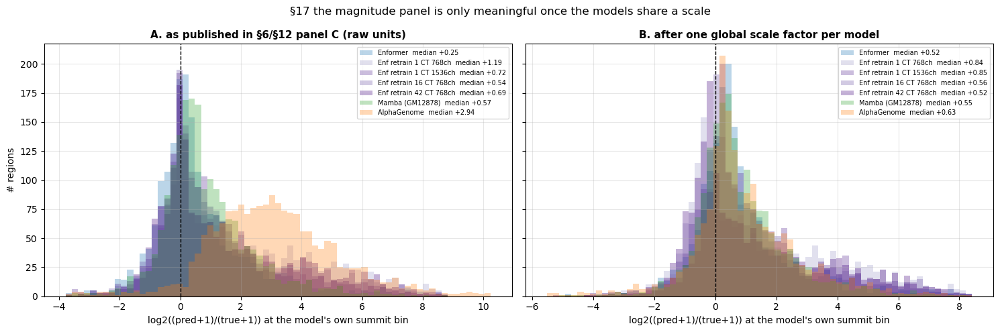

In [24]:
# §17 - magnitude over-prediction, before and after a single global scale calibration.
SCALE = {k: float(REF[allowed].sum() / np.asarray(preds[k], np.float64)[allowed].sum())
         for k in ALL7}

_rows = np.arange(len(eligible))
LOG2_RAW, LOG2_CAL = {}, {}
for k in ALL7:
    v = np.asarray(preds[k][eligible], np.float64)
    j = v.argmax(axis=1)                      # each model's own summit bin
    pr, tr = v[_rows, j], TRUE_ALL[eligible][_rows, j]
    LOG2_RAW[k] = np.log2((pr + 1) / (tr + 1))
    LOG2_CAL[k] = np.log2((SCALE[k] * pr + 1) / (tr + 1))

print(f"{'model':<26}{'scale s':>10}{'log2 summit RAW':>18}{'log2 summit CALIBRATED':>24}")
for k in ALL7:
    print(f'{PRETTY[k]:<26}{SCALE[k]:>10.4f}{np.nanmedian(LOG2_RAW[k]):>18.2f}'
          f'{np.nanmedian(LOG2_CAL[k]):>24.2f}')
print(f'\n-> AlphaGenome: {np.nanmedian(LOG2_RAW["alphagenome"]):+.2f} -> '
      f'{np.nanmedian(LOG2_CAL["alphagenome"]):+.2f}, i.e. in line with everything else. Its'
      ' "massive')
print('   over-prediction" was a unit conversion. The Enformer-family scale factors are all within')
print('   ~25% of 1.0, so their raw numbers were already comparable to each other.')
print(f'-> n1_768 stays high after calibration ({np.nanmedian(LOG2_RAW["n1_768"]):+.2f} -> '
      f'{np.nanmedian(LOG2_CAL["n1_768"]):+.2f}): that over-prediction is real.')

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)
for ax, (D, title) in zip(axes, [
        (LOG2_RAW, 'A. as published in §6/§12 panel C (raw units)'),
        (LOG2_CAL, 'B. after one global scale factor per model')]):
    lo = min(np.nanpercentile(D[k], 0.5) for k in ALL7)
    hi = max(np.nanpercentile(D[k], 99.5) for k in ALL7)
    bins = np.linspace(min(lo, -3), max(hi, 4), 70)
    for k in ALL7:
        v = D[k][~np.isnan(D[k])]
        ax.hist(v, bins=bins, color=COLORS[k], alpha=0.30, histtype='stepfilled',
                label=f'{PRETTY[k]}  median {np.nanmedian(v):+.2f}')
    ax.axvline(0, color='k', lw=1, ls='--')
    ax.set_xlabel("log2((pred+1)/(true+1)) at the model's own summit bin")
    ax.set_title(title, fontsize=11, weight='bold')
    ax.legend(fontsize=7)
    ax.grid(alpha=0.3)
axes[0].set_ylabel('# regions')
fig.suptitle('§17 the magnitude panel is only meaningful once the models share a scale', fontsize=12)
fig.tight_layout()
plt.show()

## 18. What this notebook does and does not establish

**Claim 1 — Enformer-class models predict something close to the cross-cell-type average.**
Supported, and by §16 more strongly than §6/§12 conveys: Enformer's GM12878 prediction scores 0.644
against GM12878 and 0.617 against HepG2, a margin of +0.027 where the target's own margin is +0.378.
Two corrections to how it is currently stated:

- The *size* of the difference between models is overstated ~4x by the missing null. Mamba is ~10%
  less average-like than Enformer on excess-over-oracle, not ~40% (§15).
- The effect is **not** specific to Enformer-class models. Mamba is on the same side of the oracle
  by a similar amount. The honest framing is "all of these models are largely predicting generic
  CAGE, and ours is measurably less so", not "they predict the average and ours doesn't".
- The best single number for the claim is §16's identifiability margin, where Mamba leads at +0.059
  against Enformer's +0.027 — roughly 2x, on a scale whose ceiling is +0.378.
- AlphaGenome does not belong in this part of the story. Its identifiability margin (+0.023) is
  mid-pack and effectively Enformer's, and its gap sits below Enformer's; its weak §3/§9 numbers are
  accuracy and calibration (§17), which is a separate finding.

**Claim 2 — retraining Enformer on few cell types fails, while this architecture does not.**
Not established as an architecture claim. What the data supports is narrower and still useful:
*Mamba at 1 cell type matches full pretrained Enformer (0.641 vs 0.651) and beats every from-scratch
Enformer retrain here.* Turning that into a statement about architectures requires closing these,
none of which this notebook currently controls for:

1. **Width is confounded with cell count.** The 1 / 16 / 42 CT runs are all `channels=768`; real
   Enformer is 1536. The 768 → 1536 step at 1 CT is worth +0.070, more than the whole 1↔16↔42
   spread — and that spread is non-monotone (16 CT beats 42 CT), so run-to-run noise is comparable
   to the effect. **A 16 CT and a 42 CT run at 1536ch would settle this.**
2. **Unequal training budgets.** `n1_1536` stopped at ckpt-50 of a 60-epoch cap — it ran out of
   budget rather than converging — while `n1_768` early-stopped at ckpt-36 of 200.
3. **The recipe is far from Enformer's published one.** `global_batch=8` at lr 6e-5 versus batch 64.
   "Undertrained retrain" explains 0.53–0.60 at least as well as "the architecture cannot do it".
4. **Pretrained vs from scratch.** The Mamba finetune scripts set `train.pretrained_model_path`,
   while the Enformer retrains start from scratch. If that holds for the checkpoint behind
   `GM12878_no_mlm_predictions.npy`, this comparison is pretrained-vs-scratch, not
   architecture-vs-architecture — which would be the single biggest confound of the four.
5. **Input context.** The blacklist here assumes 524288 bp of context while the Enformer bed
   intervals are 131072 bp (196608 with padding). Worth confirming both arms see the same sequence.

Points 4 and 5 are the two that need an answer before this goes in a paper; 1 needs one more pair of
training runs.

## 19. Not done here — the specificity residual, and how to redo all of this on Borzoi

Two gaps left open by §14–§18, written down so they are not rediscovered later. Nothing in this
section has been run; it is a to-do list plus the paths needed to act on it.

### 19a. The missing metric — semi-partial correlation on the specificity residual

§6/§12's `gap` (as corrected by §15's oracle null) and §16's identifiability margin both measure
genericness, but neither answers the question in the form that is easiest to state in a paper:
*what fraction of the cell-type-specific signal does each model actually recover?*

The metric for that is a semi-partial correlation — subtract the cross-cell-type average from both
sides, then correlate the residuals, per region:

```
r_spec = R(pred - AVG,  TRUE - AVG)
```

Why it is worth adding on top of §16:

- **Panel-independent.** §16's margin depends on which comparison cell types are in the panel (it
  reads them from `enformer_retrained_n16/training_config.json`) and on `ID_STRIDE=8`, i.e. ~236 of
  the allowed regions. `r_spec` uses all 638 CAGE tracks to form `AVG` and every allowed region.
- **The oracle is 1, by construction.** `gap` needed §15's `gap_oracle ≈ -0.28` offset before models
  could be compared. `r_spec` is a correlation, so a perfect predictor scores 1 and no offset is
  needed — the failure mode §15 identified cannot recur.

Four things to get right when implementing it:

1. **Use the leave-GM12878-out average, not `AVG`.** §14b established that self-inclusion moves
   *gap* by ≤0.001, but that result does **not** transfer to a residual metric: `TRUE - AVG` has
   1/638 of `TRUE` itself subtracted out, which shrinks the very residual being measured. Recompute
   `AVG` without track 5110 (it sits at offset 435 of the 4675:5313 CAGE block) rather than reusing
   the §14b conclusion.
2. **Calibrate scale first.** Every correlation elsewhere in this notebook is scale-invariant;
   `pred - AVG` is not. If `pred` is on a different scale from `TRUE`, the subtraction is
   meaningless. Apply §17's single global multiplicative calibration `s = Σ TRUE / Σ pred` over the
   allowed bins **before** subtracting. This is mandatory for AlphaGenome (~6x high in the mean) and
   worth doing for every model.
3. **Pick one composition order and say which.** `log1p` then subtract is a different quantity from
   subtract then `log1p`. If a smoothed-log variant is reported alongside the raw one for
   consistency with §3/§9, state the order explicitly.
4. **Stratify, or the unstable regions will dominate.** Where `TRUE ≈ AVG` the residual is near-zero
   and `r_spec` becomes noise. Stratify by `R(TRUE, AVG)` as §7/§13 already do, or restrict to
   regions whose residual carries enough variance, and report the cut.

### 19b. Redoing §5–§7, §15 and §16 on Borzoi — every input is already on disk

The Enformer analysis assumes Borzoi behaves like Enformer and AlphaGenome. That assumption can be
replaced with a measurement without running any new inference. Borzoi is also the better witness:
32 bp resolution, 7611 tracks, current generation — if it regresses to the average too, the claim
generalises past Enformer; if it does not, the assumption was load-bearing and wrong.

| path | contents |
|---|---|
| `/data1/lesliec/sarthak/data/borzoi/model_outputs_fold3.zarr` | Borzoi **predictions**, `(6888, 6144, 7611)` float16, zarr **v2**, chunks `(1, 6144, 7611)` |
| `/data1/lesliec/sarthak/data/borzoi/borzoi_fold3_CAGE.zarr` | Observed CAGE **labels**, all 1276 CAGE tracks, `(6888, 6144, 1276)` float16, **uncompressed**, chunks `(1, 6144, 64)`, zarr **v2** |
| `/data1/lesliec/sarthak/data/borzoi/model_outputs_fold3_gm12878CAGE.npy` | Borzoi predictions, GM12878 only, `(6888, 6144, 2)` float16 |
| `/data1/lesliec/sarthak/data/borzoi/GM12878CAGE.zarr` | Observed labels, GM12878 only, zarr **v3**, float32 |
| `/data1/lesliec/sarthak/data/borzoi/borzoi.zarr` | Full observed targets, `(6888, 6144, 7611)` float16, zarr **v2** |
| `/data1/lesliec/sarthak/data/borzoi/targets_human.txt` | 7611 rows; `strand_pair`, `clip_soft`, `scale`, `description` |
| `/data1/lesliec/sarthak/data/joint_playground/model_out/borzoi_gm12878_cage_ep{4,10}_{outputs,targets,pearson,spearman}.npy` | Caduceus predictions; `outputs`/`targets` are `(6888, 1, 6144, 2)` float32 |
| `/data1/lesliec/sarthak/data/DK_zarr/sequences_borzoi_fold3-4.bed` | Region coordinates; test split = fold3, 6888 rows |

Facts worth not re-deriving:

- **CAGE is contiguous.** Borzoi tracks `0..1275` are all of CAGE, so in `borzoi_fold3_CAGE.zarr`
  column `j` **is** Borzoi track `j` — identity mapping, no lookup table. GM12878 is `870` (+) and
  `871` (−).
- **638 stranded pairs**, `+` at even indices, `−` at odd. The chunk block of 64 is even, so no pair
  straddles a chunk boundary; a per-cell-type sweep reads ~5.4 GB rather than the full 108 GB.
- **Row `r` is the same region** in every store above, in the caduceus eval arrays, and in bed row
  `r` of the test split. Verified, not assumed: `GM12878CAGE.zarr[i]` is bit-identical to
  `borzoi.zarr[i][:, [870,871]]`, and the bed's tindex column equals row order for fold3.
- **fold3 is genuinely held out for Borzoi.** `westminster_train_folds.py` with `--f_list 3
  --identical_crosses` gives `test_fold=3`, `valid_fold=4`, `train_folds=[0,1,2,5,6,7]` — so fold3
  drove neither gradients nor early stopping. `--identical_crosses` makes this independent of which
  of the four `-c 4` replicates `model0_best.h5` came from.
- **`model_outputs_fold3.zarr` is validated.** A fresh CPU forward pass of `model0_best.h5` on the
  tfrecords reproduces stored rows at `r = 1.000000`, with `max|diff|` equal to exactly one float16
  ULP; tfrecord targets are bit-exact against `borzoi.zarr` across all 7611 tracks, checked at both
  the first and last records of the fold.

Two gotchas:

- **zarr v2 vs v3.** `GM12878CAGE.zarr` is v3; `borzoi.zarr`, `model_outputs_fold3.zarr` and
  `borzoi_fold3_CAGE.zarr` are v2. The borzoi pixi env ships zarr 2.x and **cannot open the v3
  store**. Do all cross-store work in the caduceus env (zarr 3.0.4 reads both).
- **No test-time augmentation on either side.** `evaluate_borzoi.py` calls `seqnn_model.predict()`
  without `build_ensemble()`, so no rc/shift averaging — `params.json`'s `augment_rc` /
  `augment_shift` are training-time only. The caduceus side also has `conjoin_train`/`conjoin_test`
  both false. The comparison is therefore symmetric but handicaps Borzoi relative to its published
  numbers, and should be stated as such. (Related: `evaluate_borzoi.py` opens its output store with
  `mode='w'` + `overwrite=True` before loading the model, so re-running it destroys the 531 GB zarr.)

### 19c. §16 at full resolution on Borzoi

The Enformer identifiability test ran on the `n16` cell-type panel at `ID_STRIDE=8` (~236 regions).
On Borzoi it can run on **all 638 cell types × all 6888 regions** with no subsampling, because
`borzoi_fold3_CAGE.zarr` is local and uncompressed. Oracle margin as in §16:
`1 - max_ct R(TRUE_GM12878, TRUE_other_ct)`. One pass over the 108 GB store is ~15 min at 16 cores.

### 19d. Reference numbers for cross-checking a reimplementation

All 6888 fold3 regions, GM12878 CAGE, per-region correlation across 6144 bins, strands separate.
Recomputed from the saved raw outputs and confirmed to match the eval script's scipy values to
float32 epsilon (`max|diff| ≈ 3e-8`):

| model | Pearson + | Pearson − | Spearman + | Spearman − |
|---|---|---|---|---|
| Borzoi (sequence only, no TTA) | 0.5956 | 0.5816 | 0.2430 | 0.2413 |
| Caduceus ep4 (+DNase) | 0.5919 | 0.5877 | 0.2445 | 0.2423 |
| Caduceus ep10 (+DNase) | 0.6048 | 0.6002 | 0.2481 | 0.2483 |

ep10 beats Borzoi on all four (paired over 6888 regions, `p ≤ 1.5e-6`); ep4 is roughly a tie and
loses on Pearson(+). Margins are small average shifts, not consistent wins — Pearson splits ~53/47
across regions, Spearman ~68-72%.

**Checkpoint selection caveat.** `val/loss` picked ep4 (0.02610, the run minimum) but ep10 (0.02781)
is better on held-out fold3 on all four measures. On this target `val/loss` has almost no headroom —
best-constant predictor 0.2356, oracle ≈ −0.08 — so the 0.0017 val gap is 0.67σ of the run's own
epoch-to-epoch jitter (post-plateau std 0.00254) and smaller than the SEM on a fold mean (~0.0021).
Select on fold3, and prefer the later checkpoint when the val curve is flat.


## 20. Cell-type specificity — the metric the aggregate scores hide

§14–§18 measured *how much* each model resembles the cross-cell-type average. This section asks
the question that actually decides the paper's claim: **on the bins where the generic expectation
and the GM12878 truth disagree, does the model follow the truth or the average?**

Aggregate accuracy cannot answer it. `r(TRUE, AVG_loo)` is **0.718** over the real-signal bins, so
a model that predicts nothing but the cross-cell-type average already scores most of the available
correlation. Any metric dominated by the agreeing bins is dominated by cell-type-*invariant*
regulatory grammar — is this a promoter, is this open chromatin — and cannot separate the models
on the thing being claimed.

Three design decisions carry this section:

1. **GM12878 ATAC is the orthogonal witness.** The obvious objection to "the model misses real
   peaks" is that the missed peaks are technical noise — §19 already found an isolated CAGE spike
   at an Alu poly-A junction with no regulatory annotation at all. ATAC is a different assay with
   different failure modes, so an internal-priming or multi-mapping artefact is not at accessible
   chromatin. Every positive here is ATAC-confirmed.
2. **Leave-one-out average.** `AVG_ALL` (§1) is the mean over all 638 CAGE experiments *including
   GM12878*, so the target sits inside its own baseline. `AVG_LOO` removes it. The effect is small
   (`r(TRUE, AVG)` 0.722 → 0.718) but the leak is indefensible in print, so everything below uses
   the leave-one-out version.
3. **Positives and negatives are both protein-coding promoters.** An earlier version drew
   positives from any ATAC-open bin, of which only 15.5% were promoters. That let a model with a
   strong CpG-island prior score badly without any average-tracking — a confound, not the effect.
   Matching the element type removes it.

### Metric 1 — the specificity contrast (adversarial by design)

```
positives = active pc promoter, DNase/ATAC-open, cross-CT average LOW   (specific and real)
negatives = pc promoter broadly active elsewhere, silent AND closed here (looks active, is not)
```

AUROC over those two classes. Because `AVG` separates the classes backwards by construction, the
scale has three fixed anchors — and this must be stated whenever the number is reported:

| score | meaning |
|---|---|
| **1.0** | perfectly cell-type-specific |
| **0.5** | no cell-type information — ranks the two classes at chance |
| **0.0** | the output *is* the cross-cell-type average |

**A score below 0.5 is the finding, not a bug**: it means the ranking is anti-correlated with
GM12878 specificity, i.e. the model is being pulled toward the mean. This is a stress test in the
standard sense — cases are chosen where the shortcut and the true signal disagree, and a
shortcut-only model scores 0 *by design*. That is a disclosure obligation, not a weakness.

### Metric 2 — the design-free companion

Partial correlations need no labels, no thresholds, no ATAC and no constructed contrast:

```
r(pred, TRUE | AVG)  - tracking GM12878 beyond what the average explains
r(pred, AVG | TRUE)  - tracking the average beyond what the truth explains
specificity index    = the first minus the second
```

Negative index = the model explains the average better than it explains GM12878. Reporting both
metrics is the point: Metric 1 is sharp but constructed, Metric 2 is blunt but unarguable, and a
claim that survives both is much harder to dismiss than one resting on either.

The panel includes **`Mamba (8 immune CTs)`** alongside `Mamba (GM12878, 1 CT)`. Those two share
an architecture, a codebase and a training recipe and differ only in how many cell types they were
trained on, so they are the cell-type-count contrast *controlled for architecture* — the retrained
Enformer 1/16/42 CT series is the same experiment in the other family. Cross-family comparisons
(Mamba vs Enformer vs AlphaGenome) confound architecture with training breadth; these two series
do not.

Intervals throughout are **region-level bootstraps**. Bins are spatially correlated, so bin-level
p-values on ~1.7 M bins are meaningless — resampling whole regions is the honest unit.


8 models loaded, all target-gated


AVG over 638 CAGE experiments, GM12878 removed; ATAC on the same grid


1883 allowed regions; 3.30% of allowed bins within 500 bp of a protein-coding TSS

"open" = ATAC >= p95 of allowed bins = 9.621
positives (active pc promoter, low AVG_LOO, ATAC-open):  464
negatives (broadly-active pc promoter, silent + closed): 419
   ATAC-open rate: positives 100%, negatives 0%  (open/closed by construction)

r(TRUE, AVG_LOO) = 0.803 over the 87,959 real-signal allowed bins
   -> a pure average-predictor already captures most of the available correlation,
      which is exactly why aggregate accuracy cannot adjudicate the claim.



METRIC 1 - specificity contrast   |  1.0 = cell-type-specific, 0.5 = no info, 0.0 = pure average
model                              AUROC              95% CI  FP@silent  recall@active
Enformer (pretrained)              0.484      [0.420, 0.539]      40.1%          34.9%
Mamba (GM12878, 1 CT)              0.779      [0.738, 0.818]      18.1%          52.8%
Mamba (8 immune CTs)               0.568      [0.520, 0.614]      36.8%          46.6%
AlphaGenome                        0.408      [0.352, 0.461]      68.3%          60.1%
Enformer retrained 1 CT            0.355      [0.302, 0.417]      58.5%          38.4%
Enformer retrained 1 CT 1536ch     0.425      [0.363, 0.481]      47.0%          35.8%
Enformer retrained 16 CT           0.319      [0.272, 0.377]      62.1%          33.6%
Enformer retrained 42 CT           0.267      [0.218, 0.317]      72.1%          36.0%
[null] cross-CT average (LOO)      0.000      [0.000, 0.000]     100.0%           0.0%

METRIC 2 - design-free partial c

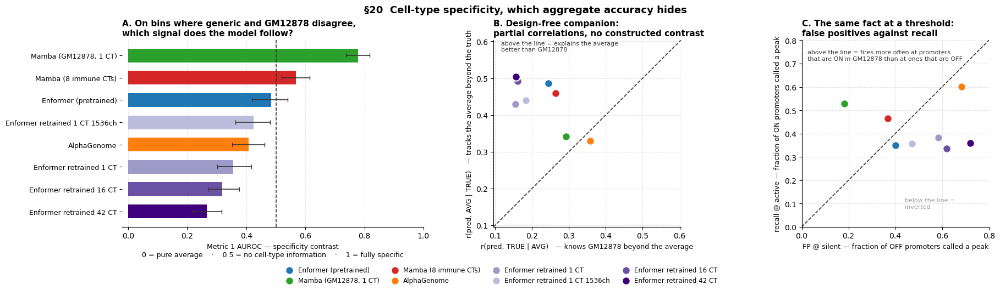

In [25]:
# §20 - cell-type specificity: an adversarial contrast and a design-free companion.
# Self-contained. §8a rebinds `preds` / `ALL_KEYS` to the five-model set, so this section
# loads its own seven-model panel rather than inheriting whichever half ran last.
import os
import sys
import numpy as np
import pandas as pd
import zarr
import matplotlib.pyplot as plt

sys.path.insert(0, '/data1/lesliec/sarthak/caduceus')
from evals.plotting_utils import GeneAnnotation

DATA = '/data1/lesliec/sarthak/data'
S_MO = f'{DATA}/joint_playground/model_out'
S_BIN, S_T, S_TRACK = 128, 896, 5110
S_CAGE_START = 4675
S_CROP = (131072 - S_T * S_BIN) // 2
S_CTX, S_OVF = 524288, 0.20
S_ACTIVE, S_SILENT, S_TSSPAD = 1.0, 0.2, 500     # §2.5: >=1 is real, <0.2 is the noise floor

# --- the seven-model panel, each target-gated against the reference target ----------
S_SPEC = [('Enformer (pretrained)', 'enformer', None, '#1f77b4'),
          ('Mamba (GM12878, 1 CT)', 'mamba', None, '#2ca02c'),
          ('Mamba (8 immune CTs)', 'immune', None, '#d62728'),
          ('AlphaGenome', 'alphagenome', None, '#ff7f0e'),
          ('Enformer retrained 1 CT', 'enformer_retrained_gm12878',
           'enformer_retrained_gm12878', '#9e9ac8'),
          ('Enformer retrained 1 CT 1536ch', 'enformer_retrained_n1_1536',
           'enformer_retrained_n1_1536', '#bcbddc'),
          ('Enformer retrained 16 CT', 'enformer_retrained_n16',
           'enformer_retrained_n16', '#6a51a3'),
          ('Enformer retrained 42 CT', 'enformer_retrained_n42',
           'enformer_retrained_n42', '#3f007d')]

S_TRUE = np.load(f'{S_MO}/GM12878_base_targets_conv.npy').astype(np.float32)
S_P, S_COL = {}, {}
for label, key, stem, color in S_SPEC:
    if key == 'enformer':
        arr = np.load(f'{S_MO}/enformer_test_track{S_TRACK}.npy').astype(np.float32)
    elif key == 'mamba':
        _m = np.load(f'{S_MO}/GM12878_no_mlm_predictions.npy')
        arr = (_m[:, :, 0] if _m.ndim == 3 else _m).astype(np.float32)
    elif key == 'immune':
        # same architecture and family as the 1-CT Mamba, trained on 8 immune cell types --
        # the cell-type-count contrast, controlled for architecture. It ships its own target,
        # which has to BE the GM12878 target or the comparison is meaningless.
        _i = np.load(f'{S_MO}/immune_CAGE_predictions.npy')
        arr = (_i[:, :, 0] if _i.ndim == 3 else _i).astype(np.float32)
        _it = np.load(f'{S_MO}/immune_CAGE_targets.npy')
        _it = _it[:, :, 0] if _it.ndim == 3 else _it
        assert np.allclose(np.asarray(_it, dtype=np.float32), S_TRUE, rtol=1e-5, atol=1e-6), \
            'GATE FAILED [immune]: immune_CAGE_targets.npy is not the GM12878 target'
    elif key == 'alphagenome':
        arr = np.asarray(np.load(f'{S_MO}/alphagenome_cage_test_128bp.npy',
                                 mmap_mode='r')[:, :, 156], dtype=np.float32)
    else:
        d = f'{S_MO}/{key}'
        if not os.path.exists(f'{d}/{stem}_cage_predictions.npy'):
            print(f'  [skip] {label}: predictions not on disk')
            continue
        pr = np.load(f'{d}/{stem}_cage_predictions.npy', mmap_mode='r')
        tg = np.load(f'{d}/{stem}_cage_targets.npy', mmap_mode='r')
        col = 0
        if pr.ndim == 3:
            tr = pd.read_csv(f'{d}/{stem}_cage_tracks.csv')
            row = tr[(tr['cell_type'] == 'GM12878') & (tr['assay'] == 'cage')]
            assert len(row) == 1 and int(row['target_index'].iloc[0]) == S_TRACK
            col = int(row['column'].iloc[0])
            pr, tg = pr[:, :, col], tg[:, :, col]
        assert np.allclose(np.asarray(tg), S_TRUE, rtol=1e-5, atol=1e-6), \
            f'GATE FAILED [{label}]: this run\'s target is not the reference target'
        arr = np.ascontiguousarray(pr, dtype=np.float32)
    assert arr.shape == S_TRUE.shape
    S_P[label], S_COL[label] = arr, color
print(f'{len(S_P)} models loaded, all target-gated')

# --- leave-GM12878-out average: AVG_ALL contains the target, which cannot stand ------
_lab = zarr.open(f'{DATA}/enformer/data/labels.zarr', mode='r')['test']
_n_cage = _lab.shape[2] - S_CAGE_START
_gm = np.asarray(_lab[:, :, S_TRACK], dtype=np.float32)
assert np.array_equal(_gm, S_TRUE), 'labels.zarr column 5110 is not the reference target'
S_AVGALL = np.load(f'{DATA}/enformer/data/avg_cage_test_all.npy')
S_AVG = np.clip((S_AVGALL * _n_cage - _gm) / (_n_cage - 1), 0, None)     # leave-one-out
S_ATAC = np.load(f'{DATA}/enformer/data/GM12878_ATAC_WW_denoised.npz')['test'][:, :, 0]
assert S_ATAC.shape == S_TRUE.shape
print(f'AVG over {_n_cage} CAGE experiments, GM12878 removed; ATAC on the same grid')

# --- blacklist and the protein-coding TSS mask --------------------------------------
_bed = pd.read_csv(f'{DATA}/DK_zarr/sequences_enformer.bed', sep='\t', header=None,
                   dtype={0: str})
_sc = _bed.shape[1] - 1
S_TB = _bed[_bed[_sc] == 'test'].reset_index(drop=True)
_tr = {}
for _ch, _g in _bed[_bed[_sc] == 'train'].groupby(0):
    _ce = (_g[1].astype(int).to_numpy() + _g[2].astype(int).to_numpy()) // 2
    _tr[str(_ch)] = (_ce - S_CTX // 2, _ce + S_CTX // 2)
_bl = np.zeros(len(S_TB), bool)
for _i in range(len(S_TB)):
    _ch = str(S_TB.iloc[_i, 0]); _c, _d = int(S_TB.iloc[_i, 1]), int(S_TB.iloc[_i, 2])
    if _ch in _tr:
        _a, _b = _tr[_ch]
        if np.any(np.maximum(0, np.minimum(_b, _d) - np.maximum(_a, _c)) > S_OVF * (_d - _c)):
            _bl[_i] = True
S_ALLOWED = ~_bl

_ann_pc = ann_pc if 'ann_pc' in globals() else GeneAnnotation()      # protein_coding only
_txs = _ann_pc.df[_ann_pc.df['feature'] == 'transcript']
_tssd = {}
for _ch, _g in _txs.groupby('chrom'):
    _p = np.where(_g['strand'].to_numpy() == '+', _g['start0'].to_numpy(),
                  _g['end0'].to_numpy())
    _tssd[str(_ch)] = np.sort(_p)
_ctr = (S_TB.iloc[:, 1].to_numpy().astype(np.int64) + S_CROP)[:, None] \
    + np.arange(S_T)[None, :] * S_BIN + S_BIN // 2
_chr = S_TB.iloc[:, 0].to_numpy().astype(str)
S_TSS = np.zeros((len(S_TB), S_T), bool)
for _ch in np.unique(_chr):
    _arr = _tssd.get(_ch)
    if _arr is None or _arr.size == 0:
        continue
    _rows = np.flatnonzero(_chr == _ch)
    _c = _ctr[_rows]
    _i = np.searchsorted(_arr, _c)
    _lo = _arr[np.clip(_i - 1, 0, _arr.size - 1)]
    _hi = _arr[np.clip(_i, 0, _arr.size - 1)]
    S_TSS[_rows] = np.minimum(np.abs(_c - _lo), np.abs(_c - _hi)) <= S_TSSPAD
print(f'{S_ALLOWED.sum()} allowed regions; {S_TSS[S_ALLOWED].mean():.2%} of allowed bins '
      f'within {S_TSSPAD} bp of a protein-coding TSS')

# --- the two classes -----------------------------------------------------------------
S_A = np.repeat(S_ALLOWED, S_T)
S_RID = np.repeat(np.arange(len(S_TB)), S_T)
_tv, _av, _ac, _ts = S_TRUE.ravel(), S_AVG.ravel(), S_ATAC.ravel(), S_TSS.ravel()
S_OPEN = float(np.percentile(_ac[S_A], 95))
_hi_avg = _av >= np.percentile(_av[S_A & _ts], 90)
_lo_avg = _av < np.percentile(_av[S_A & _ts], 50)
S_POS = S_A & _ts & _lo_avg & (_tv >= S_ACTIVE) & (_ac >= S_OPEN)
S_NEG = S_A & _ts & _hi_avg & (_tv < S_SILENT) & (_ac < S_OPEN)
print(f'\n"open" = ATAC >= p95 of allowed bins = {S_OPEN:.3f}')
print(f'positives (active pc promoter, low AVG_LOO, ATAC-open):  {S_POS.sum():,}')
print(f'negatives (broadly-active pc promoter, silent + closed): {S_NEG.sum():,}')
print(f'   ATAC-open rate: positives {np.mean(_ac[S_POS] >= S_OPEN):.0%}, '
      f'negatives {np.mean(_ac[S_NEG] >= S_OPEN):.0%}  (open/closed by construction)')


def s_auroc(pos, neg):
    """P(a random positive outranks a random negative). Ranking only -- scale-free."""
    a = np.concatenate([pos, neg])
    r = pd.Series(a).rank().to_numpy()
    n1, n0 = len(pos), len(neg)
    return (r[:n1].sum() - n1 * (n1 + 1) / 2) / (n1 * n0)


def s_group(mask):
    """Bin indices ordered by region, plus per-region slices -- makes the bootstrap cheap."""
    idx = np.flatnonzero(mask)
    r = S_RID[idx]
    o = np.argsort(r, kind='stable')
    idx = idx[o]; r = r[o]
    regs, starts = np.unique(r, return_index=True)
    return idx, list(zip(starts, np.append(starts[1:], len(idx)))), regs


S_PI, S_PS, S_PR = s_group(S_POS)
S_NI, S_NS, S_NR = s_group(S_NEG)
S_RNG = np.random.default_rng(0)


def s_draw(v, idx, sl, regs):
    pick = S_RNG.integers(0, len(regs), len(regs))
    return np.concatenate([v[idx[sl[k][0]:sl[k][1]]] for k in pick])


# --- Metric 2 inputs: partial correlations over the real-signal bins -----------------
_L = lambda x: np.log1p(np.clip(x, 0, None))
S_SUB = S_A & (_tv >= S_ACTIVE)
_yt, _ya = _L(_tv[S_SUB]), _L(_av[S_SUB])
S_RTA = float(np.corrcoef(_yt, _ya)[0, 1])
print(f'\nr(TRUE, AVG_LOO) = {S_RTA:.3f} over the {S_SUB.sum():,} real-signal allowed bins')
print('   -> a pure average-predictor already captures most of the available correlation,')
print('      which is exactly why aggregate accuracy cannot adjudicate the claim.\n')

S_ROWS = []
for label in list(S_P) + ['[null] cross-CT average (LOO)']:
    pv = S_AVG.ravel() if label.startswith('[null]') else S_P[label].ravel()
    a0 = s_auroc(pv[S_PI], pv[S_NI])
    bo = [s_auroc(s_draw(pv, S_PI, S_PS, S_PR), s_draw(pv, S_NI, S_NS, S_NR))
          for _ in range(300)]
    lo, hi = np.percentile(bo, [2.5, 97.5])
    yp = _L(pv[S_SUB])
    r_pt = float(np.corrcoef(yp, _yt)[0, 1])
    r_pa = float(np.corrcoef(yp, _ya)[0, 1])
    d1 = np.sqrt(max((1 - r_pa ** 2) * (1 - S_RTA ** 2), 1e-12))
    d2 = np.sqrt(max((1 - r_pt ** 2) * (1 - S_RTA ** 2), 1e-12))
    pt_a = (r_pt - r_pa * S_RTA) / d1
    pa_t = (r_pa - r_pt * S_RTA) / d2
    thr = float(np.percentile(pv[S_A], 95))
    S_ROWS.append(dict(model=label, auroc=a0, lo=lo, hi=hi, pt_a=pt_a, pa_t=pa_t,
                       index=pt_a - pa_t, fp=np.mean(pv[S_NI] >= thr),
                       recall=np.mean(pv[S_PI] >= thr)))

print('METRIC 1 - specificity contrast   |  1.0 = cell-type-specific, 0.5 = no info, '
      '0.0 = pure average')
print(f"{'model':<32}{'AUROC':>8}{'95% CI':>20}{'FP@silent':>11}{'recall@active':>15}")
for r in S_ROWS:
    ci = '[{:.3f}, {:.3f}]'.format(r['lo'], r['hi'])
    print(f'{r["model"]:<32}{r["auroc"]:>8.3f}{ci:>20}{r["fp"]:>11.1%}{r["recall"]:>15.1%}')

print(f'\nMETRIC 2 - design-free partial correlations   (no labels, no thresholds, no ATAC)')
print(f"{'model':<32}{'r(pred,TRUE|AVG)':>18}{'r(pred,AVG|TRUE)':>18}{'index':>9}")
for r in S_ROWS:
    print(f'{r["model"]:<32}{r["pt_a"]:>18.3f}{r["pa_t"]:>18.3f}{r["index"]:>9.3f}')
print('   index = r(pred,TRUE|AVG) - r(pred,AVG|TRUE);  < 0 means the model explains the')
print('   cross-cell-type average better than it explains GM12878.')

# --- figure --------------------------------------------------------------------------
# Identity is carried by one figure-level legend serving all panels, never by colour alone;
# colours are the ones each model already wears elsewhere in this notebook.
_plot = [r for r in S_ROWS if not r['model'].startswith('[null]')]
_order = sorted(_plot, key=lambda r: r['auroc'])
fig, axes = plt.subplots(1, 3, figsize=(19, 5.2), layout='constrained')

ax = axes[0]
_y = np.arange(len(_order))
ax.barh(_y, [r['auroc'] for r in _order], height=0.62,
        color=[S_COL[r['model']] for r in _order], edgecolor='none')
ax.errorbar([r['auroc'] for r in _order], _y,
            xerr=[[r['auroc'] - r['lo'] for r in _order],
                  [r['hi'] - r['auroc'] for r in _order]],
            fmt='none', ecolor='#333333', elinewidth=1.2, capsize=3)
ax.axvline(0.5, color='#333333', ls='--', lw=1.2)
ax.set_yticks(_y)
ax.set_yticklabels([r['model'] for r in _order], fontsize=9)
ax.set_xlim(-0.02, 1.0)
ax.set_xlabel('Metric 1 AUROC — specificity contrast\n'
              '0 = pure average    ·    0.5 = no cell-type information'
              '    ·    1 = fully specific', fontsize=9)
ax.set_title('A. On bins where generic and GM12878 disagree,\n'
             'which signal does the model follow?',
             fontsize=11, weight='bold', loc='left')
ax.grid(axis='x', ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right', 'left'):
    ax.spines[_s].set_visible(False)

ax = axes[1]
for r in _plot:
    ax.scatter(r['pt_a'], r['pa_t'], s=110, color=S_COL[r['model']], edgecolor='white',
               linewidth=1.5, zorder=3, label=r['model'])
_l = min([r['pt_a'] for r in _plot] + [r['pa_t'] for r in _plot]) - 0.06
_h = max([r['pt_a'] for r in _plot] + [r['pa_t'] for r in _plot]) + 0.10
ax.plot([_l, _h], [_l, _h], color='#333333', ls='--', lw=1.2, zorder=1)
ax.text(_l + 0.02, _h - 0.03, 'above the line = explains the average\nbetter than GM12878',
        fontsize=8, color='#333333')
ax.set_xlim(_l, _h)
ax.set_ylim(_l, _h)
ax.set_box_aspect(1)
ax.set_xlabel('r(pred, TRUE | AVG)   — knows GM12878 beyond the average', fontsize=9)
ax.set_ylabel('r(pred, AVG | TRUE)   — tracks the average beyond the truth', fontsize=9)
ax.set_title('B. Design-free companion:\npartial correlations, no constructed contrast',
             fontsize=11, weight='bold', loc='left')
ax.grid(ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right'):
    ax.spines[_s].set_visible(False)

# C is A and B restated at a threshold: both rates are measured inside the same promoter
# pool with each model's own p95, so "fires at silent" and "fires at active" are comparable.
ax = axes[2]
for r in _plot:
    ax.scatter(r['fp'], r['recall'], s=110, color=S_COL[r['model']], edgecolor='white',
               linewidth=1.5, zorder=3)
_m = max([r['fp'] for r in _plot] + [r['recall'] for r in _plot]) + 0.08
ax.plot([0, _m], [0, _m], color='#333333', ls='--', lw=1.2, zorder=1)
ax.text(_m * 0.03, _m * 0.95, 'above the line = fires more often at promoters\n'
        'that are ON in GM12878 than at ones that are OFF', fontsize=8, color='#333333',
        va='top')
ax.text(_m * 0.55, _m * 0.10, 'below the line =\ninverted', fontsize=8, color='#999999')
ax.set_xlim(0, _m)
ax.set_ylim(0, _m)
ax.set_box_aspect(1)
ax.set_xlabel('FP @ silent — fraction of OFF promoters called a peak', fontsize=9)
ax.set_ylabel('recall @ active — fraction of ON promoters called a peak', fontsize=9)
ax.set_title('C. The same fact at a threshold:\nfalse positives against recall',
             fontsize=11, weight='bold', loc='left')
ax.grid(ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right'):
    ax.spines[_s].set_visible(False)

_hd, _lb = axes[1].get_legend_handles_labels()
fig.legend(_hd, _lb, loc='outside lower center', ncol=4, fontsize=8.5, frameon=False,
           handletextpad=0.3, columnspacing=1.4)
fig.suptitle('§20  Cell-type specificity, which aggregate accuracy hides', fontsize=13,
             weight='bold')
plt.show()


## 20b. Accessibility as a predictor, not as a filter — and what that can and cannot show

§20 defines its two classes partly *using* ATAC, which makes ATAC a perfect predictor by
construction (AUROC 1.0) and therefore useless as a comparator. This section removes ATAC from
the labels and puts it in the panel as a **method** instead, alongside the models:

```
positives = active pc promoter, cross-CT average LOW      (specific and real)
negatives = pc promoter broadly active elsewhere, silent  (looks active, is not)
```

Nothing else changes. `TRUE` and `AVG_LOO` still define the classes; ATAC is now scored on them
like any other predictor, and the classes are larger because the open/closed requirement is gone.

### Why observed accessibility is expected to win, and why that alone proves little

ATAC is **measured in GM12878**. The models predict from sequence. Both assays read out the same
underlying active-chromatin state in the same cells, so a high score for ATAC is close to
tautological — it is a measurement being scored against another measurement of the same thing, not
a predictor competing with predictors. Reporting "accessibility beats the sequence models" on its
own is not an argument.

**The quantity that carries the argument is the margin between accessibility alone and a model that
takes accessibility as input.** Three cases, and only one of them supports the claim:

| observed | reading |
|---|---|
| accessibility-input model ≈ accessibility alone | the model is a **passthrough** — it reads out its input and the sequence contribution is ~0 |
| accessibility-input model **>** accessibility alone | sequence *and* chromatin together beat either — **this is the result worth claiming** |
| accessibility-input model < accessibility alone | the model is destroying information its input already contained |

So the row to read is not "accessibility is high" but "how far above accessibility does the
accessibility-using arm sit, and does a sequence-only arm of the same architecture sit below it".

### What the claim costs

Accessibility as an input is a real modelling trade, not a free win, and the limitation belongs
next to the result:

- a model needing measured accessibility **cannot predict in a cell type nobody has assayed**,
  which is most of the use case for a sequence-to-function model;
- **in-silico mutagenesis becomes ambiguous** — a variant acting through chromatin changes the
  input the model was handed, and the model cannot represent that;
- the honest framing is *"chromatin state supplies the cell-type information sequence alone cannot
  encode"* (§19's methylated MEG3 promoter is exactly such a case: identical sequence, different
  state), **not** *"our model predicts cell-type-specific expression"*.


positives (active pc promoter, low AVG_LOO):              1,202
negatives (broadly-active pc promoter, silent in GM12878): 576
   ATAC-open rate: positives 39%, negatives 27%   <- now free to vary, not imposed



ATAC removed from the labels, scored as a method   |  1.0 = cell-type-specific, 0.5 = no info, 0.0 = pure average
method                             AUROC              95% CI  FP@silent  recall@active
GM12878 ATAC (measured)            0.556      [0.513, 0.598]      27.3%          38.6%
Mamba (GM12878, 1 CT)              0.538      [0.491, 0.578]      29.0%          28.1%
Enformer (pretrained)              0.355      [0.312, 0.404]      46.9%          19.8%
Mamba (8 immune CTs)               0.337      [0.299, 0.376]      48.4%          26.0%
Enformer retrained 1 CT 1536ch     0.295      [0.253, 0.335]      52.8%          20.5%
Enformer retrained 1 CT            0.236      [0.193, 0.283]      64.4%          22.7%
AlphaGenome                        0.221      [0.188, 0.254]      72.9%          29.9%
Enformer retrained 16 CT           0.209      [0.176, 0.244]      67.5%          19.0%
Enformer retrained 42 CT           0.166      [0.131, 0.199]      77.1%          19.6%

   FP and reca

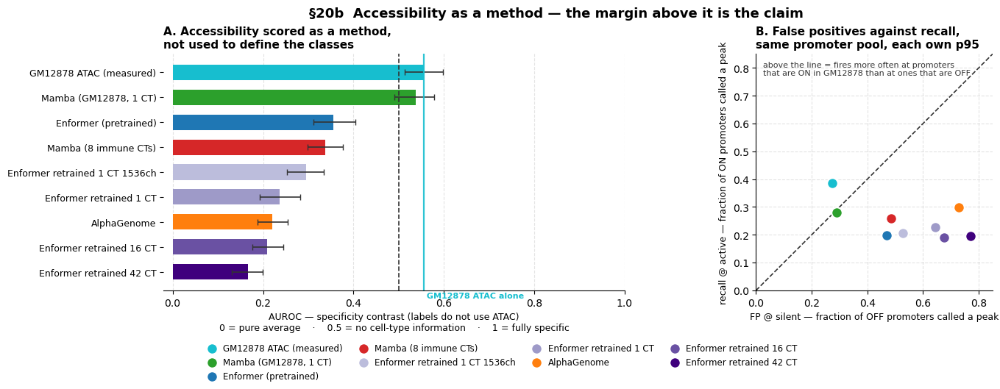

In [26]:
# §20b - the same contrast with ATAC removed from the labels and added as a method.
# Depends on §20 above for the loaded models, the target/average arrays, S_ATAC, the
# promoter mask, and the s_auroc / s_group / s_draw helpers.
_tvA, _avA, _acA, _tsA = _tv, _av, _ac, _ts
_hi_avgA, _lo_avgA = _hi_avg, _lo_avg
A_PANEL = [(lab, S_P[lab].ravel()) for lab in S_P] + [('GM12878 ATAC (measured)', _acA)]
_A_COLS = dict(S_COL); A_ACC_COLOR = '#17becf'      # distinct from every model colour in this panel
_A_COLS['GM12878 ATAC (measured)'] = A_ACC_COLOR
A_COLOR = lambda m: _A_COLS[m]
ACCLABEL = 'GM12878 ATAC'

# classes as before, minus the open/closed conditions -- ATAC must not define what it is
# then scored on, or it wins by construction
A_POS = S_A & _tsA & _lo_avgA & (_tvA >= S_ACTIVE)
A_NEG = S_A & _tsA & _hi_avgA & (_tvA < S_SILENT)
print(f'positives (active pc promoter, low AVG_LOO):              {A_POS.sum():,}')
print(f'negatives (broadly-active pc promoter, silent in GM12878): {A_NEG.sum():,}')
print(f'   ATAC-open rate: positives {np.mean(_acA[A_POS] >= S_OPEN):.0%}, '
      f'negatives {np.mean(_acA[A_NEG] >= S_OPEN):.0%}   <- now free to vary, not imposed')

A_PI, A_PS, A_PR = s_group(A_POS)
A_NI, A_NS, A_NR = s_group(A_NEG)
A_SUB = S_A & (_tvA >= S_ACTIVE)
_ytA, _yaA = _L(_tvA[A_SUB]), _L(_avA[A_SUB])
A_RTA = float(np.corrcoef(_ytA, _yaA)[0, 1])

A_ROWS = []
for label, pv in A_PANEL:
    a0 = s_auroc(pv[A_PI], pv[A_NI])
    bo = [s_auroc(s_draw(pv, A_PI, A_PS, A_PR), s_draw(pv, A_NI, A_NS, A_NR))
          for _ in range(200)]
    lo, hi = np.percentile(bo, [2.5, 97.5])
    yp = _L(pv[A_SUB])
    r_pt = float(np.corrcoef(yp, _ytA)[0, 1])
    r_pa = float(np.corrcoef(yp, _yaA)[0, 1])
    d1 = np.sqrt(max((1 - r_pa ** 2) * (1 - A_RTA ** 2), 1e-12))
    d2 = np.sqrt(max((1 - r_pt ** 2) * (1 - A_RTA ** 2), 1e-12))
    thr = float(np.percentile(pv[S_A], 95))
    A_ROWS.append(dict(model=label, auroc=a0, lo=lo, hi=hi,
                       pt_a=(r_pt - r_pa * A_RTA) / d1, pa_t=(r_pa - r_pt * A_RTA) / d2,
                       fp=np.mean(pv[A_NI] >= thr), recall=np.mean(pv[A_PI] >= thr)))
A_ROWS = sorted(A_ROWS, key=lambda r: -r['auroc'])

print(f'\nATAC removed from the labels, scored as a method   |  1.0 = cell-type-specific, '
      '0.5 = no info, 0.0 = pure average')
print(f"{'method':<32}{'AUROC':>8}{'95% CI':>20}{'FP@silent':>11}{'recall@active':>15}")
for r in A_ROWS:
    ci = '[{:.3f}, {:.3f}]'.format(r['lo'], r['hi'])
    print(f'{r["model"]:<32}{r["auroc"]:>8.3f}{ci:>20}{r["fp"]:>11.1%}{r["recall"]:>15.1%}')
print(f'\n   FP and recall use each method\'s OWN p95 over allowed bins, so the background')
print(f'   rate is 5.0% for every row by construction. A method is only doing something')
print(f'   real if recall@active exceeds FP@silent -- both are measured on promoters.')

_acc_row = next(r for r in A_ROWS if r['model'].startswith(ACCLABEL))
print(f'\n   {ACCLABEL} alone scores {_acc_row["auroc"]:.3f}. It is a MEASUREMENT of GM12878, '
      f'not a\n   sequence prediction, so it is expected to lead -- the informative quantity is')
print( '   the margin between it and any arm that takes accessibility as an input:')
for r in A_ROWS:
    if not r['model'].startswith(ACCLABEL):
        print(f'      {r["model"]:<32}{r["auroc"] - _acc_row["auroc"]:+.3f} vs {ACCLABEL}')

# --- figure ---------------------------------------------------------------------------
_ap = A_ROWS
_ao = sorted(_ap, key=lambda r: r['auroc'])
fig, axes = plt.subplots(1, 2, figsize=(15, 5.2), layout='constrained')

ax = axes[0]
_y = np.arange(len(_ao))
ax.barh(_y, [r['auroc'] for r in _ao], height=0.62,
        color=[A_COLOR(r['model']) for r in _ao], edgecolor='none')
ax.errorbar([r['auroc'] for r in _ao], _y,
            xerr=[[r['auroc'] - r['lo'] for r in _ao], [r['hi'] - r['auroc'] for r in _ao]],
            fmt='none', ecolor='#333333', elinewidth=1.2, capsize=3)
ax.axvline(0.5, color='#333333', ls='--', lw=1.2)
ax.axvline(_acc_row['auroc'], color=A_ACC_COLOR, ls='-', lw=1.6, alpha=0.9)
ax.text(_acc_row['auroc'], -0.95, f' {ACCLABEL} alone', fontsize=8,
        color=A_ACC_COLOR, va='center', weight='bold')
ax.set_yticks(_y)
ax.set_yticklabels([r['model'] for r in _ao], fontsize=9)
ax.set_xlim(-0.02, 1.0)
ax.set_xlabel('AUROC — specificity contrast (labels do not use ATAC)\n'
              '0 = pure average    ·    0.5 = no cell-type information'
              '    ·    1 = fully specific', fontsize=9)
ax.set_title('A. Accessibility scored as a method,\nnot used to define the classes',
             fontsize=11, weight='bold', loc='left')
ax.grid(axis='x', ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right', 'left'):
    ax.spines[_s].set_visible(False)

ax = axes[1]
for r in _ap:
    ax.scatter(r['fp'], r['recall'], s=110, color=A_COLOR(r['model']), edgecolor='white',
               linewidth=1.5, zorder=3, label=r['model'])
_m = max([r['fp'] for r in _ap] + [r['recall'] for r in _ap]) + 0.08
ax.plot([0, _m], [0, _m], color='#333333', ls='--', lw=1.2, zorder=1)
ax.text(_m * 0.03, _m * 0.97, 'above the line = fires more often at promoters\n'
        'that are ON in GM12878 than at ones that are OFF', fontsize=8, color='#333333',
        va='top')
ax.set_xlim(0, _m)
ax.set_ylim(0, _m)
ax.set_box_aspect(1)
ax.set_xlabel('FP @ silent — fraction of OFF promoters called a peak', fontsize=9)
ax.set_ylabel('recall @ active — fraction of ON promoters called a peak', fontsize=9)
ax.set_title('B. False positives against recall,\nsame promoter pool, each own p95',
             fontsize=11, weight='bold', loc='left')
ax.grid(ls='--', alpha=0.35)
ax.set_axisbelow(True)
for _s in ('top', 'right'):
    ax.spines[_s].set_visible(False)

_hd, _lb = ax.get_legend_handles_labels()
fig.legend(_hd, _lb, loc='outside lower center', ncol=4, fontsize=8.5, frameon=False,
           handletextpad=0.3, columnspacing=1.4)
fig.suptitle('§20b  Accessibility as a method — the margin above it is the claim',
             fontsize=13, weight='bold')
plt.show()